In [1]:
import os
import scipy.io as sio
import matplotlib.pyplot as plt
%matplotlib notebook
import numpy as np
import h5py
from oasis.functions import deconvolve
from oasis import oasisAR1, oasisAR2
import pyute as ut

from importlib import reload
reload(ut)
import scipy.ndimage.filters as sfi
import scipy.stats as sst
import scipy.ndimage.measurements as snm
from mpl_toolkits.mplot3d import Axes3D
import size_contrast_analysis as sca
reload(sca)
import retinotopy_analysis as rt
reload(rt)
import naka_rushton_analysis as nra
import pdb
import sklearn
import pickle as pkl

/home/mossing/Documents/code/downloads/OASIS/oasis/functions.py:14: UserWarning: Could not find cvxpy. Don't worry, you can still use OASIS, just not the slower interior point methods we compared to in the papers.
  "just not the slower interior point methods we compared to in the papers.")


In [22]:
run_cutoff = 7
ctr_cutoff = 5
rf_mapping_pval_cutoff = 0.05

modal_usize = np.array([  5., 8.21865442, 13.50925609, 22.20558144, 36.5])
modal_ucontrast = np.array([0, 6, 12, 25, 50, 100])

def compute_tuning_curves(data_struct,run_cutoff=run_cutoff,ctr_cutoff=ctr_cutoff,rf_mapping_pval_cutoff=rf_mapping_pval_cutoff):
#     trialavg = {}
    strialavg = {}
    usize = {}
    ucontrast = {}
    session_ids = [x for x in data_struct.keys() if not x[0]=='_']
    for session_id in session_ids:
        ds = data_struct[session_id] #[()]
        #trialavg[session_id] = [None]*2
        strialavg[session_id] = [None]*2
        usize[session_id] = ds['stimulus_size_deg'][()]
        ucontrast[session_id] = 100*ds['stimulus_contrast'][()]
        for run_status in range(2):
            running = (ds['running_speed_cm_s'][()]>run_cutoff)==run_status # true where animal's running status agrees with the one being analyzed
            if np.nanmean(running)>0.4: # include only sessions where there were enough trials in the relevant running condition
                nsize = len(ds['stimulus_size_deg'][()])
                ncontrast = len(ds['stimulus_contrast'][()])
                nangle = len(ds['stimulus_direction'][()])
                responsive = ds['rf_mapping_pval'][()]<rf_mapping_pval_cutoff
                centered = ds['rf_distance_deg'][()]<ctr_cutoff
                gd_roi = np.logical_and(responsive,centered)
                nroi = ds['decon'][()][gd_roi].shape[0]
#                 trialavg[session_id][run_status] = np.zeros((nroi,nsize,ncontrast,nangle))
                strialavg[session_id][run_status] = np.zeros((nroi,nsize,ncontrast,nangle))
                for i in range(nsize):
                    for j in range(ncontrast):
                        for k in range(nangle):
                            size_id = ds['stimulus_id'][()][0]
                            contrast_id = ds['stimulus_id'][()][1]
                            angle_id = ds['stimulus_id'][()][2]
                            gd_stimulus = np.logical_and(angle_id==k,np.logical_and(size_id==i,contrast_id==j))
                            gd_trial = np.logical_and(gd_stimulus,running)
                            strialavg[session_id][run_status][:,i,j,k] = np.nanmean(ds['decon'][()][gd_roi][:,gd_trial],axis=1)
                            #trialavg[session_id][run_status][:,i,j,k] = np.nanmean(ds['calcium_responses_au'][()][gd_roi][:,gd_trial],axis=1)
    return strialavg,usize,ucontrast

def compute_single_trial_tuning_curves(data_struct,run_cutoff=run_cutoff,ctr_cutoff=ctr_cutoff,rf_mapping_pval_cutoff=rf_mapping_pval_cutoff):
#     trialavg = {}
    strials = {}
    usize = {}
    ucontrast = {}
    session_ids = [x for x in data_struct.keys() if not x[0]=='_']
    for session_id in session_ids:
        ds = data_struct[session_id] #[()]
        #trialavg[session_id] = [None]*2
        strials[session_id] = [None]*2
        usize[session_id] = ds['stimulus_size_deg'][()]
        ucontrast[session_id] = 100*ds['stimulus_contrast'][()]
        for run_status in range(2):
            running = (ds['running_speed_cm_s'][()]>run_cutoff)==run_status # true where animal's running status agrees with the one being analyzed
            if np.nanmean(running)>0.4: # include only sessions where there were enough trials in the relevant running condition
                nsize = len(ds['stimulus_size_deg'][()])
                ncontrast = len(ds['stimulus_contrast'][()])
                nangle = len(ds['stimulus_direction'][()])
                ntrial = int(np.round(running.size/nsize/ncontrast/nangle))
                responsive = ds['rf_mapping_pval'][()]<rf_mapping_pval_cutoff
                centered = ds['rf_distance_deg'][()]<ctr_cutoff
                gd_roi = np.logical_and(responsive,centered)
                nroi = ds['decon'][()][gd_roi].shape[0]
#                 trialavg[session_id][run_status] = np.zeros((nroi,nsize,ncontrast,nangle))
                strials[session_id][run_status] = np.ones((gd_roi.sum(),nsize,ncontrast,nangle,ntrial))*np.nan
                for i in range(nsize):
                    for j in range(ncontrast):
                        for k in range(nangle):
                            size_id = ds['stimulus_id'][()][0]
                            contrast_id = ds['stimulus_id'][()][1]
                            angle_id = ds['stimulus_id'][()][2]
                            gd_stimulus = np.logical_and(angle_id==k,np.logical_and(size_id==i,contrast_id==j))
                            gd_trial = np.logical_and(gd_stimulus,running)
                            strials[session_id][run_status][:,i,j,k][:,:gd_trial.sum()] = ds['decon'][()][gd_roi][:,gd_trial]
                            #trialavg[session_id][run_status][:,i,j,k] = np.nanmean(ds['calcium_responses_au'][()][gd_roi][:,gd_trial],axis=1)
    return strials,usize,ucontrast

def norm_to_max(arr):
    data = np.nanmean(arr,-1)
    data = data/np.nanmax(np.nanmax(data,-1),-1)[:,np.newaxis,np.newaxis]
    return data

def tack_on(starting,to_add):
    if not starting.size:
        return to_add
    else:
        return np.concatenate((starting,to_add),axis=0)

def plot_tuning_curves(strialavg):
    plt.figure()
    keylist = list(strialavg.keys())
    for i in range(len(keylist)):
        plt.subplot(2,len(keylist),i+1)
        try:
            data = np.nanmean(strialavg[keylist[i]][0],-1)
            data = data/np.nanmax(np.nanmax(data,-1),-1)[:,np.newaxis,np.newaxis]
            plt.imshow(np.nanmean(data,0))
        except:
            print('no non-running')
        plt.axis('off')
    # plt.figure()
    for i in range(len(keylist)):
        plt.subplot(2,len(keylist),len(keylist)+i+1)
        try:
            data = np.nanmean(strialavg[keylist[i]][1],-1)
            data = data/np.nanmax(np.nanmax(data,-1),-1)[:,np.newaxis,np.newaxis]
            plt.imshow(np.nanmean(data,0))
        except:
            print('no running')
        plt.axis('off')

def compute_normalized_summary_tuning(strialavg, usize, modal_usize, ucontrast, modal_ucontrast,run_status=1):
    snorm = np.array(())
    keylist = list(strialavg.keys())
    for key in keylist:
        try:
            data = norm_to_max(strialavg[key][run_status])
            take_these_sizes = np.in1d(np.round(usize[key]),np.round(modal_usize))
            put_here_sizes = np.in1d(np.round(modal_usize),np.round(usize[key]))
            take_these_contrasts = np.in1d(np.round(ucontrast[key]),np.round(modal_ucontrast))
            put_here_contrasts = np.in1d(np.round(modal_ucontrast),np.round(ucontrast[key]))
            if np.all(put_here_sizes) and np.all(put_here_contrasts):
                snorm = tack_on(snorm,data[:,take_these_sizes][:,:,take_these_contrasts])
        except:
            if run_status:
                print('no running in ' + key)
            else:
                print('no non-running in ' + key)
    return snorm

def compute_summary_tuning(strialavg, usize, modal_usize, ucontrast, modal_ucontrast,run_status=1):
    snorm = np.array(())
    keylist = list(strialavg.keys())
    for key in keylist:
        try:
            data = strialavg[key][run_status]
            take_these_sizes = np.in1d(np.round(usize[key]),np.round(modal_usize))
            put_here_sizes = np.in1d(np.round(modal_usize),np.round(usize[key]))
            take_these_contrasts = np.in1d(np.round(ucontrast[key]),np.round(modal_ucontrast))
            put_here_contrasts = np.in1d(np.round(modal_ucontrast),np.round(ucontrast[key]))
            if np.all(put_here_sizes) and np.all(put_here_contrasts):
                snorm = tack_on(snorm,data[:,take_these_sizes][:,:,take_these_contrasts])
        except:
            if run_status:
                print('no running in ' + key)
            else:
                print('no non-running in ' + key)
    return snorm

def bootstrap(arr,fn,axis=0,nreps=1000,pct=(2.5,97.5)):
    # given arr 1D of size N, resample nreps sets of N of its elements with replacement. Compute fn on each of the samples
    # and report percentiles pct
    N = arr.shape[axis]
    c = np.random.choice(np.arange(N),size=(N,nreps))
    L = len(arr.shape)
    resamp=np.rollaxis(arr,axis,0)
    resamp=resamp[c]
    resamp=np.rollaxis(resamp,0,axis+2) # plus 1 due to rollaxis syntax. +1 due to extra resampled axis
    resamp=np.rollaxis(resamp,0,L+1)
    stat = fn(resamp,axis=axis)
    lb = np.percentile(stat,pct[0],axis=-1) # resampled axis rolled to last position
    ub = np.percentile(stat,pct[1],axis=-1) # resampled axis rolled to last position
    return lb,ub

def plot_bootstrapped_errorbars_w_dots(x,arr,pct=(2.5,97.5),colors=None,linewidth=None,markersize=None):
    mn_tgt = np.nanmean(arr,0)
    lb_tgt,ub_tgt = bootstrap(arr,fn=np.nanmean,pct=pct)
    plot_errorbars_w_dots(x,mn_tgt,lb_tgt,ub_tgt,colors=colors,linewidth=linewidth,markersize=markersize)
    
def plot_errorbars_w_dots(x,mn_tgt,lb_tgt,ub_tgt,colors=None,linewidth=None,markersize=None):
    if colors is None:
        colors = plt.cm.viridis(np.linspace(0,1,mn_tgt.shape[0]))
    for i in range(mn_tgt.shape[0]):
        plot_errorbar_w_dots(x,mn_tgt[i],lb_tgt[i],ub_tgt[i],c=colors[i],linewidth=linewidth,markersize=markersize)
        
def plot_errorbar_w_dots(x,mn_tgt,lb_tgt,ub_tgt,plot_options=None,c=None,linestyle=None,linewidth=None,markersize=None):
    opt_keys = ['c','linestyle','linewidth','markersize']
    opt = parse_options(plot_options,opt_keys,c,linestyle,linewidth,markersize)
    c,linestyle,linewidth,markersize = [opt[key] for key in opt_keys]

    errorplus = ub_tgt-mn_tgt
    errorminus = mn_tgt-lb_tgt
    errors = np.concatenate((errorplus[np.newaxis],errorminus[np.newaxis]),axis=0)
    plt.errorbar(x,mn_tgt,yerr=errors,c=c,linestyle=linestyle,linewidth=linewidth)
    plt.scatter(x,mn_tgt,c=c,s=markersize)
    
def parse_options(opt,opt_keys,*args):
    # create a dict opt with keys opt_keys specifying the options listed
    # options specified in *args will overwrite the original entries of opt if they are not None

    if opt is None:
        opt = {}

    for i,key in enumerate(opt_keys):
        if not args[i] is None or not key in opt:
            opt[key] = args[i]

    for key in opt_keys:
        if not key in opt:
            opt[key] = None

    return opt

In [38]:
def compute_tuning_curves_t(data_struct,run_cutoff=run_cutoff,ctr_cutoff=ctr_cutoff,rf_mapping_pval_cutoff=rf_mapping_pval_cutoff):
#     trialavg = {}
    strialavg = {}
    usize = {}
    ucontrast = {}
    session_ids = [x for x in data_struct.keys() if not x[0]=='_']
    for session_id in session_ids:
        ds = data_struct[session_id] #[()]
        #trialavg[session_id] = [None]*2
        strialavg[session_id] = [None]*2
        usize[session_id] = ds['stimulus_size_deg'][()]
        ucontrast[session_id] = 100*ds['stimulus_contrast'][()]
        for run_status in range(2):
            running = (ds['running_speed_cm_s'][()]>run_cutoff)==run_status # true where animal's running status agrees with the one being analyzed
            if np.nanmean(running)>0.4: # include only sessions where there were enough trials in the relevant running condition
                nsize = len(ds['stimulus_size_deg'][()])
                ncontrast = len(ds['stimulus_contrast'][()])
                nangle = len(ds['stimulus_direction'][()])
                responsive = ds['rf_mapping_pval'][()]<rf_mapping_pval_cutoff
                centered = ds['rf_distance_deg'][()]<ctr_cutoff
                gd_roi = np.logical_and(responsive,centered)
                nroi = ds['F'][()][gd_roi].shape[0]
#                 trialavg[session_id][run_status] = np.zeros((nroi,nsize,ncontrast,nangle))
                strialavg[session_id][run_status] = np.zeros((nroi,nsize,ncontrast,nangle,ds['F'][()].shape[-1]))
                for i in range(nsize):
                    for j in range(ncontrast):
                        for k in range(nangle):
                            size_id = ds['stimulus_id'][()][0]
                            contrast_id = ds['stimulus_id'][()][1]
                            angle_id = ds['stimulus_id'][()][2]
                            gd_stimulus = np.logical_and(angle_id==k,np.logical_and(size_id==i,contrast_id==j))
                            gd_trial = np.logical_and(gd_stimulus,running)
                            strialavg[session_id][run_status][:,i,j,k] = np.nanmean(ds['F'][()][gd_roi][:,gd_trial],axis=1)
                            #trialavg[session_id][run_status][:,i,j,k] = np.nanmean(ds['calcium_responses_au'][()][gd_roi][:,gd_trial],axis=1)
    return strialavg,usize,ucontrast

/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in less
/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


no running in session_181205_M10130
no running in session_190128_M8982
no running in session_190131_M9355
no running in session_190208_M9355
no running in session_181209_M8536


/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:83: RuntimeWarning: invalid value encountered in true_divide


no running in session_181205_M10130
no running in session_190128_M8982
no running in session_190131_M9355
no running in session_190208_M9355
no running in session_181209_M8536
no running in session_181205_M10130
no running in session_190128_M8982
no running in session_190131_M9355
no running in session_190208_M9355
no running in session_181209_M8536


/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning: Mean of empty slice


no running in session_180821_M9417
no running in session_181117_M10039
no running in session_181120_M10039
no running in session_181121_M10039
no running in session_180821_M9417
no running in session_181117_M10039
no running in session_181120_M10039
no running in session_181121_M10039
no running in session_180821_M9417
no running in session_181117_M10039
no running in session_181120_M10039
no running in session_181121_M10039
no running in session_180719_M8961
no running in session_180720_M8961
no running in session_180719_M8961
no running in session_180720_M8961
no running in session_180719_M8961
no running in session_180720_M8961


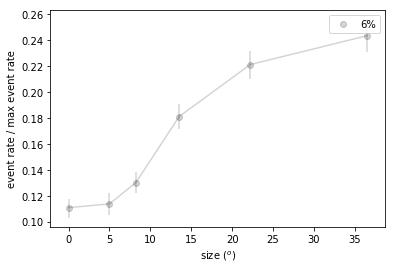

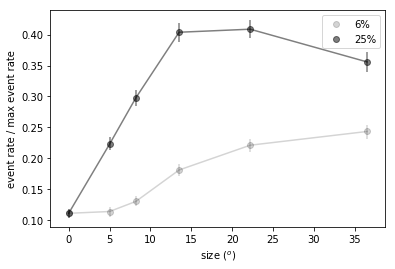

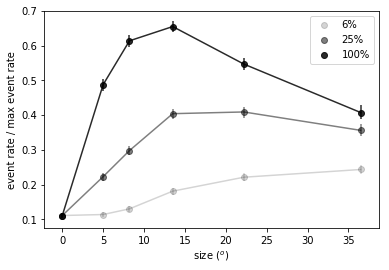

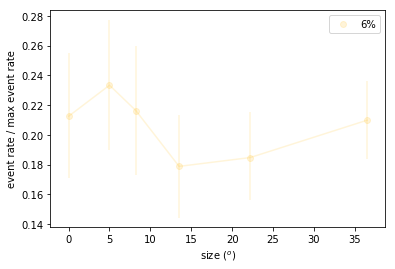

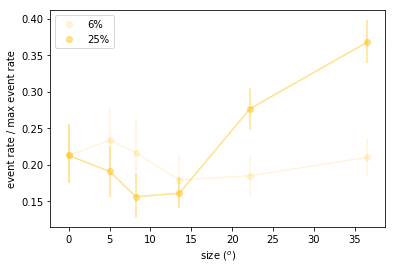

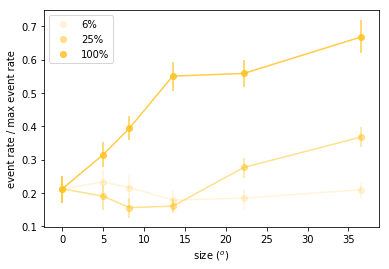

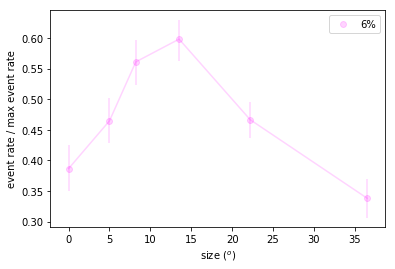

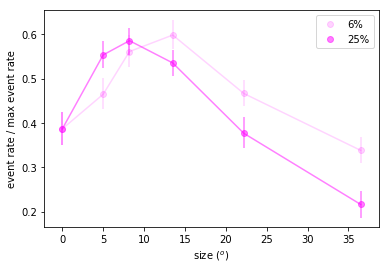

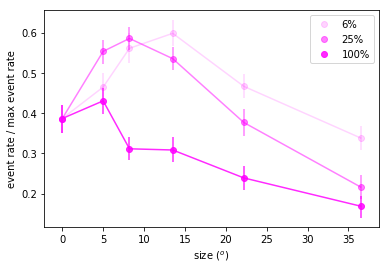

In [3]:
data_struct_files = ['pyr_l23_data_struct.mat','sst_data_struct.mat','vip_data_struct.mat']
colors = [[np.array((0,0,0,(i+1)/6)) for i in range(5)],[np.array((255/255,195/255,32/255)+((i+1)/6,)) for i in range(5)],[np.array((1,0,1)+((i+1)/6,)) for i in range(5)]]
# colors = [np.array((1,1,1,1))*0]*5
pkout = np.array((1,3,5))
output_fold = 'size_tuning_running/'
if not os.path.exists(output_fold):
    os.mkdir(output_fold)
for filename,c in zip(data_struct_files,colors):
    cell_type = filename.split('_data_struct.mat')[0]
    data_struct = sio.loadmat(filename,struct_as_record=True,squeeze_me=True)
    strialavg,usize,ucontrast = compute_tuning_curves(data_struct)
    for pickout in [pkout[:n+1] for n in range(3)]:
        for run_status in range(1,2):
            snorm = compute_normalized_summary_tuning(strialavg, usize, modal_usize, ucontrast, modal_ucontrast,run_status=run_status)
            plt.figure()
            if run_status:
                to_append = 'running'
            else:
                to_append = 'non-running'
            gray = np.tile(snorm[:,:,0].mean(1)[:,np.newaxis,np.newaxis],(1,1,len(modal_ucontrast)))
            usize0 = np.concatenate(((0,),modal_usize))
            snorm0 = np.concatenate((gray,snorm),axis=1)
            plot_bootstrapped_errorbars_w_dots(usize0,snorm0[:,:,pickout].transpose((0,2,1)),colors=[c[p-1] for p in pickout])
            plt.legend([str(int(np.round(x)))+'%' for x in modal_ucontrast[pickout]])
            plt.xlabel('size ($^o$)')
            plt.ylabel('event rate / max event rate')
        plt.savefig(output_fold+cell_type+'_'+str(pickout)+'_size_by_all_contrast.pdf')

In [23]:
filename = 'pyr_l23_data_struct.mat'
data_struct = sio.loadmat(filename,struct_as_record=True,squeeze_me=True)
strialavg,usize,ucontrast = compute_tuning_curves(data_struct)
strials,_,_ = compute_single_trial_tuning_curves(data_struct)
snorm0 = [None]*2
for run_status in (0,1):
    snorm = compute_summary_tuning(strials, usize, modal_usize, ucontrast, modal_ucontrast,run_status=run_status)
    gray = np.tile(snorm[:,:,0].mean(1)[:,np.newaxis,np.newaxis],(1,1,len(modal_ucontrast),1,1))
    usize0 = np.concatenate(((0,),modal_usize))
    snorm0[run_status] = np.concatenate((gray,snorm),axis=1)

/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in less
/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater
/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:63: RuntimeWarning: invalid value encountered in less
/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in greater


no non-running in session_181213_M8536
no non-running in session_181214_M10130
no non-running in session_190130_M9667
no non-running in session_190212_M8536
no non-running in session_190102_M10130
no running in session_181205_M10130
no running in session_190128_M8982
no running in session_190131_M9355
no running in session_190208_M9355
no running in session_190102_M10130
no running in session_181209_M8536


In [39]:
filename = 'pyr_l23_data_struct.mat'
data_struct = sio.loadmat(filename,struct_as_record=True,squeeze_me=True)
F_t,usize,ucontrast = compute_tuning_curves_t(data_struct)
keylist = list(F_t.keys())

/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in less


ValueError: no field of name F

In [ ]:
F_t[keylist[0]].shape

/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: Mean of empty slice
  
/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: Mean of empty slice
  after removing the cwd from sys.path.


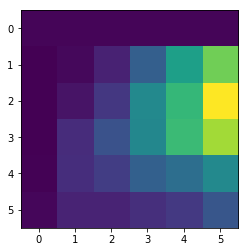

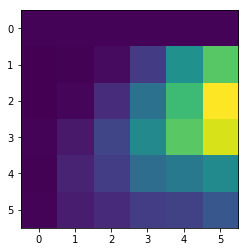

In [24]:
plt.figure()
plt.imshow(np.nanmean(np.nanmean(np.nanmean(snorm0[0],0),-1),-1))
plt.figure()
plt.imshow(np.nanmean(np.nanmean(np.nanmean(snorm0[1],0),-1),-1))

In [106]:
snorm[:,:,0].mean(1)[:,np.newaxis,np.newaxis].shape

(978, 1, 1, 8, 5)

In [108]:
np.tile(snorm[:,:,0].mean(1)[:,np.newaxis,np.newaxis],(1,1,len(modal_ucontrast),1,1)).shape

(978, 1, 6, 8, 5)

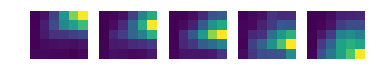

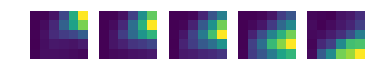

In [28]:
plt.figure()
data = np.nanmean(np.nanmean(snorm0[0],-1),-1)
for s in range(5):
    plt.subplot(1,5,s+1)
    lkat = np.argmax(data[:,:,-1],axis=1)==s+1
    plt.imshow(np.nanmean(data[lkat],0)[1:]) #/np.nanmean(data[lkat],0)[1:].max(0))
    plt.axis('off')
plt.figure()
data = np.nanmean(np.nanmean(snorm0[1],-1),-1)
for s in range(5):
    plt.subplot(1,5,s+1)
    lkat = np.argmax(data[:,:,-1],axis=1)==s+1
    to_show = np.nanmean(data[lkat],0)[1:]
    plt.imshow(to_show) #/to_show.max(0)[np.newaxis,:])
    plt.axis('off')

/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


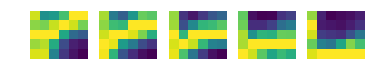

In [30]:
for rr in range(2):
    data = np.nanmean(np.nanmean(snorm0[rr],-1),-1)
    for s in range(5):
        plt.subplot(1,5,s+1)
        lkat = np.argmax(data[:,:,-1],axis=1)==s+1
        to_show = np.nanmean(data[lkat],0)[1:]
        plt.imshow(to_show/to_show.max(0)[np.newaxis,:])
        plt.axis('off')

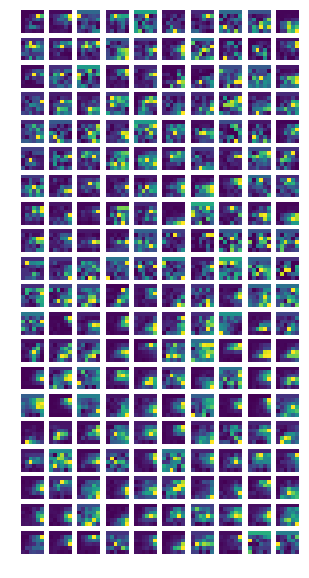

In [14]:
ut.imshow_in_rows(np.nanmean(np.nanmean(snorm0[0],-1),-1)[:200])

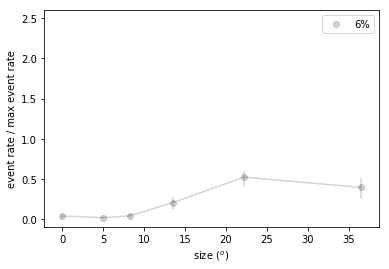

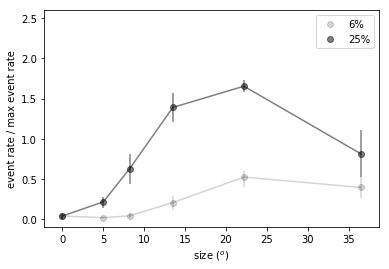

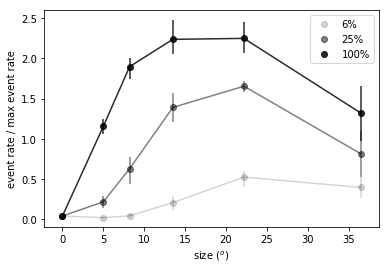

In [133]:
ind = 98

data_struct_files = ['pyr_l23_data_struct.mat','sst_data_struct.mat','vip_data_struct.mat']
colors = [[np.array((0,0,0,(i+1)/6)) for i in range(5)],[np.array((255/255,195/255,32/255)+((i+1)/6,)) for i in range(5)],[np.array((1,0,1)+((i+1)/6,)) for i in range(5)]]
# colors = [np.array((1,1,1,1))*0]*5
pickout = np.array((1,3,5))
pkout = [pickout[:n+1] for n in range(pickout.shape[0])]
output_fold = 'size_tuning_running/'
if not os.path.exists(output_fold):
    os.mkdir(output_fold)
for pickout in pkout:
    for filename,c in zip(data_struct_files[:1],colors[:1]):
        cell_type = filename.split('_data_struct.mat')[0]
    #     data_struct = sio.loadmat(filename,struct_as_record=True,squeeze_me=True)
    #     strialavg,usize,ucontrast = compute_tuning_curves(data_struct)

        for run_status in range(1,2):
            plt.figure()
            if run_status:
                to_append = 'running'
            else:
                to_append = 'non-running'
    #         gray = np.tile(snorm[:,:,0].mean(1)[:,np.newaxis,np.newaxis],(1,1,len(modal_ucontrast)))
    #         usize0 = np.concatenate(((0,),modal_usize))
            snorm0 = np.concatenate((gray,snorm),axis=1)
            plot_bootstrapped_errorbars_w_dots(usize0,np.nanmean(snorm0[ind][:,pickout],2).transpose((2,1,0)),colors=[c[p-1] for p in pickout])
            plt.legend([str(int(np.round(x)))+'%' for x in modal_ucontrast[pickout]])
            plt.xlabel('size ($^o$)')
            plt.ylabel('event rate / max event rate')
            plt.ylim((-0.1,2.6))
            plt.savefig(output_fold+cell_type+'_'+str(pickout[-1])+'_example_size_by_all_contrast.pdf')

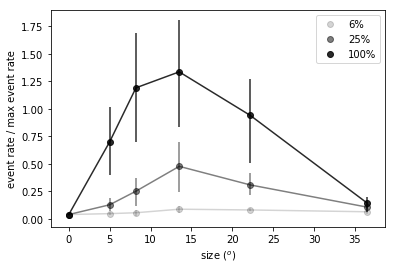

In [129]:
ind = 50

data_struct_files = ['pyr_l23_data_struct.mat','sst_data_struct.mat','vip_data_struct.mat']
colors = [[np.array((0,0,0,(i+1)/6)) for i in range(5)],[np.array((255/255,195/255,32/255)+((i+1)/6,)) for i in range(5)],[np.array((1,0,1)+((i+1)/6,)) for i in range(5)]]
# colors = [np.array((1,1,1,1))*0]*5
pickout = np.array((1,3,5))
output_fold = 'size_tuning_running/'
if not os.path.exists(output_fold):
    os.mkdir(output_fold)
for filename,c in zip(data_struct_files[:1],colors[:1]):
    cell_type = filename.split('_data_struct.mat')[0]
#     data_struct = sio.loadmat(filename,struct_as_record=True,squeeze_me=True)
#     strialavg,usize,ucontrast = compute_tuning_curves(data_struct)

    for run_status in range(1,2):
        plt.figure()
        if run_status:
            to_append = 'running'
        else:
            to_append = 'non-running'
#         gray = np.tile(snorm[:,:,0].mean(1)[:,np.newaxis,np.newaxis],(1,1,len(modal_ucontrast)))
#         usize0 = np.concatenate(((0,),modal_usize))
        snorm0 = np.concatenate((gray,snorm),axis=1)
        plot_bootstrapped_errorbars_w_dots(usize0,np.nanmean(snorm0[ind][:,pickout],2).transpose((2,1,0)),colors=[c[p-1] for p in pickout])
        plt.legend([str(int(np.round(x)))+'%' for x in modal_ucontrast[pickout]])
        plt.xlabel('size ($^o$)')
        plt.ylabel('event rate / max event rate')
#         plt.savefig(output_fold+cell_type+'_example_size_by_all_contrast.pdf')

In [121]:
pdb.pm()

> /home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/lib/stride_tricks.py(193)_broadcast_shape()
-> b = np.broadcast(*args[:32])
(Pdb) u
> /home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/lib/stride_tricks.py(259)broadcast_arrays()
-> shape = _broadcast_shape(*args)
(Pdb) u
> /home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/matplotlib/lines.py(661)recache()
-> self._xy = np.column_stack(np.broadcast_arrays(x, y)).astype(float)
(Pdb) u
> /home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/matplotlib/lines.py(951)get_path()
-> self.recache()
(Pdb) u
> /home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/matplotlib/axes/_base.py(1781)_update_line_limits()
-> path = line.get_path()
(Pdb) u
> /home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/matplotlib/axes/_base.py(1759)add_line()
-> self._update_line_limits(line)
(Pdb) u
> /home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/matplotlib/axes/_axes.py(2965)err

/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in less
/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


no running in session_181205_M10130
no running in session_190128_M8982
no running in session_190131_M9355
no running in session_190208_M9355
no running in session_181209_M8536


/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:83: RuntimeWarning: invalid value encountered in true_divide


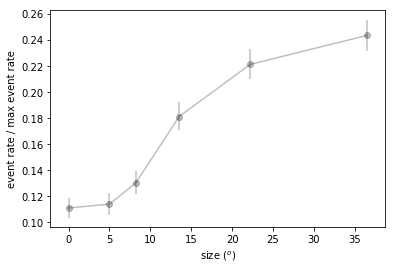

In [76]:
data_struct_files = ['pyr_l23_data_struct.mat','sst_data_struct.mat','vip_data_struct.mat']
colors = [[np.array((0,0,0,(i+1)/4)) for i in range(1)],[np.array((255/255,195/255,32/255)+((i+1)/4,)) for i in range(1)],[np.array((1,0,1)+((i+1)/6,)) for i in range(1)]]
# colors = [np.array((1,1,1,1))*0]*5
pickout = np.array((1,2,3,4,5))
output_fold = 'size_tuning_running/'
if not os.path.exists(output_fold):
    os.mkdir(output_fold)
plt.figure()
pickout = np.array((1,))
for filename,c in zip(data_struct_files[:1],colors[:1]):
    cell_type = filename.split('_data_struct.mat')[0]
    data_struct = sio.loadmat(filename,struct_as_record=True,squeeze_me=True)
    strialavg,usize,ucontrast = compute_tuning_curves(data_struct)

    for run_status in range(1,2):
        snorm = compute_normalized_summary_tuning(strialavg, usize, modal_usize, ucontrast, modal_ucontrast,run_status=run_status)
        if run_status:
            to_append = 'running'
        else:
            to_append = 'non-running'
        gray = np.tile(snorm[:,:,0].mean(1)[:,np.newaxis,np.newaxis],(1,1,len(modal_ucontrast)))
        usize0 = np.concatenate(((0,),modal_usize))
        snorm0 = np.concatenate((gray,snorm),axis=1)
        plot_bootstrapped_errorbars_w_dots(usize0,snorm0[:,:,pickout].transpose((0,2,1)),colors=c)
#         plt.legend(['PC','SST','VIP'])
        plt.xlabel('size ($^o$)')
        plt.ylabel('event rate / max event rate')
#         plt.savefig(output_fold+cell_type+'_overlaid_low_contrast.pdf')

/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in less
/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


no running in session_181205_M10130
no running in session_190128_M8982
no running in session_190131_M9355
no running in session_190208_M9355
no running in session_181209_M8536


/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in true_divide
/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning: Mean of empty slice


no running in session_180821_M9417
no running in session_181117_M10039
no running in session_181120_M10039
no running in session_181121_M10039
no running in session_180719_M8961
no running in session_180720_M8961


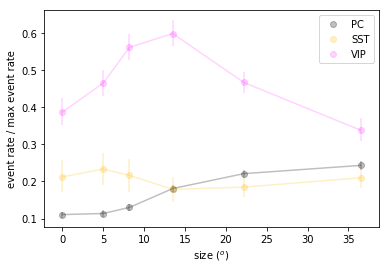

In [47]:
data_struct_files = ['pyr_l23_data_struct.mat','sst_data_struct.mat','vip_data_struct.mat']
colors = [[np.array((0,0,0,(i+1)/4)) for i in range(1)],[np.array((255/255,195/255,32/255)+((i+1)/4,)) for i in range(1)],[np.array((1,0,1)+((i+1)/6,)) for i in range(1)]]
# colors = [np.array((1,1,1,1))*0]*5
pickout = np.array((1,2,3,4,5))
output_fold = 'size_tuning_running/'
if not os.path.exists(output_fold):
    os.mkdir(output_fold)
plt.figure()
pickout = np.array((1,))
for filename,c in zip(data_struct_files,colors):
    cell_type = filename.split('_data_struct.mat')[0]
    data_struct = sio.loadmat(filename,struct_as_record=True,squeeze_me=True)
#     strialavg,usize,ucontrast = compute_tuning_curves(data_struct)

    for run_status in range(1,2):
        snorm = compute_normalized_summary_tuning(strialavg, usize, modal_usize, ucontrast, modal_ucontrast,run_status=run_status)
        if run_status:
            to_append = 'running'
        else:
            to_append = 'non-running'
        gray = np.tile(snorm[:,:,0].mean(1)[:,np.newaxis,np.newaxis],(1,1,len(modal_ucontrast)))
        usize0 = np.concatenate(((0,),modal_usize))
        snorm0 = np.concatenate((gray,snorm),axis=1)
        plot_bootstrapped_errorbars_w_dots(usize0,str[:,:,pickout].transpose((0,2,1)),colors=c)
        plt.legend(['PC','SST','VIP'])
        plt.xlabel('size ($^o$)')
        plt.ylabel('event rate / max event rate')
        plt.savefig(output_fold+cell_type+'_overlaid_low_contrast.pdf')

/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in less
/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


no running in session_181205_M10130
no running in session_190128_M8982
no running in session_190131_M9355
no running in session_190208_M9355
no running in session_181209_M8536


/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in true_divide
/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning: Mean of empty slice


no running in session_180821_M9417
no running in session_181117_M10039
no running in session_181120_M10039
no running in session_181121_M10039
no running in session_180719_M8961
no running in session_180720_M8961


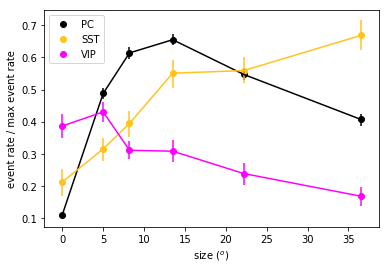

In [48]:
data_struct_files = ['pyr_l23_data_struct.mat','sst_data_struct.mat','vip_data_struct.mat']
colors = [[np.array((0,0,0,(i+1)/6)) for i in range(5,6)],[np.array((255/255,195/255,32/255)+((i+1)/6,)) for i in range(5,6)],[np.array((1,0,1)+((i+1)/6,)) for i in range(5,6)]]
# colors = [np.array((1,1,1,1))*0]*5
pickout = np.array((1,2,3,4,5))
output_fold = 'size_tuning_running/'
if not os.path.exists(output_fold):
    os.mkdir(output_fold)
plt.figure()
pickout = np.array((5,))
for filename,c in zip(data_struct_files,colors):
    cell_type = filename.split('_data_struct.mat')[0]
    data_struct = sio.loadmat(filename,struct_as_record=True,squeeze_me=True)
    strialavg,usize,ucontrast = compute_tuning_curves(data_struct)

    for run_status in range(1,2):
        snorm = compute_normalized_summary_tuning(strialavg, usize, modal_usize, ucontrast, modal_ucontrast,run_status=run_status)
        if run_status:
            to_append = 'running'
        else:
            to_append = 'non-running'
        gray = np.tile(snorm[:,:,0].mean(1)[:,np.newaxis,np.newaxis],(1,1,len(modal_ucontrast)))
        usize0 = np.concatenate(((0,),modal_usize))
        snorm0 = np.concatenate((gray,snorm),axis=1)
        plot_bootstrapped_errorbars_w_dots(usize0,snorm0[:,:,pickout].transpose((0,2,1)),colors=c)
        plt.legend(['PC','SST','VIP'])
        plt.xlabel('size ($^o$)')
        plt.ylabel('event rate / max event rate')
        plt.savefig(output_fold+cell_type+'_overlaid_high_contrast.pdf')

/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in less
/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning: Mean of empty slice
/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in true_divide


no running in session_180821_M9417
no running in session_181117_M10039
no running in session_181120_M10039
no running in session_181121_M10039


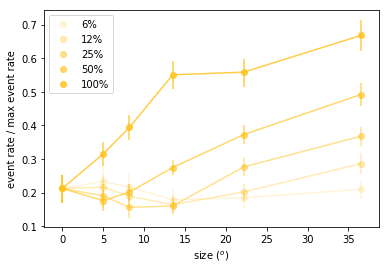

In [26]:
data_struct_files = ['sst_data_struct.mat']

colors = [np.array((255/255,195/255,32/255)+((i+1)/6,)) for i in range(5)]
# colors = [np.array((1,1,1,1))*0]*5
pickout = np.array((1,2,3,4,5))
# os.mkdir('two_curves_non_running')
for filename in data_struct_files:
    cell_type = filename.split('_data_struct.mat')[0]
    data_struct = sio.loadmat(filename,struct_as_record=True,squeeze_me=True)
    strialavg,usize,ucontrast = compute_tuning_curves(data_struct)

    for run_status in range(1,2):
        snorm = compute_normalized_summary_tuning(strialavg, usize, modal_usize, ucontrast, modal_ucontrast,run_status=run_status)
        plt.figure()
        if run_status:
            to_append = 'running'
        else:
            to_append = 'non-running'
        gray = np.tile(snorm[:,:,0].mean(1)[:,np.newaxis,np.newaxis],(1,1,len(modal_ucontrast)))
        usize0 = np.concatenate(((0,),modal_usize))
        snorm0 = np.concatenate((gray,snorm),axis=1)
        plot_bootstrapped_errorbars_w_dots(usize0,snorm0[:,:,1:].transpose((0,2,1)),colors=colors)
        plt.legend([str(int(np.round(x)))+'%' for x in modal_ucontrast[1:]])
        plt.xlabel('size ($^o$)')
        plt.ylabel('event rate / max event rate')
#         plt.savefig('two_curves_non_running/'+cell_type+'_contrast_by_one_size.pdf')

/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning: Mean of empty slice
/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in less


no running in session_180719_M8961
no running in session_180720_M8961


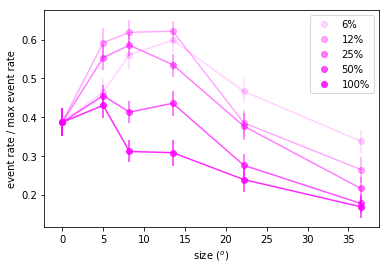

In [27]:
data_struct_files = ['vip_data_struct.mat']

colors = [np.array((1,0,1)+((i+1)/6,)) for i in range(5)]
# colors = [np.array((1,1,1,1))*0]*5
pickout = np.array((1,2,3,4,5))
# os.mkdir('two_curves_non_running')
for filename in data_struct_files:
    cell_type = filename.split('_data_struct.mat')[0]
    data_struct = sio.loadmat(filename,struct_as_record=True,squeeze_me=True)
    strialavg,usize,ucontrast = compute_tuning_curves(data_struct)

    for run_status in range(1,2):
        snorm = compute_normalized_summary_tuning(strialavg, usize, modal_usize, ucontrast, modal_ucontrast,run_status=run_status)
        plt.figure()
        if run_status:
            to_append = 'running'
        else:
            to_append = 'non-running'
        gray = np.tile(snorm[:,:,0].mean(1)[:,np.newaxis,np.newaxis],(1,1,len(modal_ucontrast)))
        usize0 = np.concatenate(((0,),modal_usize))
        snorm0 = np.concatenate((gray,snorm),axis=1)
        plot_bootstrapped_errorbars_w_dots(usize0,snorm0[:,:,1:].transpose((0,2,1)),colors=colors)
        plt.legend([str(int(np.round(x)))+'%' for x in modal_ucontrast[1:]])
        plt.xlabel('size ($^o$)')
        plt.ylabel('event rate / max event rate')
#         plt.savefig('two_curves_non_running/'+cell_type+'_contrast_by_one_size.pdf')

/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in less
/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


no non-running in session_181213_M8536
no non-running in session_181214_M10130
no non-running in session_190130_M9667
no non-running in session_190212_M8536
no non-running in session_190102_M10130


/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning: Mean of empty slice


no non-running in session_180713_M9053
no non-running in session_180714_M9053


/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in true_divide


no non-running in session_180412_M7955
no non-running in session_180516_M8956
no non-running in session_180519_M8959
no non-running in session_180528_M8959
no non-running in session_180531_M8961
no non-running in session_180618_M8956
no non-running in session_180903_M8961


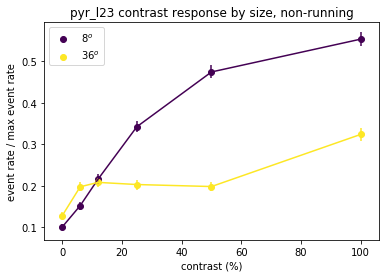

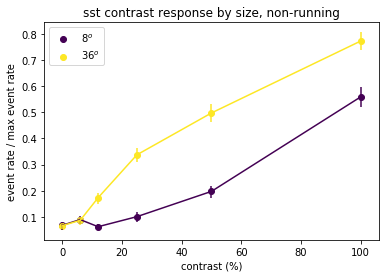

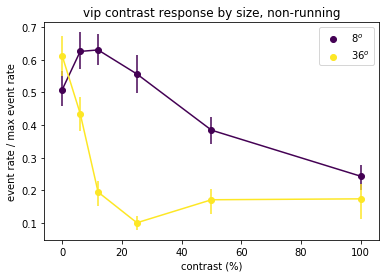

In [34]:
data_struct_files = ['pyr_l23_data_struct.mat','sst_data_struct.mat','vip_data_struct.mat']
pickout = np.array((0,1,2,3,4))
# os.mkdir('two_curves_non_running')
for filename in data_struct_files:
    cell_type = filename.split('_data_struct.mat')[0]
    data_struct = sio.loadmat(filename,struct_as_record=True,squeeze_me=True)
    strialavg,usize,ucontrast = compute_tuning_curves(data_struct)

    for run_status in range(0,1):
        snorm = compute_normalized_summary_tuning(strialavg, usize, modal_usize, ucontrast, modal_ucontrast,run_status=run_status)
        plt.figure()
        if run_status:
            to_append = 'running'
        else:
            to_append = 'non-running'
        plt.title(cell_type + ' contrast response by size, '+to_append)
        plot_bootstrapped_errorbars_w_dots(modal_ucontrast,snorm[:,pickout])
        plt.legend([str(int(np.round(x)))+'$^o$' for x in modal_usize[pickout]])
        plt.xlabel('contrast (%)')
        plt.ylabel('event rate / max event rate')
#         plt.savefig('two_curves_non_running/'+cell_type+'_contrast_by_two_sizes.pdf')

In [ ]:
data_struct_files = ['pyr_l23_data_struct.mat','sst_data_struct.mat']
# os.mkdir('pc_and_sst_non_running')
colors = ['k',np.array((218,165,32,255))/255,'m']
for pickout in [np.array((1,)),np.array((4,))]:
    plt.figure()
    for icelltype,filename in enumerate(data_struct_files):
        cell_type = filename.split('_data_struct.mat')[0]
        data_struct = sio.loadmat(filename,struct_as_record=True,squeeze_me=True)
        strialavg,usize,ucontrast = compute_tuning_curves(data_struct)

        for run_status in range(0,1):
            snorm = compute_normalized_summary_tuning(strialavg, usize, modal_usize, ucontrast, modal_ucontrast,run_status=run_status)
            if run_status:
                to_append = 'running'
            else:
                to_append = 'non-running'
#             plt.title(cell_type + ' contrast response by size, '+to_append)
            plot_bootstrapped_errorbars_w_dots(modal_ucontrast,snorm[:,pickout],colors=(colors[icelltype],))
#             plt.legend([str(int(np.round(x)))+'$^o$' for x in modal_usize[pickout]])
            plt.xlabel('contrast (%)')
            plt.ylabel('event rate / max event rate')
    plt.legend(['PC','SST'])
    plt.savefig('pc_and_sst_non_running/overlaid'+str(pickout)+'.pdf')

/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in less
/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


no running in session_181205_M10130
no running in session_190128_M8982
no running in session_190131_M9355
no running in session_190208_M9355
no running in session_181209_M8536
pyr_l23: 1057
pyr_l23: 10


/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:83: RuntimeWarning: invalid value encountered in true_divide
/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning: Mean of empty slice


no running in session_180821_M9417
no running in session_181117_M10039
no running in session_181120_M10039
no running in session_181121_M10039
sst: 208
sst: 7
no running in session_180719_M8961
no running in session_180720_M8961
vip: 235
vip: 9


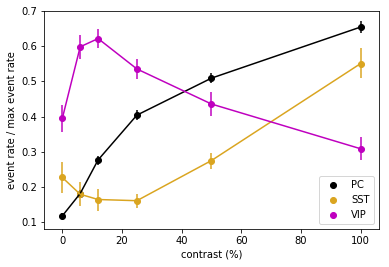

In [12]:
data_struct_files = ['pyr_l23_data_struct.mat','sst_data_struct.mat','vip_data_struct.mat']
# os.mkdir('pc_and_sst_non_running')
colors = ['k',np.array((218,165,32,255))/255,'m']
for pickout in [np.array((2,))]:
    plt.figure()
    for icelltype,filename in enumerate(data_struct_files):
        cell_type = filename.split('_data_struct.mat')[0]
        data_struct = sio.loadmat(filename,struct_as_record=True,squeeze_me=True)
        strialavg,usize,ucontrast = compute_tuning_curves(data_struct)

        for run_status in range(1,2):
            snorm = compute_normalized_summary_tuning(strialavg, usize, modal_usize, ucontrast, modal_ucontrast,run_status=run_status)
            print(cell_type+': '+str(snorm.shape[0]))
            print(cell_type+': '+str(len(list(strialavg.keys()))))
            if run_status:
                to_append = 'running'
            else:
                to_append = 'non-running'
#             plt.title(cell_type + ' contrast response by size, '+to_append)
            plot_bootstrapped_errorbars_w_dots(modal_ucontrast,snorm[:,pickout],colors=(colors[icelltype],))
#             plt.legend([str(int(np.round(x)))+'$^o$' for x in modal_usize[pickout]])
            plt.xlabel('contrast (%)')
            plt.ylabel('event rate / max event rate')
    plt.legend(['PC','SST','VIP'])
#     plt.savefig('size_tuning_running/overlaid_pc_sst_vip_'+str(pickout)+'.pdf')

/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in less
/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


no running in session_181205_M10130
no running in session_190128_M8982
no running in session_190131_M9355
no running in session_190208_M9355
no running in session_181209_M8536


/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:83: RuntimeWarning: invalid value encountered in true_divide
/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning: Mean of empty slice


no running in session_180821_M9417
no running in session_181117_M10039
no running in session_181120_M10039
no running in session_181121_M10039


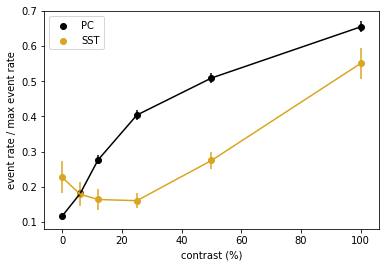

In [7]:
data_struct_files = ['pyr_l23_data_struct.mat','sst_data_struct.mat']
# os.mkdir('pc_and_sst_non_running')
colors = ['k',np.array((218,165,32,255))/255,'m']
for pickout in [np.array((2,))]:
    plt.figure()
    for icelltype,filename in enumerate(data_struct_files):
        cell_type = filename.split('_data_struct.mat')[0]
        data_struct = sio.loadmat(filename,struct_as_record=True,squeeze_me=True)
        strialavg,usize,ucontrast = compute_tuning_curves(data_struct)

        for run_status in range(1,2):
            snorm = compute_normalized_summary_tuning(strialavg, usize, modal_usize, ucontrast, modal_ucontrast,run_status=run_status)
            if run_status:
                to_append = 'running'
            else:
                to_append = 'non-running'
#             plt.title(cell_type + ' contrast response by size, '+to_append)
            plot_bootstrapped_errorbars_w_dots(modal_ucontrast,snorm[:,pickout],colors=(colors[icelltype],))
#             plt.legend([str(int(np.round(x)))+'$^o$' for x in modal_usize[pickout]])
            plt.xlabel('contrast (%)')
            plt.ylabel('event rate / max event rate')
    plt.legend(['PC','SST'])
    plt.savefig('size_tuning_running/overlaid_pc_sst_'+str(pickout)+'.pdf')

/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in less
/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


no running in session_181205_M10130
no running in session_190128_M8982
no running in session_190131_M9355
no running in session_190208_M9355
no running in session_181209_M8536


/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:83: RuntimeWarning: invalid value encountered in true_divide


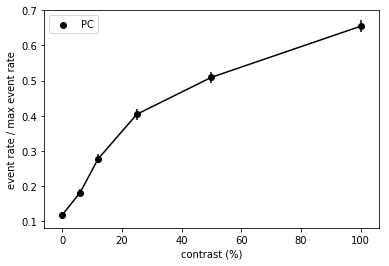

In [11]:
data_struct_files = ['pyr_l23_data_struct.mat']
# os.mkdir('pc_and_sst_non_running')
colors = ['k',np.array((218,165,32,255))/255,'m']
for pickout in [np.array((2,))]:
    plt.figure()
    for icelltype,filename in enumerate(data_struct_files):
        cell_type = filename.split('_data_struct.mat')[0]
        data_struct = sio.loadmat(filename,struct_as_record=True,squeeze_me=True)
        strialavg,usize,ucontrast = compute_tuning_curves(data_struct)

        for run_status in range(1,2):
            snorm = compute_normalized_summary_tuning(strialavg, usize, modal_usize, ucontrast, modal_ucontrast,run_status=run_status)
            if run_status:
                to_append = 'running'
            else:
                to_append = 'non-running'
#             plt.title(cell_type + ' contrast response by size, '+to_append)
            plot_bootstrapped_errorbars_w_dots(modal_ucontrast,snorm[:,pickout],colors=(colors[icelltype],))
#             plt.legend([str(int(np.round(x)))+'$^o$' for x in modal_usize[pickout]])
            plt.xlabel('contrast (%)')
            plt.ylabel('event rate / max event rate')
    plt.legend(['PC'])
    plt.savefig('size_tuning_running/overlaid_pc_'+str(pickout)+'.pdf')

/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in less
/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in greater


no non-running in session_181213_M8536
no non-running in session_181214_M10130
no non-running in session_190130_M9667
no non-running in session_190212_M8536
no non-running in session_190102_M10130


/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:40: RuntimeWarning: Mean of empty slice


no non-running in session_180713_M9053
no non-running in session_180714_M9053


/home/mossing/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in true_divide


no non-running in session_180412_M7955
no non-running in session_180516_M8956
no non-running in session_180519_M8959
no non-running in session_180528_M8959
no non-running in session_180531_M8961
no non-running in session_180618_M8956
no non-running in session_180903_M8961
no non-running in session_181213_M8536
no non-running in session_181214_M10130
no non-running in session_190130_M9667
no non-running in session_190212_M8536
no non-running in session_190102_M10130
no non-running in session_180713_M9053
no non-running in session_180714_M9053
no non-running in session_180412_M7955
no non-running in session_180516_M8956
no non-running in session_180519_M8959
no non-running in session_180528_M8959
no non-running in session_180531_M8961
no non-running in session_180618_M8956
no non-running in session_180903_M8961


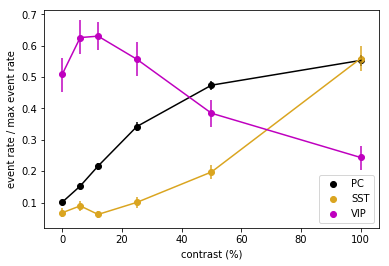

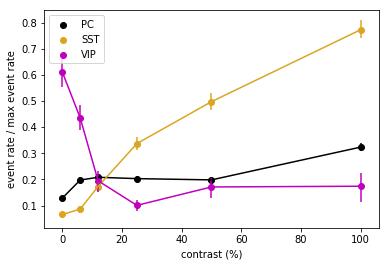

In [31]:
data_struct_files = ['pyr_l23_data_struct.mat','sst_data_struct.mat','vip_data_struct.mat']
# os.mkdir('pc_sst_vip_non_running')
colors = ['k',np.array((218,165,32,255))/255,'m']
for pickout in [np.array((1,)),np.array((4,))]:
    plt.figure()
    for icelltype,filename in enumerate(data_struct_files):
        cell_type = filename.split('_data_struct.mat')[0]
        data_struct = sio.loadmat(filename,struct_as_record=True,squeeze_me=True)
        strialavg,usize,ucontrast = compute_tuning_curves(data_struct)

        for run_status in range(0,1):
            snorm = compute_normalized_summary_tuning(strialavg, usize, modal_usize, ucontrast, modal_ucontrast,run_status=run_status)
            if run_status:
                to_append = 'running'
            else:
                to_append = 'non-running'
#             plt.title(cell_type + ' contrast response by size, '+to_append)
            plot_bootstrapped_errorbars_w_dots(modal_ucontrast,snorm[:,pickout],colors=(colors[icelltype],))
#             plt.legend([str(int(np.round(x)))+'$^o$' for x in modal_usize[pickout]])
            plt.xlabel('contrast (%)')
            plt.ylabel('event rate / max event rate')
    plt.legend(['PC','SST','VIP'])
#     plt.savefig('pc_sst_vip_non_running/overlaid'+str(pickout)+'.pdf')

In [8]:
def plot_bootstrap_errorbars(strialavg):
    plt.figure()
    for i in range(len(keylist)):
        plt.subplot(2,len(keylist),i+1)
        try:
            data = np.nanmean(strialavg[keylist[i]][0],-1)
            data = data/np.nanmax(np.nanmax(data,-1),-1)[:,np.newaxis,np.newaxis]
            plt.imshow(np.nanmean(data,0))
        except:
            print('no non-running')
        plt.axis('off')
    # plt.figure()
    for i in range(len(keylist)):
        plt.subplot(2,len(keylist),len(keylist)+i+1)
        try:
            data = np.nanmean(strialavg[keylist[i]][1],-1)
            data = data/np.nanmax(np.nanmax(data,-1),-1)[:,np.newaxis,np.newaxis]
            plt.imshow(np.nanmean(data,0))
        except:
            print('no running')
        plt.axis('off')

In [9]:
for ind in range(len(keylist)):
    try:
        ut.imshow_in_rows(np.nanmean(strialavg[keylist[ind]][1],-1))
    except:
        print('no running')

NameError: name 'keylist' is not defined

In [78]:
data_struct[session_id][()][()]['running_speed_cm_s'][()][()][0][0]

array([[ 60.43410508,  66.4973316 ,  59.14471093, ...,  65.21315014,
         60.13470712,  59.9998427 ]])

In [10]:
# plt.figure()
# plt.plot(data_struct[keylist[0]]['calcium_responses_au'].mean(0))
# k = 0
# session_id = 'session_'+keylist[k][:-1].replace('/','_')
session_id = 'session_181213_M8536'
running = data_struct[session_id][()]['running_speed_cm_s'][()]>10
nsize = len(data_struct[session_id]['stimulus_size_deg'][()])
ncontrast = len(data_struct[session_id]['stimulus_contrast'][()])
gd_roi = np.logical_and(data_struct[session_id]['rf_distance_deg'][()]<10,data_struct[session_id]['rf_mapping_pval'][()]<0.05)
nroi = data_struct[session_id]['decon'][()].shape[0]
trialavg = np.zeros((nroi,nsize,ncontrast))
strialavg = np.zeros((nroi,nsize,ncontrast))
for i in range(nsize):
    for j in range(ncontrast):
        size_id = data_struct[session_id]['stimulus_id'][()][0]
        contrast_id = data_struct[session_id]['stimulus_id'][()][1]
        gd_trial = np.logical_and(running,np.logical_and(size_id==i,contrast_id==j))
        strialavg[:,i,j] = np.nanmean(data_struct[session_id]['decon'][()][:,gd_trial],axis=1)
        trialavg[:,i,j] = np.nanmean(data_struct[session_id]['calcium_responses_au'][()][:,gd_trial],axis=1)

KeyError: 'session_181213_M8536'

In [ ]:
session_id = 'session_181213_M8536'
running = data_struct[session_id]['running_speed_cm_s'][()]>10
nsize = len(data_struct[session_id]['stimulus_size_deg'][()])
ncontrast = len(data_struct[session_id]['stimulus_contrast'][()])
gd_roi = np.logical_and(data_struct[session_id]['rf_distance_deg'][()]<10,data_struct[session_id]['rf_mapping_pval'][()]<0.05)
nroi = data_struct[session_id]['decon'][()].shape[0]
trialavg = np.zeros((nroi,nsize,ncontrast))
strialavg = np.zeros((nroi,nsize,ncontrast))
for i in range(nsize):
    for j in range(ncontrast):
        size_id = data_struct[session_id]['stimulus_id'][()][0]
        contrast_id = data_struct[session_id]['stimulus_id'][()][1]
        gd_trial = np.logical_and(running,np.logical_and(size_id==i,contrast_id==j))
        strialavg[:,i,j] = np.nanmean(data_struct[session_id]['decon'][()][:,gd_trial],axis=1)
        trialavg[:,i,j] = np.nanmean(data_struct[session_id]['calcium_responses_au'][()][:,gd_trial],axis=1)

In [13]:
# plt.figure()
# plt.plot(data_struct[keylist[0]]['calcium_responses_au'].mean(0))
# k = 0
# session_id = 'session_'+keylist[k][:-1].replace('/','_')
session_id = 'session_181213_M8536'
running = data_struct[session_id]['running_speed_cm_s'][()]>10
nsize = len(data_struct[session_id]['stimulus_size_deg'][()])
ncontrast = len(data_struct[session_id]['stimulus_contrast'][()])
nangle = len(data_struct[session_id]['stimulus_direction'][()])
gd_roi = np.logical_and(data_struct[session_id]['rf_distance_deg'][()]<10,data_struct[session_id]['rf_mapping_pval'][()]<0.05)
nroi = data_struct[session_id]['decon'][()].shape[0]
strialavg = np.zeros((gd_roi.sum(),nsize,ncontrast,nangle))
for i in range(nsize):
    for j in range(ncontrast):
        for k in range(nangle):
            size_id = data_struct[session_id]['stimulus_id'][()][0]
            contrast_id = data_struct[session_id]['stimulus_id'][()][1]
            angle_id = data_struct[session_id]['stimulus_id'][()][2]
            gd_trial = np.logical_and(running,np.logical_and(angle_id==k,np.logical_and(size_id==i,contrast_id==j)))
            strialavg[:,i,j,k] = np.nanmean(data_struct[session_id]['decon'][()][gd_roi][:,gd_trial],1)

/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in greater
  


In [15]:
def symmetrize(arr):
    return np.concatenate((arr,arr[0:1]))

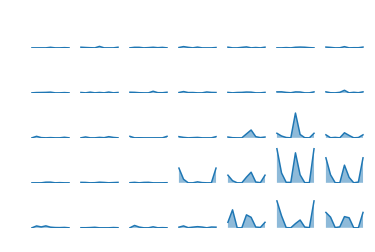

In [16]:
ind = 13
plt.figure()
for i in range(nsize):
    for j in range(ncontrast):
        plt.subplot(nsize,ncontrast,i*ncontrast+j+1)
        plt.fill_between(np.arange(nangle+1),symmetrize(strialavg[ind,i,j]),alpha=0.5)
        plt.plot(np.arange(nangle+1),symmetrize(strialavg[ind,i,j]))
        plt.ylim(strialavg[ind].min(),1.1*strialavg[ind].max())
        plt.axis('off')

/home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_base.py:3239: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=0.0, top=0.0
  'bottom=%s, top=%s') % (bottom, top))


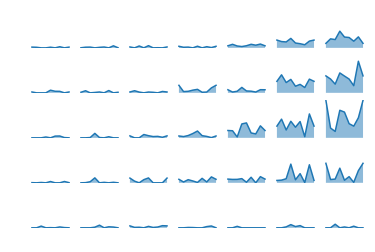

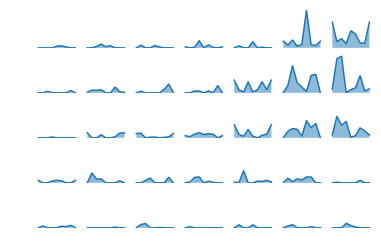

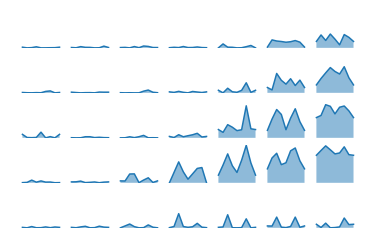

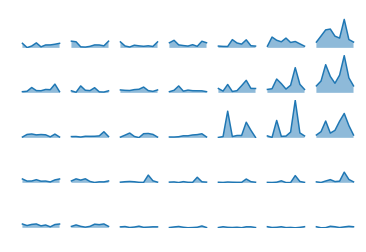

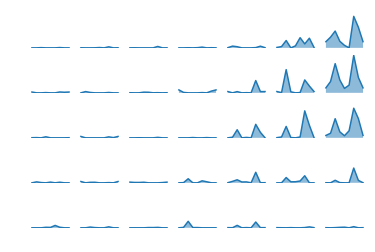

...

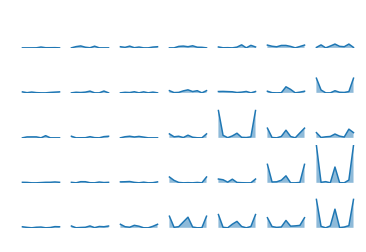

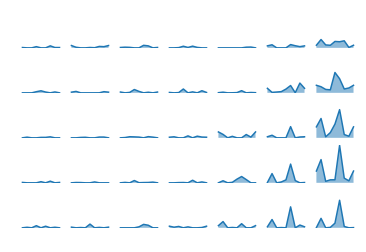

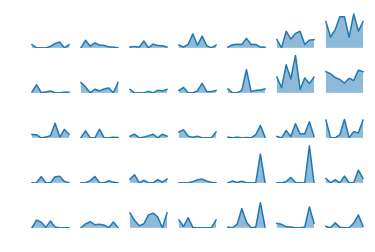

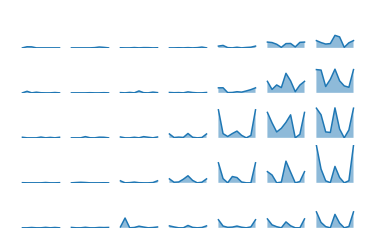

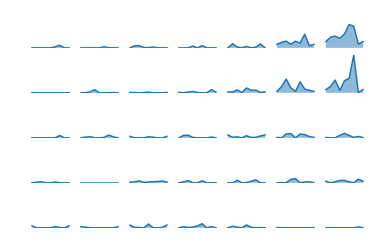

In [17]:
ind = 15
# os.mkdir('pc_ori_tuning_size_contrast')
for ind in range(strialavg.shape[0]):
    plt.figure()
    for i in range(nsize):
        for j in range(ncontrast):
            plt.subplot(nsize,ncontrast,i*ncontrast+j+1)
            plt.fill_between(np.arange(nangle+1),symmetrize(strialavg[ind,i,j]),alpha=0.5)
            plt.plot(np.arange(nangle+1),symmetrize(strialavg[ind,i,j]))
            plt.ylim(strialavg[ind].min(),strialavg[ind].max())
            plt.axis('off')
    plt.savefig('pc_ori_tuning_size_contrast/%02d.png' % ind)

/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in double_scalars
  """


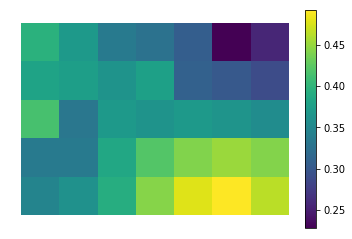

In [22]:
def compute_osi(r):
    theta = np.arange(0,2*np.pi,np.pi/4)
    x = np.nansum(np.cos(2*theta)*r)
    y = np.nansum(np.sin(2*theta)*r)
    return np.sqrt(x**2+y**2)/np.nansum(r)

osi = np.zeros(strialavg.shape[:-1])
for i in range(osi.shape[0]):
    for j in range(osi.shape[1]):
        for k in range(osi.shape[2]):
            osi[i,j,k] = compute_osi(strialavg[i,j,k])

plt.figure()
plt.imshow(np.nanmean(osi,0))
plt.colorbar()
plt.axis('off')
plt.savefig('osi_size_contrast_pc.png')

In [ ]:
plt.imshow(osi[5])

In [11]:
running.mean()

0.97642857142857142

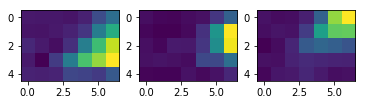

In [10]:
plt.figure()
lkat = (2,9,60)
nmax = len(lkat)
for i,el in enumerate(lkat):
    data0 = trialavg[gd_roi][el]
#     data1 = trialavg[gd_roi][el]
#     vmax = np.maximum(data0.flatten(),data1.flatten()).max()
    plt.subplot(1,nmax,i+1)
    plt.imshow(data0)#,vmax=vmax)
#     plt.subplot(2,nmax,nmax+i+1)
#     plt.imshow(data1,vmax=vmax)
# plt.imshow(trialavg[gd_roi][2])
# plt.imshow(trialavg[gd_roi][9])
plt.savefig('l23_example_rois_size_contrast_running.pdf')
plt.savefig('l23_example_rois_size_contrast_running.png')

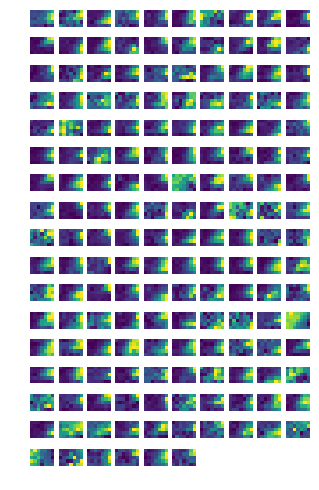

In [12]:
ut.imshow_in_rows(trialavg[gd_roi])
plt.savefig('l23_size_contrast_181213_running.pdf')
plt.savefig('l23_size_contrast_181213_running.png')

<IPython.core.display.Javascript object>


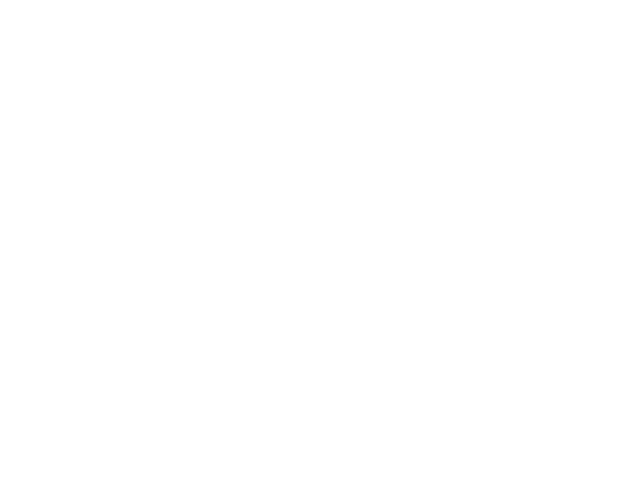

/home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


In [80]:
plt.figure()
lkat = (5,9,10,14)
n = len(lkat)
for i in range(n):
    plt.subplot(n,2,2*i+1)
    plt.imshow(trialavg[gd_roi][lkat[i]])
    plt.axis('off')
    plt.subplot(n,2,2*i+2)
    plt.imshow(strialavg[gd_roi][lkat[i]])
    plt.axis('off')
plt.subplot(n,2,1)
plt.title('raw fluorescence')
plt.subplot(n,2,2)
plt.title('decon. event rate')
plt.savefig('raw_vs_decon_size_contrast_tuning.png')

<IPython.core.display.Javascript object>


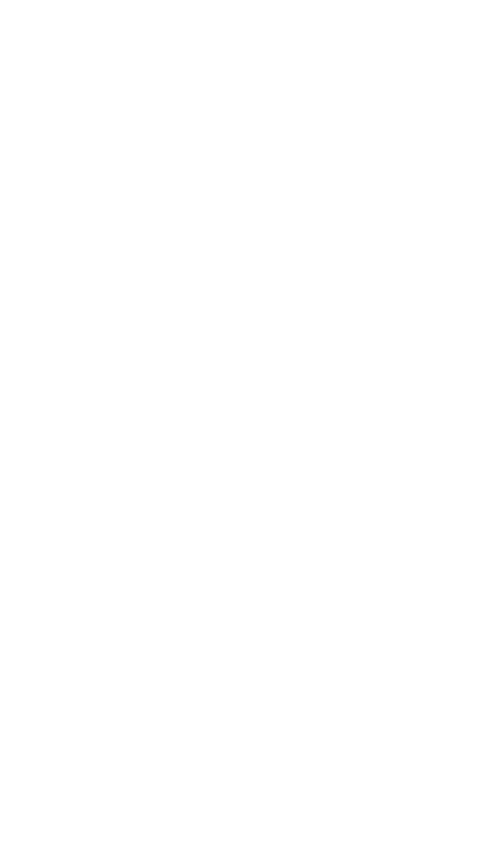

In [69]:
ut.imshow_in_rows(trialavg[gd_roi])

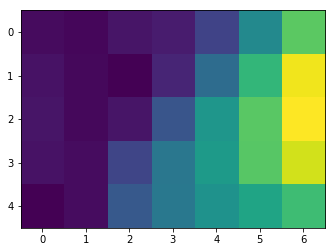

In [30]:
plt.figure()
plt.imshow(trialavg.mean(0))

In [29]:
# plt.figure()
# plt.plot(data_struct[keylist[0]]['calcium_responses_au'].mean(0))
k = 1
session_id = keylist[k]
running = data_struct[session_id]['running_speed_cm_s']>10
nsize = len(data_struct[session_id]['stimulus_size_deg'])
ncontrast = len(data_struct[session_id]['stimulus_contrast'])
trialavg = np.zeros((nsize,ncontrast))
for i in range(nsize):
    for j in range(ncontrast):
        size_id = data_struct[session_id]['stimulus_id'][0]
        contrast_id = data_struct[session_id]['stimulus_id'][1]
        gd_trial = np.logical_and(running,np.logical_and(size_id==i,contrast_id==j))
        gd_roi = np.logical_and(data_struct[session_id]['rf_distance_deg']<10,data_struct[session_id]['rf_mapping_pval']<0.05)
        trialavg[i,j] = np.nanmean(data_struct[session_id]['decon'][gd_roi][:,gd_trial])

/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in greater
  """


In [6]:
k = 1
session_id = keylist[k]
running = data_struct[session_id]['running_speed_cm_s']>10
nsize = len(data_struct[session_id]['stimulus_size_deg'])
ncontrast = len(data_struct[session_id]['stimulus_contrast'])
trialavg = np.zeros((nsize,ncontrast))
for i in range(nsize):
    for j in range(ncontrast):
        size_id = data_struct[session_id]['stimulus_id'][0]
        contrast_id = data_struct[session_id]['stimulus_id'][1]
        gd_trial = np.logical_and(running,np.logical_and(size_id==i,contrast_id==j))
        gd_roi = np.logical_and(data_struct[session_id]['rf_distance_deg']<10,data_struct[session_id]['rf_mapping_pval']<0.05)
        trialavg[i,j] = np.nanmean(data_struct[session_id]['decon'][gd_roi][:,gd_trial])

NameError: name 'keylist' is not defined

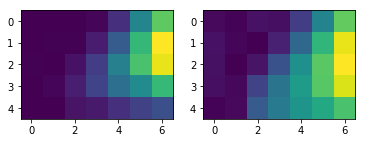

In [30]:
plt.figure()
plt.subplot(1,2,1)
plt.imshow(trialavg)
plt.subplot(1,2,2)
plt.imshow(np.nanmean(soriavg[keylist[k]][0],axis=0))

In [113]:
keylist

['181205/M10130/',
 '181213/M8536/',
 '181214/M10130/',
 '190128/M8982/',
 '190130/M9667/',
 '190131/M9355/']

In [102]:
ucontrast,icontrast = np.unique(proc[keylist[2]][0]['contrast'],return_inverse=True)

In [104]:
ucontrast

array([ 0.  ,  0.03,  0.06,  0.12,  0.25,  0.5 ,  1.  ])

In [106]:
proc[keylist[2]][0]['contrast']

array([ 0.03,  0.5 ,  0.5 , ...,  0.  ,  0.5 ,  0.12])

In [107]:
icontrast

array([1, 5, 5, ..., 0, 5, 3])

In [ ]:
# result = {}
# result['soriavg'] = soriavg
# result['ret_vars'] = ret_vars
# result['proc'] = proc
# with open('size_contrast_result.p', 'wb') as handle:
#     pkl.dump(result, handle, protocol=pkl.HIGHEST_PROTOCOL)

In [19]:
# pdb.run("soriavg,strialavg,lb,ub,pval,nbydepth,spont,ret_vars,Smean_stat,proc = sca.analyze_everything_by_criterion(folds,files,rets,adjust_fns,rgs,criteria=criteria,datafoldbase=datafoldbases,stimfoldbase='/home/mossing/modulation/visual_stim/',criterion_cutoff=0.2)")

In [4]:
np.save('soriavg.npy',soriavg)
# np.save('proc.npy',proc)

In [5]:
keylist = list(soriavg.keys())
k = 0
# soriavg[keylist[k]]

In [10]:
# k = -1
# ind = 2
# plt.figure(figsize=(16,4))
# # plt.plot(proc[keylist[k]][0]['dfof'].mean(0))
# plt.plot(proc[keylist[k]][1]['dfof'][ind][4000:6000])
# plt.plot(proc[keylist[k]][1]['straces'][ind][4000:6000])

In [56]:
ontarget_ret_lax = {}
for key in keylist:
    pos = ret_vars[key]['position']
    ontarget_ret_lax[key],_ = rt.ontarget_by_retinotopy(ret_vars[key],ctr=pos,rg=10)
    print(ontarget_ret_lax[key].sum())

NameError: name 'keylist' is not defined

could not do 


NameError: name 'soriavg' is not defined

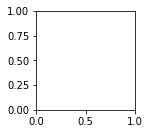

In [13]:
plt.figure()
for k in range(6):
    plt.subplot(2,3,k+1)
    try: 
        plt.imshow(soriavg[keylist[k]][0][ontarget_ret_lax[keylist[k]]].mean(0))
    except: 
        print('could not do ')
        plt.imshow(soriavg[keylist[k]][1][ontarget_ret_lax[keylist[k]]].mean(0))
# plt.savefig('l23_all_expts_size_contrast.pdf')

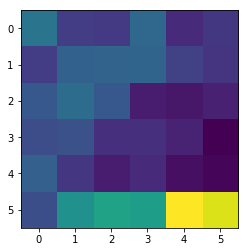

In [8]:
k = -3
plt.figure()
plt.imshow(soriavg[keylist[k]][1].mean(0))

In [9]:
k = 0
ut.imshow_in_rows(soriavg[keylist[k]][ontarget[keylist[k]]])
ut.imshow_in_rows(proc[keylist[k]]['oriavg_dfof'][ontarget[keylist[k]]])

NameError: name 'ontarget' is not defined

In [10]:
k = 0
h,xe,ye = np.histogram2d(ret_vars[keylist[k]]['paramdict_normal']['xo'][()],ret_vars[keylist[k]]['paramdict_normal']['yo'][()],bins=5)
X = np.digitize(ret_vars[keylist[k]]['paramdict_normal']['xo'][()],xe)
Y = np.digitize(ret_vars[keylist[k]]['paramdict_normal']['yo'][()],ye)

In [11]:
keylist = list(soriavg.keys())

In [12]:
strialavg[keylist[1]][0].shape

NameError: name 'strialavg' is not defined

In [13]:
# plt.figure(figsize=(8,24))
# for ind in range(300):
#     plt.subplot(30,10,ind+1)
#     plt.plot(strialavg[keylist[1]][0][ind].mean(-2).mean(-2).T)
#     plt.axis('off')

In [14]:
k = 1
plt.figure(figsize=(5,70))
L = ontarget_ret_lax[keylist[k]].sum()
for ind in range(L):          
    data = strialavg[keylist[k]][0][ontarget_ret_lax[keylist[k]]][ind][:,:,:,8:-8].mean(-1)
    plt.subplot(L,5,ind*5+1)
    plt.imshow(data.mean(0))
    plt.axis('off')
    for i in range(4):
        plt.subplot(L,5,ind*5+i+2)
        plt.imshow(data[i],vmax=data.max())
        plt.axis('off') 
# plt.savefig('size_contrast_tuning_by_ori.png')

NameError: name 'strialavg' is not defined

In [15]:
data = strialavg[keylist[k]][0][ontarget_ret_lax[keylist[k]]][:,:,:,:,8:-8].mean(-1)
ori_pref = sst.mode(np.argmax(data[:,:,:,-2],axis=1),axis=1)[0][:,0]
size_pref_at_ori_pref = np.zeros((data.shape[0],))
size_pref_at_non_pref = np.zeros((data.shape[0],))
for i in range(data.shape[0]):
    non_pref = np.arange(4)!=ori_pref[i]
    size_pref_at_ori_pref[i] = np.argmax(data[i,ori_pref[i],:,-1])
    size_pref_at_non_pref[i] = np.argmax(data[i,non_pref,:,-1].mean(0))
h_ontarget,_,_ = np.histogram2d(size_pref_at_ori_pref,size_pref_at_non_pref,bins=(np.arange(6)-0.1,np.arange(6)-0.1))

NameError: name 'strialavg' is not defined

In [16]:
# data = strialavg[keylist[k]][0][:,:,:,:,8:-8].mean(-1)
# ori_pref = sst.mode(np.argmax(data[:,:,:,-2],axis=1),axis=1)[0][:,0]
# size_pref_at_ori_pref = np.zeros((data.shape[0],))
# size_pref_at_non_pref = np.zeros((data.shape[0],))
# for i in range(data.shape[0]):
#     non_pref = np.arange(4)!=ori_pref[i]
#     size_pref_at_ori_pref[i] = np.argmax(data[i,ori_pref[i],:,-1])
#     size_pref_at_non_pref[i] = np.argmax(data[i,non_pref,:,-1].mean(0))
# h_all,_,_ = np.histogram2d(size_pref_at_ori_pref,size_pref_at_non_pref,bins=(np.arange(6)-0.1,np.arange(6)-0.1))

NameError: name 'strialavg' is not defined

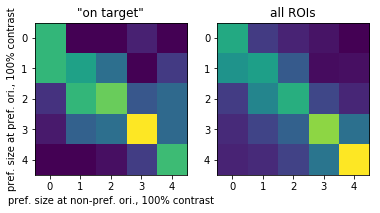

In [140]:
# plt.figure()
# plt.subplot(1,2,1)
# plt.imshow(h_ontarget/h_ontarget.sum(0)[np.newaxis])
# plt.xlabel('pref. size at non-pref. ori., 100% contrast')
# plt.ylabel('pref. size at pref. ori., 100% contrast')
# plt.title('"on target"')
# plt.subplot(1,2,2)
# plt.imshow(h_all/h_all.sum(0)[np.newaxis])
# plt.title('all ROIs')
# plt.savefig('pref_size_by_ori_2d_histogram.pdf')

In [17]:
htemp,_,_ = np.histogram2d((0,),(1,),bins=(-0.1,0.9,1.9))

In [18]:
htemp

array([[ 0.,  1.],
       [ 0.,  0.]])

In [19]:
plt.figure()
plt.scatter(size_pref_at_ori_pref+np.random.randn(data.shape[0])*0.2,size_pref_at_non_pref+np.random.randn(data.shape[0])*0.2,s=1)
plt.plot((0,4),(0,4),c='r')

NameError: name 'size_pref_at_ori_pref' is not defined

In [20]:
# k = 1
# plt.figure(figsize=(5,50))
# L = ontarget_ret_lax[keylist[k]].sum()
# for ind in range(L):
#     data = strialavg[keylist[k]][0][ontarget_ret_lax[keylist[k]]][ind][:,:,:,8:-8].mean(-1)
#     plt.subplot(L,9,ind*9+1)
#     plt.imshow(data.mean(0))
#     plt.axis('off')
#     for i in range(4):
#         plt.subplot(L,9,ind*9+i+2)
#         plt.imshow(data[i],vmax=data.max())
#         plt.axis('off')
#     for i in range(4):
#         plt.subplot(L,9,ind*9+i+6)
#         plt.imshow(data[i]/data[i].max())
#         plt.axis('off') 

NameError: name 'strialavg' is not defined

In [62]:
k = 4
print(ret_vars[keylist[k]]['paramdict_normal']['ctr'])
print(ret_vars[keylist[k]]['position'])

[ 0.  0.]
[0 0]


/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in less
  import sys
/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in less
  if sys.path[0] == '':
/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in less


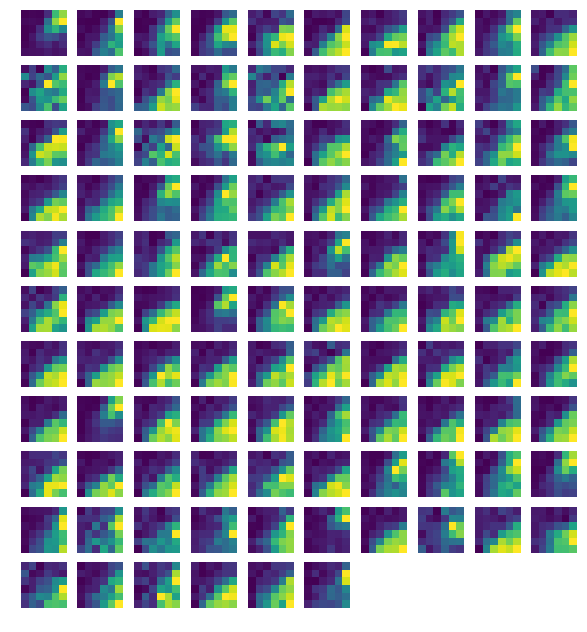

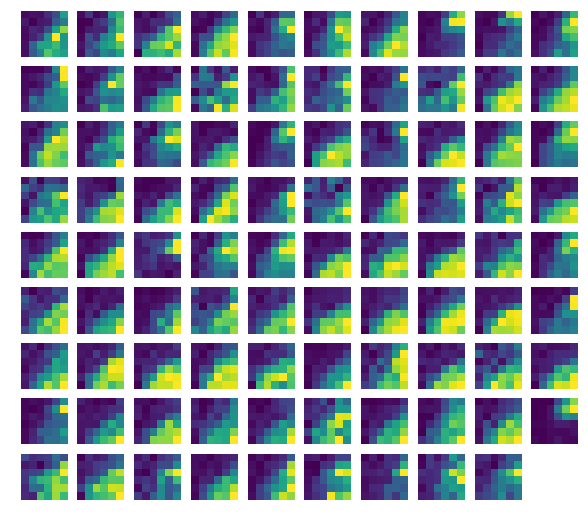

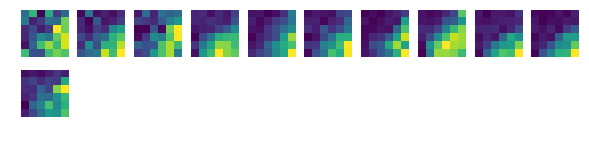

In [63]:
h,xe,ye = np.histogram2d(ret_vars[keylist[k]]['paramdict_normal']['xo'][()],ret_vars[keylist[k]]['paramdict_normal']['yo'][()],bins=np.arange(-25,35,10))
X = np.digitize(ret_vars[keylist[k]]['paramdict_normal']['xo'][()],xe)
Y = np.digitize(ret_vars[keylist[k]]['paramdict_normal']['yo'][()],ye)

i = 2
j = 1
inbin = np.logical_and(np.logical_and(X==j+1,Y==i+1),ret_vars[keylist[k]]['pval_ret']<0.05)
ut.imshow_in_rows(soriavg[keylist[k]][0][inbin],scale=1)

i = 2
j = 2
inbin = np.logical_and(np.logical_and(X==j+1,Y==i+1),ret_vars[keylist[k]]['pval_ret']<0.05)
ut.imshow_in_rows(soriavg[keylist[k]][0][inbin],scale=1)

i = 2
j = 3
inbin = np.logical_and(np.logical_and(X==j+1,Y==i+1),ret_vars[keylist[k]]['pval_ret']<0.05)
ut.imshow_in_rows(soriavg[keylist[k]][0][inbin],scale=1)

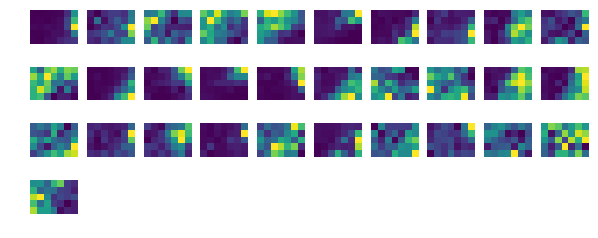

(0, 0)
(0, 1)
(0, 2)
(0, 3)
(0, 4)
(1, 0)
(1, 1)
(1, 2)
(1, 3)
(1, 4)
(2, 0)
(2, 1)
(2, 2)
(2, 3)
(2, 4)
(3, 0)
(3, 1)
(3, 2)
(3, 3)
(3, 4)
(4, 0)


/home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


(4, 1)
(4, 2)
(4, 3)
(4, 4)


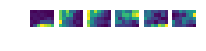

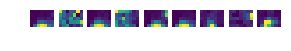

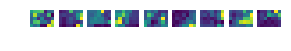

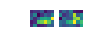

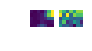

...

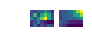

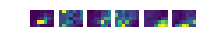

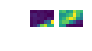

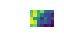

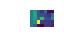

In [47]:
nbins = 5
for k in (1,):
    plt.figure()
    h,xe,ye = np.histogram2d(ret_vars[keylist[k]]['paramdict_normal']['xo'][()],ret_vars[keylist[k]]['paramdict_normal']['yo'][()],bins=np.arange(-25,35,10))
    X = np.digitize(ret_vars[keylist[k]]['paramdict_normal']['xo'][()],xe)
    Y = np.digitize(ret_vars[keylist[k]]['paramdict_normal']['yo'][()],ye)
    for i in range(nbins):
        for j in range(nbins):
#             plt.subplot(nbins,nbins,i*nbins+j+1)
            inbin = np.logical_and(np.logical_and(X==j+1,Y==i+1),ret_vars[keylist[k]]['pval_ret']<0.05)
            if inbin.sum():
                ut.imshow_in_rows(soriavg[keylist[k]][0][inbin])
                print((i,j))

In [38]:
pdb.pm()

> /home/mossing/Documents/code/adesnal/pyute.py(476)imshow_in_rows()
-> nrows = np.ceil(arr.shape[0]/rowlen)
(Pdb) rowlen
0
(Pdb) exit


In [36]:
inbin.sum()

12

/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in less
  # This is added back by InteractiveShellApp.init_path()


IndexError: boolean index did not match indexed array along dimension 0; dimension is 0 but corresponding boolean dimension is 1344

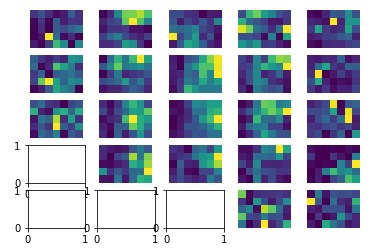

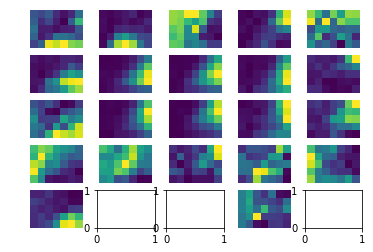

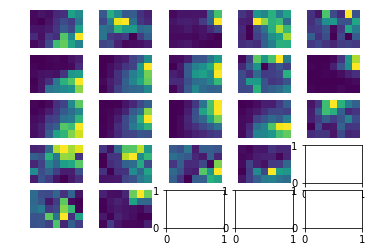

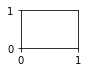

In [33]:
nbins = 5
for k in range(len(keylist)):
    plt.figure()
    h,xe,ye = np.histogram2d(ret_vars[keylist[k]]['paramdict_normal']['xo'][()],ret_vars[keylist[k]]['paramdict_normal']['yo'][()],bins=np.arange(-21,30,10))
    X = np.digitize(ret_vars[keylist[k]]['paramdict_normal']['xo'][()],xe)
    Y = np.digitize(ret_vars[keylist[k]]['paramdict_normal']['yo'][()],ye)
    plt.figure()
    for i in range(nbins):
        for j in range(nbins):
            plt.subplot(nbins,nbins,i*nbins+j+1)
            inbin = np.logical_and(np.logical_and(X==j+1,Y==i+1),ret_vars[keylist[k]]['pval_ret']<0.05)
            if inbin.sum():
                plt.imshow(np.nanmean(soriavg[keylist[k]][0][inbin],0))
                plt.axis('off')

/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in less
  # Remove the CWD from sys.path while we load stuff.


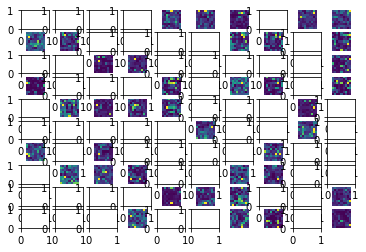

In [34]:
nbins = 10
for k in (-3,):
    h,xe,ye = np.histogram2d(ret_vars[keylist[k]]['paramdict_normal']['xo'][()],ret_vars[keylist[k]]['paramdict_normal']['yo'][()],bins=nbins)
    X = np.digitize(ret_vars[keylist[k]]['paramdict_normal']['xo'][()],xe)
    Y = np.digitize(ret_vars[keylist[k]]['paramdict_normal']['yo'][()],ye)
    plt.figure()
    for i in range(nbins):
        for j in range(nbins):
            plt.subplot(nbins,nbins,i*nbins+j+1)
            inbin = np.logical_and(np.logical_and(X==j+1,Y==i+1),ret_vars[keylist[k]]['pval_ret']<0.05)
            if inbin.sum():
                plt.imshow(np.nanmean(ret_vars[keylist[k]]['ret'][inbin],0))
                plt.axis('off')

In [69]:
#     nbins = 7
#     k = 0
#     xray = np.zeros((nbins,nbins,)+ret_vars[keylist[k]]['ret'].shape[1:])
#     h,xe,ye = np.histogram2d(ret_vars[keylist[k]]['paramdict_normal']['xo'][()],ret_vars[keylist[k]]['paramdict_normal']['yo'][()],bins=nbins)
#     X = np.digitize(ret_vars[keylist[k]]['paramdict_normal']['xo'][()],xe)
#     Y = np.digitize(ret_vars[keylist[k]]['paramdict_normal']['yo'][()],ye)
#     for i in range(nbins):
#         for j in range(nbins):
#             inbin = np.logical_and(np.logical_and(X==j+1,Y==i+1),ret_vars[keylist[k]]['pval_ret']<0.01)
#             if inbin.sum():
#                 xray[i,j] = np.nanmean(ret_vars[keylist[k]]['ret'][inbin],0)

In [76]:
inbins = np.zeros((nbins,nbins,ret_vars[keylist[k]]['ret'].shape[0]),dtype=bool)
                     
h,xe,ye = np.histogram2d(ret_vars[keylist[k]]['paramdict_normal']['xo'][()],ret_vars[keylist[k]]['paramdict_normal']['yo'][()],bins=nbins)
X = np.digitize(ret_vars[keylist[k]]['paramdict_normal']['xo'][()],xe)
Y = np.digitize(ret_vars[keylist[k]]['paramdict_normal']['yo'][()],ye)
                     
for i in range(nbins):
    for j in range(nbins):
        inbins[i,j] = np.logical_and(np.logical_and(X==j+1,Y==i+1),ret_vars[keylist[k]]['pval_ret']<0.01)

/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in less
  if __name__ == '__main__':


<IPython.core.display.Javascript object>


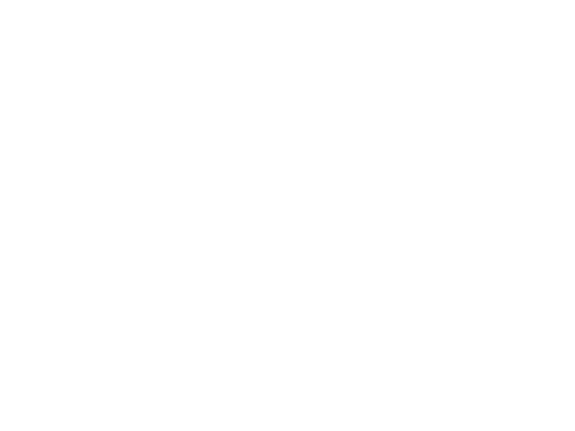

<IPython.core.display.Javascript object>


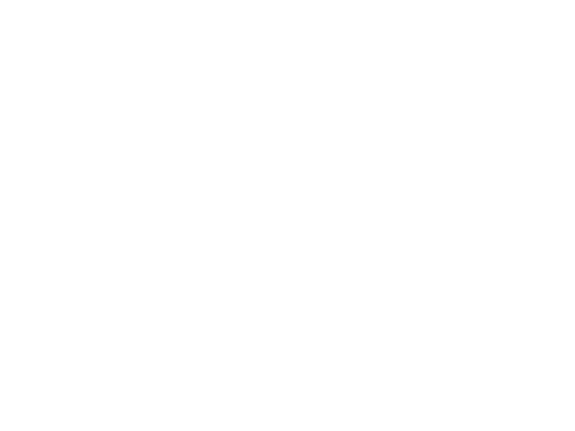

<IPython.core.display.Javascript object>


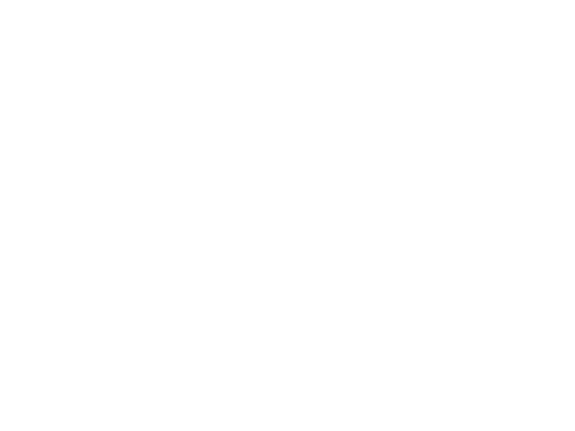

In [196]:
nbins = 7
xray = np.zeros((len(keylist),nbins,nbins,)+soriavg[keylist[k]][0].shape[1:])
for k in range(len(keylist)):
    h,xe,ye = np.histogram2d(ret_vars[keylist[k]]['paramdict_normal']['xo'][()],ret_vars[keylist[k]]['paramdict_normal']['yo'][()],bins=nbins)
    X = np.digitize(ret_vars[keylist[k]]['paramdict_normal']['xo'][()],xe)
    Y = np.digitize(ret_vars[keylist[k]]['paramdict_normal']['yo'][()],ye)
    for i in range(nbins):
        for j in range(nbins):
            inbin = np.logical_and(np.logical_and(X==j+1,Y==i+1),ret_vars[keylist[k]]['pval_ret']<0.05)
            if inbin.sum():
                xray[k,i,j] = np.nanmean(soriavg[keylist[k]][0][inbin]/soriavg[keylist[k]][0][inbin].max(-1).max(-1)[:,np.newaxis,np.newaxis],0)
    plt.figure()
    for i in range(xray.shape[-2]):
        for j in range(xray.shape[-1]):
            plt.subplot(xray.shape[-2],xray.shape[-1],xray.shape[-1]*i+j+1)
            plt.imshow(xray[k,:,:,i,j],vmin=xray.min(),vmax=xray.max())
            plt.axis('off')

<IPython.core.display.Javascript object>


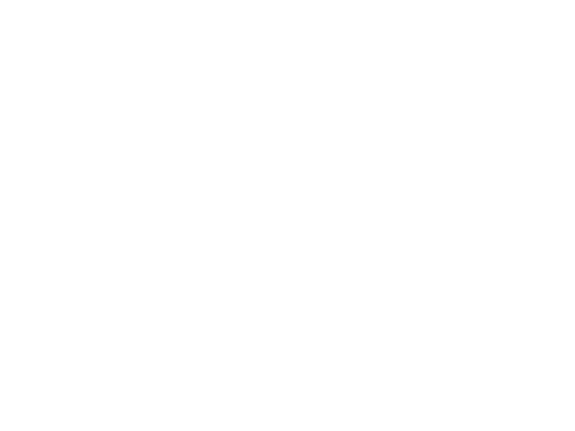

In [197]:
plt.figure()
for i in range(xray.shape[-2]):
    for j in range(xray.shape[-1]):
        plt.subplot(xray.shape[-2],xray.shape[-1],xray.shape[-1]*i+j+1)
        plt.imshow(xray[:,:,:,i,j].mean(0),vmin=xray.mean(0).min(),vmax=xray.mean(0).max())
        plt.axis('off')

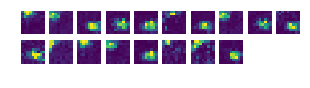

In [43]:
ut.imshow_in_rows(ret_vars[keylist[k]]['ret'][inbins[4,4]])

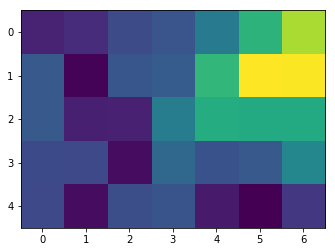

In [86]:
plt.figure()
plt.imshow(np.nanmean(soriavg[keylist[k]][0][np.logical_and(X==2,Y==4)],0))

In [26]:
ontarget = {}
for key in keylist:
    ontarget[key] = np.logical_and(soriavg[key][0][:,0,-1]>soriavg[key][0][:,0,0],np.nanmin(pval[key][0],axis=1)<0.01/(np.logical_not(np.isnan(pval[key][0])).sum()))
    print(ontarget[key].sum())

25
1
0


In [141]:
a = rt.ontarget_by_retinotopy(ret_vars[key],ctr=pos,rg=30)

In [142]:
a

(array([False, False, False, ..., False, False, False], dtype=bool),
 array([-15.25855373,  -0.12028518,   7.49823256, ...,   0.        ,
         11.48399348,  -7.59343604]))

In [28]:
offtarget_ret_lax = {}
for key in keylist:
    pos = ret_vars[key]['position']
    offtarget_ret_lax[key] = np.logical_and(rt.ontarget_by_retinotopy(ret_vars[key],ctr=pos,rg=30)[0],np.logical_not(rt.ontarget_by_retinotopy(ret_vars[key],ctr=pos,rg=10)[0]))
    print(offtarget_ret_lax[key].sum())

91
41
45


/home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1316: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


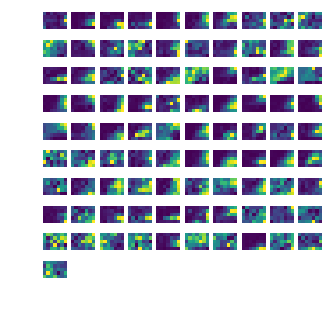

In [148]:
k = 0
ut.imshow_in_rows(soriavg[keylist[k]][0][offtarget_ret_lax[keylist[k]]])

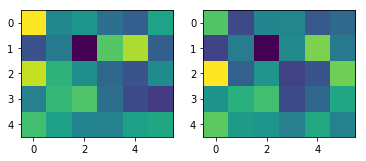

In [34]:
k = 2
plt.figure()
plt.subplot(1,2,1)
plt.imshow(soriavg[keylist[k]][0][ontarget_ret_lax[keylist[k]]].mean(0))
plt.subplot(1,2,2)
plt.imshow(soriavg[keylist[k]][0][offtarget_ret_lax[keylist[k]]].mean(0))

/home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1316: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


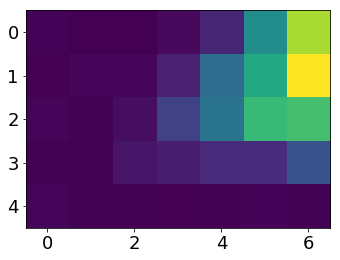

In [72]:
k = 0
plt.imshow(soriavg[keylist[k]][0][ontarget_ret_lax[keylist[k]]][48])

In [126]:
os.mkdir('190125_figs/example_size_by_contrast')

/home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1316: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


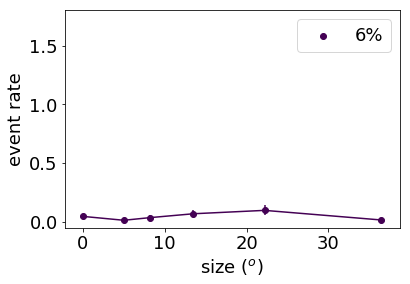

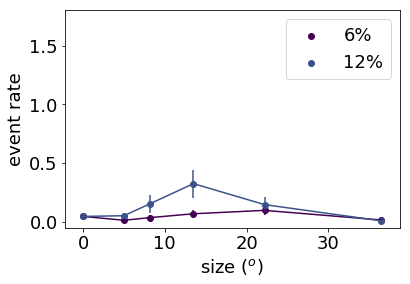

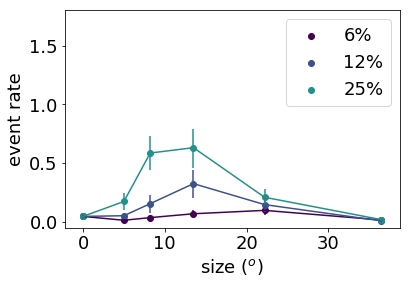

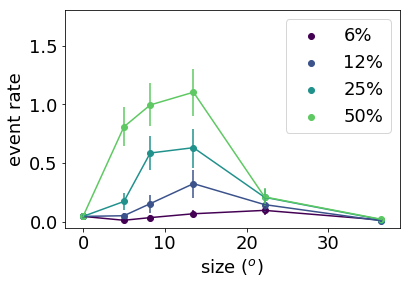

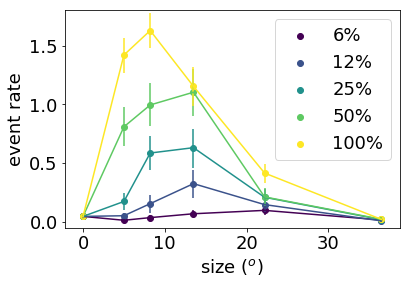

In [127]:
colors = plt.cm.viridis(np.linspace(0,1,5))
for cap in range(2,7):
    plt.figure()
    k = 0
    ind = 48
    mn_tgt = sca.append_gray(soriavg[keylist[k]][0][ontarget_ret_lax[keylist[k]]][ind][:,2:cap+1])
    lb_tgt = sca.append_gray(lb[keylist[k]][0][ontarget_ret_lax[keylist[k]]][ind].mean(0)[:,2:cap+1])
    ub_tgt = sca.append_gray(ub[keylist[k]][0][ontarget_ret_lax[keylist[k]]][ind].mean(0)[:,2:cap+1])
    ut.plot_errorbars_hillel(s0,mn_tgt.T,lb_tgt.T,ub_tgt.T,colors = colors[:cap-1])
    plt.ylabel('event rate')
    plt.xlabel('size ($^o$)')
    plt.legend([str(int(np.round(x)))+'%' for x in c[1:cap]])
    plt.ylim((-0.05,1.8))
    plt.savefig('190125_figs/example_size_by_contrast/ex1_size_tuning'+str(cap-2)+'.pdf')


/home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1316: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


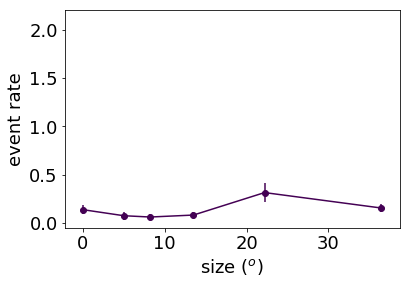

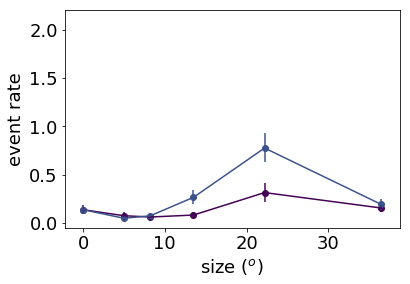

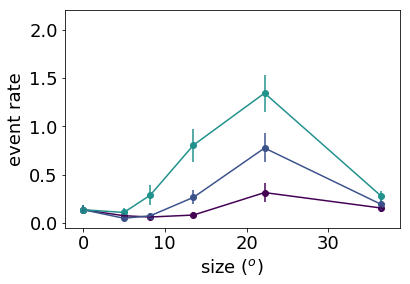

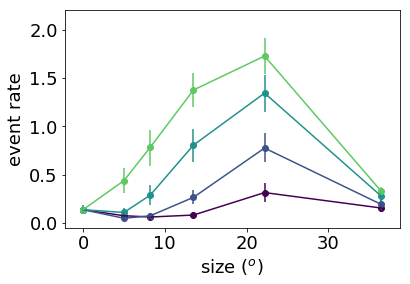

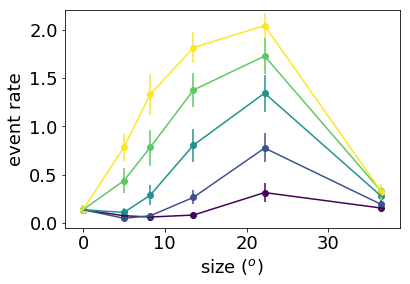

In [131]:
colors = plt.cm.viridis(np.linspace(0,1,5))
for cap in range(2,7):
    plt.figure()
    k = 0
    ind = 37
    mn_tgt = sca.append_gray(soriavg[keylist[k]][0][ontarget_ret_lax[keylist[k]]][ind][:,2:cap+1])
    lb_tgt = sca.append_gray(lb[keylist[k]][0][ontarget_ret_lax[keylist[k]]][ind].mean(0)[:,2:cap+1])
    ub_tgt = sca.append_gray(ub[keylist[k]][0][ontarget_ret_lax[keylist[k]]][ind].mean(0)[:,2:cap+1])
    ut.plot_errorbars_hillel(s0,mn_tgt.T,lb_tgt.T,ub_tgt.T,colors = colors[:cap-1])
    plt.ylabel('event rate')
    plt.xlabel('size ($^o$)')
#     plt.legend([str(int(np.round(x)))+'%' for x in c[1:cap]])
    plt.ylim((-0.05,2.2))
    plt.savefig('example_size_by_contrast/ex2_size_tuning'+str(cap-2)+'.pdf')

/home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1316: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


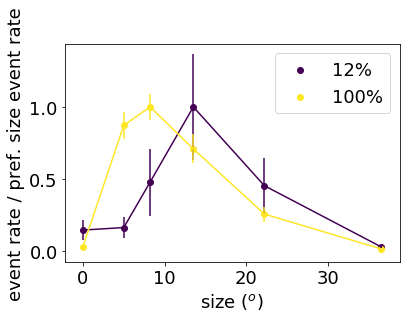

In [132]:
plt.figure()
colors = plt.cm.viridis(0,1,5)
k = 0
ind = 48
mn_tgt = sca.append_gray(soriavg[keylist[k]][0][ontarget_ret_lax[keylist[k]]][ind][:,2:])
lb_tgt = sca.append_gray(lb[keylist[k]][0][ontarget_ret_lax[keylist[k]]][ind].mean(0)[:,2:])
ub_tgt = sca.append_gray(ub[keylist[k]][0][ontarget_ret_lax[keylist[k]]][ind].mean(0)[:,2:])
normby = mn_tgt[:,1::3].max(0)[np.newaxis,:]
ut.plot_errorbars_hillel(s0,(mn_tgt[:,1::3]/normby).T,(lb_tgt[:,1::3]/normby).T,(ub_tgt[:,1::3]/normby).T)
plt.ylabel('event rate / pref. size event rate')
plt.xlabel('size ($^o$)')
plt.legend([str(int(np.round(x)))+'%' for x in c[2::3]])
plt.savefig('example_size_by_contrast/ex1_pref_size_normalized'+str(cap-2)+'.pdf')

/home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1316: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


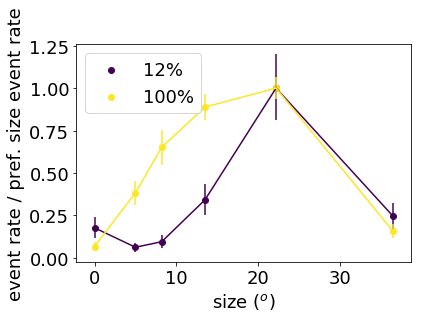

In [134]:
plt.figure()
colors = plt.cm.viridis(0,1,5)
k = 0
ind = 37
mn_tgt = sca.append_gray(soriavg[keylist[k]][0][ontarget_ret_lax[keylist[k]]][ind][:,2:])
lb_tgt = sca.append_gray(lb[keylist[k]][0][ontarget_ret_lax[keylist[k]]][ind].mean(0)[:,2:])
ub_tgt = sca.append_gray(ub[keylist[k]][0][ontarget_ret_lax[keylist[k]]][ind].mean(0)[:,2:])
normby = mn_tgt[:,1::3].max(0)[np.newaxis,:]
ut.plot_errorbars_hillel(s0,(mn_tgt[:,1::3]/normby).T,(lb_tgt[:,1::3]/normby).T,(ub_tgt[:,1::3]/normby).T)
plt.ylabel('event rate / pref. size event rate')
plt.xlabel('size ($^o$)')
plt.legend([str(int(np.round(x)))+'%' for x in c[2::3]])
plt.savefig('example_size_by_contrast/ex2_pref_size_normalized'+str(cap-2)+'.pdf')

In [82]:
plt.figure()
colors = plt.cm.viridis(0,1,5)
k = 0
ind = 37
mn_tgt = sca.append_gray(soriavg[keylist[k]][0][ontarget_ret_lax[keylist[k]]][ind][:,2:])
lb_tgt = sca.append_gray(lb[keylist[k]][0][ontarget_ret_lax[keylist[k]]][ind].mean(0)[:,2:])
ub_tgt = sca.append_gray(ub[keylist[k]][0][ontarget_ret_lax[keylist[k]]][ind].mean(0)[:,2:])
ut.plot_errorbars_hillel(s0,mn_tgt.T,lb_tgt.T,ub_tgt.T)
plt.ylabel('event rate')
plt.xlabel('size ($^o$)')

(1228, 4, 5, 7)

/home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1316: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


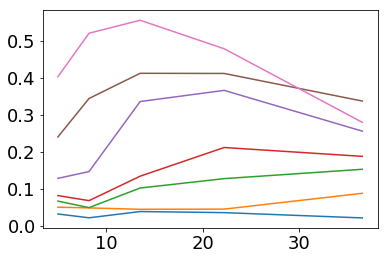

In [78]:
plt.figure()
plt.plot(s,soriavg[keylist[k]][0][ontarget_ret_lax[keylist[k]]][101])

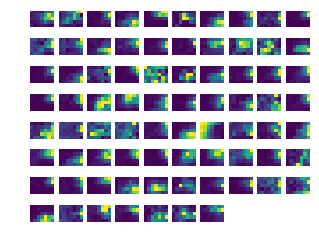

In [60]:
k = 1
ut.imshow_in_rows(soriavg[keylist[k]][0][ontarget_ret_lax[keylist[k]]])

In [55]:
dspc

NameError: name 'dspc' is not defined

In [54]:
def compute_suppression_index(arr):
    return (arr.max(1)-arr[:,-1])/(arr[:,-1]+arr.max(1))

si = compute_suppression_index(soriavg[keylist[k]][0][ontarget_ret_lax[keylist[k]]])

font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 18}

matplotlib.rc('font', **font)

plt.figure(figsize=(6,5))
for k in range(2):
    si = compute_suppression_index(soriavg[keylist[k]][0][ontarget_ret_lax[keylist[k]]])
    plt.scatter(si[:,2]+0.01*np.random.randn(si.shape[0]),si[:,-1]+0.01*np.random.randn(si.shape[0]),c='k')
#     lbsi6,ubsi6 = ut.bootstrap(si[:,2],fn=np.nanmean)
#     lbsi100,ubsi100 = ut.bootstrap(si[:,-1],fn=np.nanmean)
    
plt.xlabel('suppression index, 6% contrast')
plt.ylabel('suppression index, 100% contrast')
plt.plot((0,1),(0,1),c='k')
# plt.savefig('si_low_contrast_high_contrast.pdf')

NameError: name 'k' is not defined

/home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1316: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


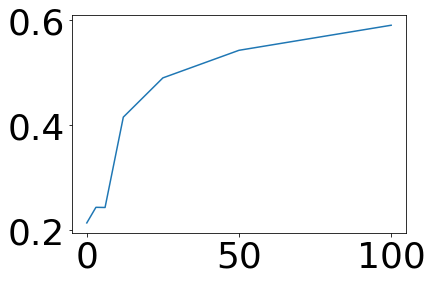

In [51]:
plt.figure()
plt.plot(np.array((0,3,6,12,25,50,100)),si.mean(0))

In [4]:
s0 = np.concatenate(((0,),s))

In [151]:
# on target based on size/contrast responses
ucontrast = {}
to_take_c = {}
intersect = np.array(())
for key in keylist:
    gdind = sca.find_gdind(soriavg[key])
    ucontrast[key] = np.unique(proc[key][gdind]['contrast'])
for key in keylist:
    if not intersect.size:
        intersect = ucontrast[key]
    else:
        intersect = np.intersect1d(intersect,ucontrast[key])
for key in keylist:
    to_take_c[key] = np.where(np.in1d(ucontrast[key],intersect))[0]
    
c = 100*intersect
    
usize = {}
to_take_s = {}
intersect = np.array(())
for key in keylist:
    gdind = sca.find_gdind(soriavg[key])
    usize[key] = np.unique(proc[key][gdind]['size'])
for key in keylist:
    if not intersect.size:
        intersect = usize[key]
    else:
        intersect = np.intersect1d(intersect,usize[key])
for key in keylist:
    to_take_s[key] = np.where(np.in1d(usize[key],intersect))[0]

s = intersect
s0 = np.concatenate(((0,),s))

snorm = sca.get_norm_curves_row_col(soriavg,ontarget_ret_lax,sizes=to_take_s,contrasts=to_take_c,append_gray=True)
snorm_off = sca.get_norm_curves_row_col(soriavg,offtarget_ret_lax,sizes=to_take_s,contrasts=to_take_c,append_gray=True)

/home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1316: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


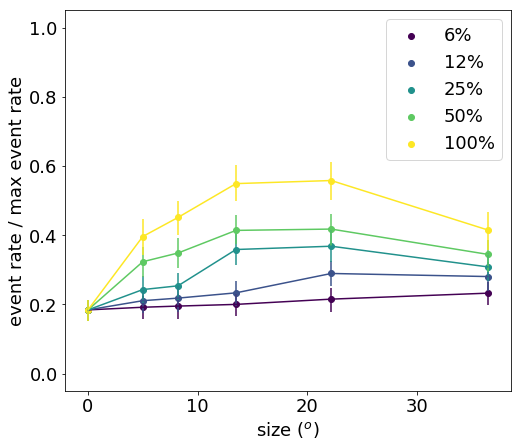

In [159]:
plt.figure(figsize=(8,7))
ut.plot_bootstrapped_errorbars_hillel(s0,snorm_off[0][:,:,2:].transpose((0,2,1)))
plt.xlabel('size ($^o$)')
plt.ylabel('event rate / max event rate')
plt.ylim((-0.05,1.05))
plt.legend([str(int(np.round(x)))+'%' for x in c[2:]])
plt.savefig('190125_figs/pc_size_by_contrast_190125_running_only_off_target.pdf')

/home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1316: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


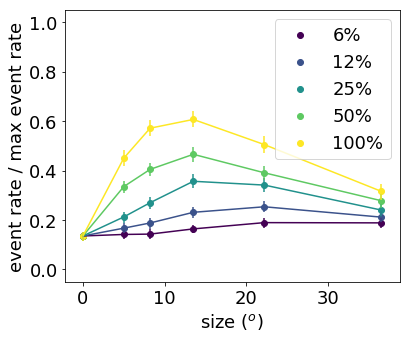

In [157]:
plt.figure(figsize=(6,5))
ut.plot_bootstrapped_errorbars_hillel(s0,np.concatenate((snorm[0],snorm_off[0]),axis=0)[:,:,2:].transpose((0,2,1)))
plt.xlabel('size ($^o$)')
plt.ylabel('event rate / max event rate')
plt.ylim((-0.05,1.05))
plt.legend([str(int(np.round(x)))+'%' for x in c[2:]])

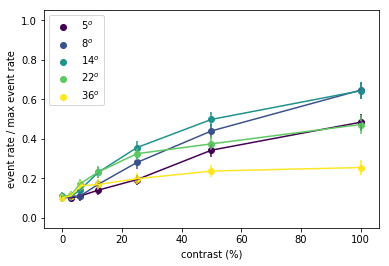

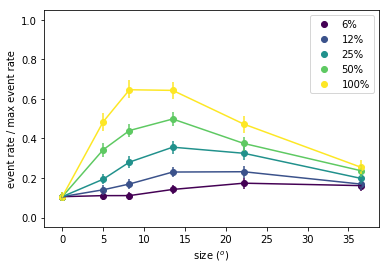

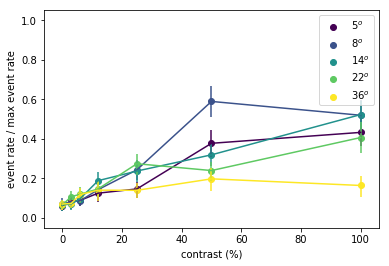

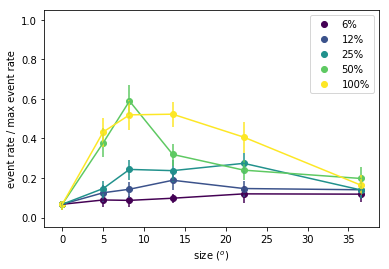

In [65]:
plt.figure()
ut.plot_bootstrapped_errorbars_hillel(c,snorm[0][:,1:])
plt.xlabel('contrast (%)')
plt.ylabel('event rate / max event rate')
plt.ylim((-0.05,1.05))
plt.legend([str(int(np.round(x)))+'$^o$' for x in s])
plt.savefig('190125_figs/pc_contrast_by_size_190125_running_only.pdf')

plt.figure()
ut.plot_bootstrapped_errorbars_hillel(s0,snorm[0][:,:,2:].transpose((0,2,1)))
plt.xlabel('size ($^o$)')
plt.ylabel('event rate / max event rate')
plt.ylim((-0.05,1.05))
plt.legend([str(int(np.round(x)))+'%' for x in c[2:]])
plt.savefig('190125_figs/pc_size_by_contrast_190125_running_only.pdf')

plt.figure()
ut.plot_bootstrapped_errorbars_hillel(c,snorm[1][:,1:])
plt.xlabel('contrast (%)')
plt.ylabel('event rate / max event rate')
plt.ylim((-0.05,1.05))
plt.legend([str(int(np.round(x)))+'$^o$' for x in s])
plt.savefig('190125_figs/pc_contrast_by_size_190125_non_running_only.pdf')

plt.figure()
ut.plot_bootstrapped_errorbars_hillel(s0,snorm[1][:,:,2:].transpose((0,2,1)))
plt.xlabel('size ($^o$)')
plt.ylabel('event rate / max event rate')
plt.ylim((-0.05,1.05))
plt.legend([str(int(np.round(x)))+'%' for x in c[2:]])
plt.savefig('190125_figs/pc_size_by_contrast_190125_non_running_only.pdf')

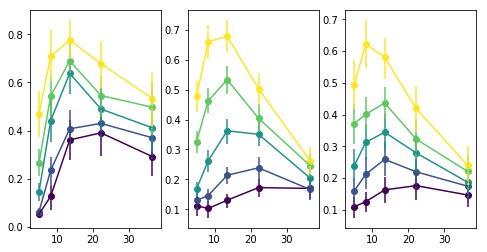

In [44]:
c = np.array((0,3,6,12,25,50,100))
s = np.logspace(np.log10(5),np.log10(36.5),5)
plt.figure(figsize=(8,4))
for k in range(3):
    snorm = soriavg[keylist[k]][ontarget[keylist[k]]]/soriavg[keylist[k]][ontarget[keylist[k]]].max(1).max(1)[:,np.newaxis,np.newaxis]
    plt.subplot(1,3,k+1)
    ut.plot_bootstrapped_errorbars_hillel(s,snorm[:,:5,-5:].transpose((0,2,1)))

In [3]:
c = np.array((0,3,6,12,25,50,100))
s = np.logspace(np.log10(5),np.log10(36.5),5)
plt.figure(figsize=(8,4))
for k in range(3):
    snorm = soriavg[keylist[k]][ontarget[keylist[k]]]/soriavg[keylist[k]][ontarget[keylist[k]]].max(1).max(1)[:,np.newaxis,np.newaxis]
    plt.subplot(1,3,k+1)
    ut.plot_bootstrapped_errorbars_hillel(s,snorm[:,:5,-5:].transpose((0,2,1)))

NameError: name 'soriavg' is not defined

In [66]:
with open('pc_snorm_list.p', 'wb') as handle:
    pkl.dump(snorm, handle, protocol=pkl.HIGHEST_PROTOCOL)

In [13]:
with open('pc_snorm_list.p', 'rb') as handle:
    snorm_pc = pkl.load(handle)
with open('sst_snorm_list.p', 'rb') as handle:
    snorm_sst = pkl.load(handle)
with open('vip_snorm_list.p', 'rb') as handle:
    snorm_vip = pkl.load(handle)

In [4]:
# pconm = np.nanmean(snorm[0][:,1:,np.array((1,0,1,1,1,1,1),dtype=bool)],axis=0)
# pcoffm = np.nanmean(snorm_off[0][:,1:,np.array((1,0,1,1,1,1,1),dtype=bool)],axis=0)
pconm = np.nanmean(snorm_pc[0][:,1:,np.array((1,0,1,1,1,1,1),dtype=bool)],axis=0)
sstm = np.nanmean(snorm_sst[0][:,1:],axis=0)
vipm = np.nanmean(snorm_vip[0][:,1:],axis=0)

In [197]:
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score

# Create linear regression object
regr = linear_model.LinearRegression()

X = np.concatenate((pconm.flatten()[:,np.newaxis],pcoffm.flatten()[:,np.newaxis],vipm.flatten()[:,np.newaxis]),axis=1)
y = sstm.flatten()[:,np.newaxis]

# Train the model using the training sets
regr.fit(X,np.sqrt(y))
ypred_vip = regr.predict(X)**2

X = np.concatenate((pconm.flatten()[:,np.newaxis],pcoffm.flatten()[:,np.newaxis]),axis=1)
y = sstm.flatten()[:,np.newaxis]

# Train the model using the training sets
regr.fit(X,np.sqrt(y))
ypred_no_vip = regr.predict(X)**2

/home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1316: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


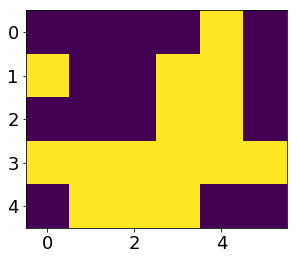

In [198]:
plt.figure()
plt.imshow((y<ypred).reshape((5,6)))

/home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1316: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


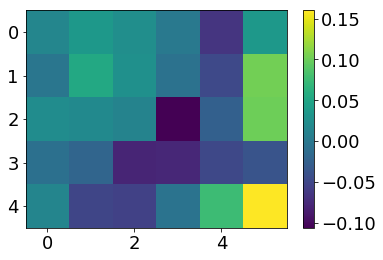

In [196]:
plt.figure()
plt.imshow((y-ypred).reshape((5,6)))
plt.colorbar()

/home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1316: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


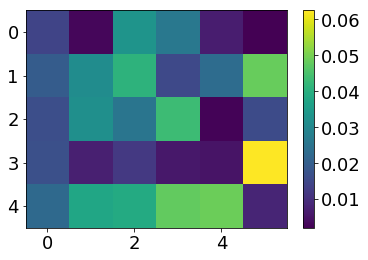

In [202]:
plt.figure()
plt.imshow((np.abs(ypred_vip-ypred_no_vip)).reshape((5,6)))
plt.colorbar()

/home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1316: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


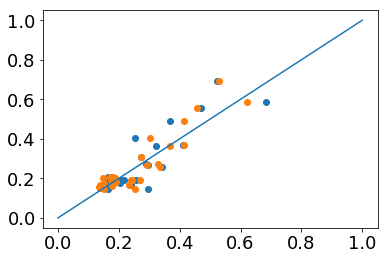

In [200]:
plt.figure()
plt.scatter(ypred_no_vip,y)
plt.scatter(ypred_vip,y)
plt.plot((0,1),(0,1))

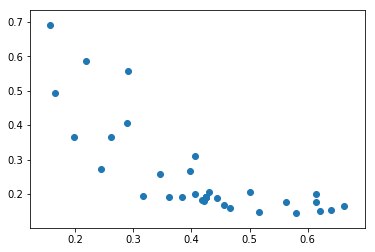

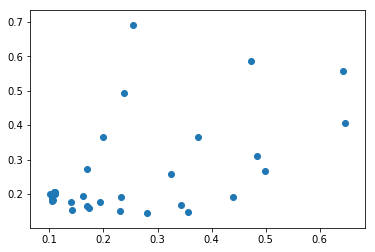

In [6]:
plt.figure()
plt.scatter(np.nanmean(snorm_vip[0],0).flatten(),np.nanmean(snorm_sst[0],0).flatten())
plt.figure()
plt.scatter(np.nanmean(snorm_pc[0][:,:,np.array((1,0,1,1,1,1,1),dtype=bool)],0).flatten(),np.nanmean(snorm_sst[0],0).flatten())

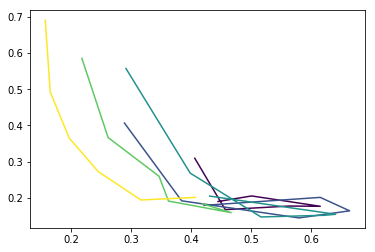

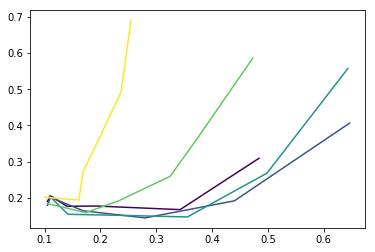

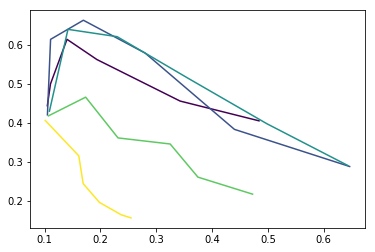

In [4]:
plt.figure()
colors = plt.cm.viridis(np.linspace(0,1,5))
for k in range(5):
    plt.plot(np.nanmean(snorm_vip[0],0)[k+1],np.nanmean(snorm_sst[0],0)[k+1],c=colors[k])

plt.figure()
for k in range(5):
    plt.plot(np.nanmean(snorm_pc[0][:,:,np.array((1,0,1,1,1,1,1),dtype=bool)],0)[k+1],np.nanmean(snorm_sst[0],0)[k+1],c=colors[k])

plt.figure()
for k in range(5):
    plt.plot(np.nanmean(snorm_pc[0][:,:,np.array((1,0,1,1,1,1,1),dtype=bool)],0)[k+1],np.nanmean(snorm_vip[0],0)[k+1],c=colors[k])

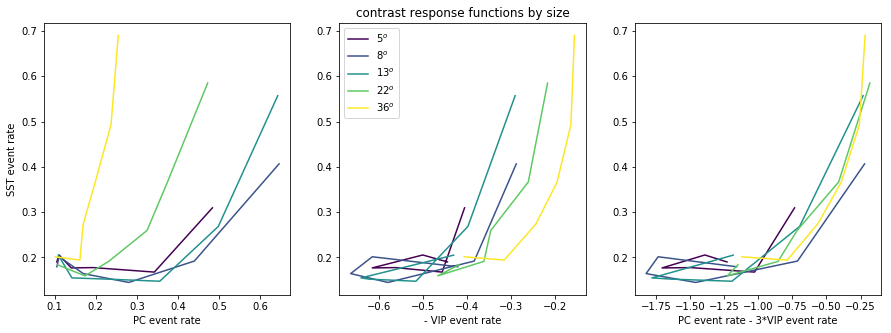

In [9]:
wt = 3
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
for k in range(5):
    plt.plot(np.nanmean(snorm_pc[0][:,:,np.array((1,0,1,1,1,1,1),dtype=bool)],0)[k+1]-0*np.nanmean(snorm_vip[0],0)[k+1],np.nanmean(snorm_sst[0],0)[k+1],c=colors[k])
plt.xlabel('PC event rate')
plt.ylabel('SST event rate')
plt.subplot(1,3,2)
plt.title('contrast response functions by size')
for k in range(5):
    plt.plot(0*np.nanmean(snorm_pc[0][:,:,np.array((1,0,1,1,1,1,1),dtype=bool)],0)[k+1]-np.nanmean(snorm_vip[0],0)[k+1],np.nanmean(snorm_sst[0],0)[k+1],c=colors[k])
plt.xlabel('- VIP event rate')
plt.legend(['5$^o$','8$^o$','13$^o$','22$^o$','36$^o$'])
plt.subplot(1,3,3)
for k in range(5):
    plt.plot(np.nanmean(snorm_pc[0][:,:,np.array((1,0,1,1,1,1,1),dtype=bool)],0)[k+1]-wt*np.nanmean(snorm_vip[0],0)[k+1],np.nanmean(snorm_sst[0],0)[k+1],c=colors[k])
plt.xlabel('PC event rate - 3*VIP event rate')
# plt.legend(['5$^o$','8$^o$','13$^o$','22$^o$','36$^o$'])
plt.savefig('pc_sst_vip_rotation.pdf')
plt.savefig('pc_sst_vip_rotation.png')

In [ ]:
wt = 3
colors = plt.cm.viridis(np.linspace(0,1,5))
plt.figure(figsize=(16,2))
# plt.subplot(1,2,1)
# for k in range(5):
#     plt.plot(np.nanmean(snorm_pc[0][:,:,np.array((1,0,1,1,1,1,1),dtype=bool)],0)[k+1]-wt*np.nanmean(snorm_vip[0],0)[k+1],np.nanmean(snorm_sst[0],0)[k+1],c=colors[k])
# plt.subplot(1,2,2)
wtmax = 8
offset = 0
for wt in range(wtmax):
    plt.subplot(1,wtmax,wt+1)
    for k in range(5):
        plt.plot(offset + np.nanmean(snorm_pc[0][:,:,np.array((1,0,1,1,1,1,1),dtype=bool)],0)[k+1]-wt*np.nanmean(snorm_sst[0],0)[k+1],np.nanmean(snorm_vip[0],0)[k+1],c=colors[k])

Text(0.5,0,'PC event rate - 3*VIP event rate')

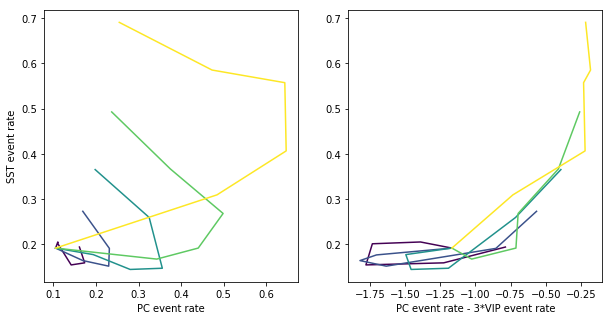

In [18]:
wt = 3
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
for k in range(5):
    plt.plot(np.nanmean(snorm_pc[0][:,:,np.array((1,0,1,1,1,1,1),dtype=bool)],0)[:,k+1]-0*np.nanmean(snorm_vip[0],0)[:,k+1],np.nanmean(snorm_sst[0],0)[:,k+1],c=colors[k])
plt.xlabel('PC event rate')
plt.ylabel('SST event rate')
plt.subplot(1,2,2)
for k in range(5):
    plt.plot(np.nanmean(snorm_pc[0][:,:,np.array((1,0,1,1,1,1,1),dtype=bool)],0)[:,k+1]-wt*np.nanmean(snorm_vip[0],0)[:,k+1],np.nanmean(snorm_sst[0],0)[:,k+1],c=colors[k])
plt.xlabel('PC event rate - 3*VIP event rate')

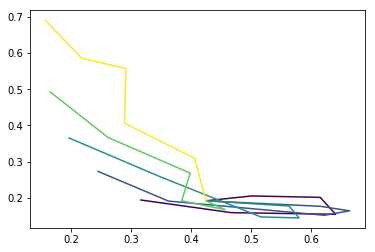

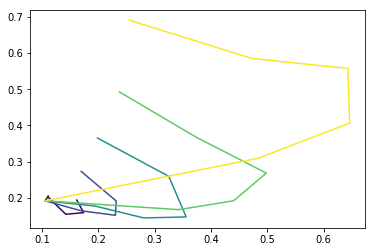

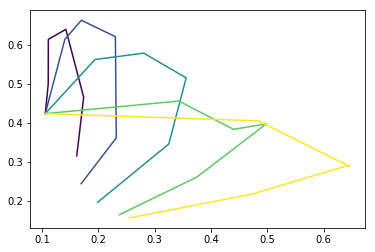

In [7]:
plt.figure()
colors = plt.cm.viridis(np.linspace(0,1,5))
for k in range(5):
    plt.plot(np.nanmean(snorm_vip[0],0)[:,k+1],np.nanmean(snorm_sst[0],0)[:,k+1],c=colors[k])

plt.figure()
for k in range(5):
    plt.plot(np.nanmean(snorm_pc[0][:,:,np.array((1,0,1,1,1,1,1),dtype=bool)],0)[:,k+1],np.nanmean(snorm_sst[0],0)[:,k+1],c=colors[k])

plt.figure()
for k in range(5):
    plt.plot(np.nanmean(snorm_pc[0][:,:,np.array((1,0,1,1,1,1,1),dtype=bool)],0)[:,k+1],np.nanmean(snorm_vip[0],0)[:,k+1],c=colors[k])

/home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1316: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


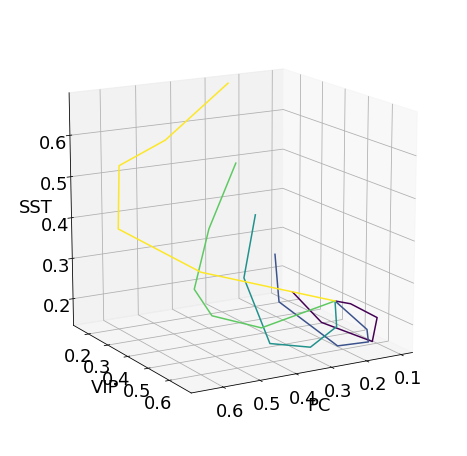

In [212]:
# plt.figure(figsize=(5,5))
# ax = plt.axes(projection='3d')

# # Data for a three-dimensional line
# for k in range(5):
#     xline = np.nanmean(snorm_pc[0][:,:,np.array((1,0,1,1,1,1,1),dtype=bool)],0)[k+1]
#     yline = np.nanmean(snorm_vip[0],0)[k+1]
#     zline = np.nanmean(snorm_sst[0],0)[k+1]
#     ax.plot3D(xline, yline, zline, c=colors[k])
# ax.view_init(15, 60)

plt.figure(figsize=(8,8))
ax = plt.axes(projection='3d')

# Data for a three-dimensional line
for k in range(5):
    xline = np.nanmean(snorm_pc[0][:,:,np.array((1,0,1,1,1,1,1),dtype=bool)],0)[:,k+1]
    yline = np.nanmean(snorm_vip[0],0)[:,k+1]
    zline = np.nanmean(snorm_sst[0],0)[:,k+1]
    ax.plot3D(xline, yline, zline, c=colors[k])
ax.view_init(15, 60)

ax.set_xlabel('PC')
ax.set_ylabel('VIP')
ax.set_zlabel('SST')

plt.savefig('pc_vip_sst_3d_size_tuning.pdf')

# plt.figure(figsize=(5,5))
# ax = plt.axes(projection='3d')

# for k in range(5):
#     xline = np.nanmean(snorm_pc[0][:,:,np.array((1,0,1,1,1,1,1),dtype=bool)],0)[:,k+1]
#     yline = np.nanmean(snorm_vip[0],0)[:,k+1]
#     zline = np.nanmean(snorm_sst[0],0)[:,k+1]
#     ax.plot3D(xline, yline, zline, c=colors[k])
# for k in range(5):
#     xline = np.nanmean(snorm_pc[0][:,:,np.array((1,0,1,1,1,1,1),dtype=bool)],0)[k+1]
#     yline = np.nanmean(snorm_vip[0],0)[k+1]
#     zline = np.nanmean(snorm_sst[0],0)[k+1]
#     ax.plot3D(xline, yline, zline, c=colors[k])
# ax.view_init(15, 135)

In [13]:
import matplotlib
reload(ut)

<module 'pyute' from '/home/mossing/Documents/code/adesnal/pyute.py'>

In [18]:
len(snorm_pc)

2

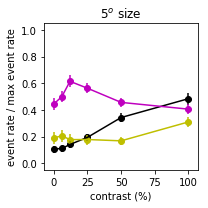

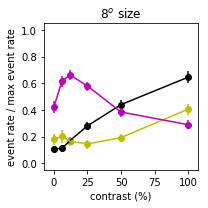

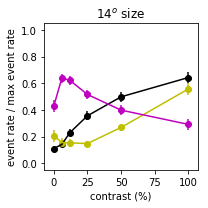

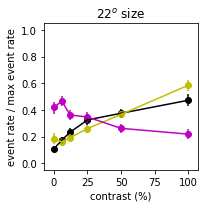

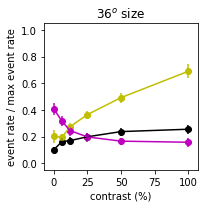

In [17]:
c = np.array((0,6,12,25,50,100))
s = np.logspace(np.log10(5),np.log10(36.5),5)
# font = {'family' : 'normal',
#         'weight' : 'normal',
#         'size'   : 36}

# matplotlib.rc('font', **font)
# plt.figure(figsize=(10,2))
# os.mkdir('lin_axis_crfs')
lw = None
ms = None
for k in range(5):
#     plt.subplot(1,5,k+1)
    plt.figure(figsize=(3,3))
    ut.plot_bootstrapped_errorbars_hillel(c,snorm_pc[0][:,k+1:k+2][:,:,np.array((1,0,1,1,1,1,1),dtype=bool)],colors='k',linewidth=lw,markersize=ms)
    ut.plot_bootstrapped_errorbars_hillel(c,snorm_sst[0][:,k+1:k+2],colors='y',linewidth=lw,markersize=ms)
    ut.plot_bootstrapped_errorbars_hillel(c,snorm_vip[0][:,k+1:k+2],colors='m',linewidth=lw,markersize=ms)
#     plt.xticks(np.arange(6),[str(x) for x in (0,6,12,25,50,100)])
    plt.xlabel('contrast (%)')
    plt.ylabel('event rate / max event rate')
    plt.title(str(int(np.round(s[k])))+'$^o$ size')
    plt.ylim((-0.05,1.05))
    plt.tight_layout()
    plt.savefig('lin_axis_crfs/'+str(k)+'.pdf')
    plt.savefig('lin_axis_crfs/'+str(k)+'.png')
#     plt.savefig('190125_figs/three_cell_types_movie_c_by_s/three_cell_types_contrast_by_size_190125_running_only'+str(k)+'.tif')
    
    
# c = np.array((0,6,12,25,50,100))
# # plt.figure(figsize=(10,2))
# for k in range(5):
# #     plt.subplot(1,5,k+1)
#     plt.figure(figsize=(3,3))
#     ut.plot_bootstrapped_errorbars_hillel(s0,snorm_pc[0][:,:,k+2:k+3].transpose((0,2,1)),colors='k',linewidth=lw,markersize=ms)
#     ut.plot_bootstrapped_errorbars_hillel(s0,snorm_sst[0][:,k+1:k+2],colors='y',linewidth=lw,markersize=ms)
#     ut.plot_bootstrapped_errorbars_hillel(s0,snorm_vip[0][:,k+1:k+2],colors='m',linewidth=lw,markersize=ms)
#     plt.xlabel('size ($^o$)')
#     plt.ylabel('event rate / max event rate')
#     plt.title(str(c[k+1])+'% contrast')
#     plt.ylim((-0.05,1.05))
# #     plt.savefig('190125_figs/three_cell_types_movie_s_by_c/three_cell_types_size_by_contrast_190125_running_only'+str(k)+'.tif')
# #     plt.legend([str(int(np.round(x)))+'$^o$' for x in s])
# # plt.savefig('190125_figs/pc_contrast_by_size_190125_running_only.pdf')

# plt.figure()
# ut.plot_bootstrapped_errorbars_hillel(s0,snorm[0][:,:,2:].transpose((0,2,1)))
# plt.xlabel('size ($^o$)')
# plt.ylabel('event rate / max event rate')
# plt.ylim((-0.05,1.05))
# plt.legend([str(int(np.round(x)))+'%' for x in c[2:]])
# # plt.savefig('190125_figs/pc_size_by_contrast_190125_running_only.pdf')

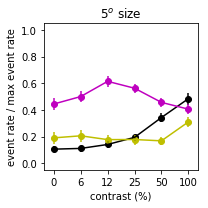

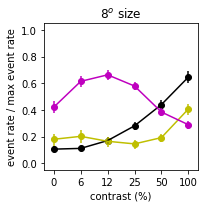

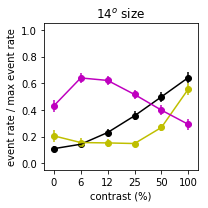

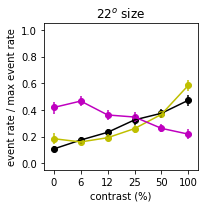

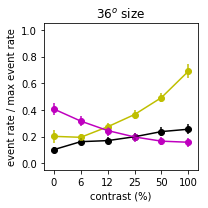

In [14]:
c = np.array((0,6,12,25,50,100))
s = np.logspace(np.log10(5),np.log10(36.5),5)
# font = {'family' : 'normal',
#         'weight' : 'normal',
#         'size'   : 36}

# matplotlib.rc('font', **font)
# plt.figure(figsize=(10,2))
# os.mkdir('log_axis_crfs')
lw = None
ms = None
for k in range(5):
#     plt.subplot(1,5,k+1)
    plt.figure(figsize=(3,3))
    ut.plot_bootstrapped_errorbars_hillel(np.arange(6),snorm_pc[0][:,k+1:k+2][:,:,np.array((1,0,1,1,1,1,1),dtype=bool)],colors='k',linewidth=lw,markersize=ms)
    ut.plot_bootstrapped_errorbars_hillel(np.arange(6),snorm_sst[0][:,k+1:k+2],colors='y',linewidth=lw,markersize=ms)
    ut.plot_bootstrapped_errorbars_hillel(np.arange(6),snorm_vip[0][:,k+1:k+2],colors='m',linewidth=lw,markersize=ms)
    plt.xticks(np.arange(6),[str(x) for x in (0,6,12,25,50,100)])
    plt.xlabel('contrast (%)')
    plt.ylabel('event rate / max event rate')
    plt.title(str(int(np.round(s[k])))+'$^o$ size')
    plt.ylim((-0.05,1.05))
    plt.tight_layout()
    plt.savefig('log_axis_crfs/'+str(k)+'.pdf')
    plt.savefig('log_axis_crfs/'+str(k)+'.png')
#     plt.savefig('190125_figs/three_cell_types_movie_c_by_s/three_cell_types_contrast_by_size_190125_running_only'+str(k)+'.tif')
    
    
# c = np.array((0,6,12,25,50,100))
# # plt.figure(figsize=(10,2))
# for k in range(5):
# #     plt.subplot(1,5,k+1)
#     plt.figure(figsize=(3,3))
#     ut.plot_bootstrapped_errorbars_hillel(s0,snorm_pc[0][:,:,k+2:k+3].transpose((0,2,1)),colors='k',linewidth=lw,markersize=ms)
#     ut.plot_bootstrapped_errorbars_hillel(s0,snorm_sst[0][:,k+1:k+2],colors='y',linewidth=lw,markersize=ms)
#     ut.plot_bootstrapped_errorbars_hillel(s0,snorm_vip[0][:,k+1:k+2],colors='m',linewidth=lw,markersize=ms)
#     plt.xlabel('size ($^o$)')
#     plt.ylabel('event rate / max event rate')
#     plt.title(str(c[k+1])+'% contrast')
#     plt.ylim((-0.05,1.05))
# #     plt.savefig('190125_figs/three_cell_types_movie_s_by_c/three_cell_types_size_by_contrast_190125_running_only'+str(k)+'.tif')
# #     plt.legend([str(int(np.round(x)))+'$^o$' for x in s])
# # plt.savefig('190125_figs/pc_contrast_by_size_190125_running_only.pdf')

# plt.figure()
# ut.plot_bootstrapped_errorbars_hillel(s0,snorm[0][:,:,2:].transpose((0,2,1)))
# plt.xlabel('size ($^o$)')
# plt.ylabel('event rate / max event rate')
# plt.ylim((-0.05,1.05))
# plt.legend([str(int(np.round(x)))+'%' for x in c[2:]])
# # plt.savefig('190125_figs/pc_size_by_contrast_190125_running_only.pdf')

In [48]:
proc[keylist[k]].keys()

dict_keys(['runtrial', 'trialrun', 'angle', 'size', 'contrast', 'trialwise', 'strialwise', 'ctrialwise', 'dfof', 'straces', 'oriavg_dfof'])

In [ ]:
# soriavg,strialavg,lb,ub,pval,nbydepth,spont,ret_vars,Smean_stat

In [50]:
pdb.pm()

> /home/mossing/anaconda3/lib/python3.6/site-packages/numpy/ma/core.py(3205)astype()
-> if self._fill_value is not None:
(Pdb) exit


In [5]:
# thisfold = '180530/M8174/'
# thisfile = 'M8174_130_003'
# datafoldbase = '/home/mossing/scratch/2Pdata/'
# traces,ctraces,straces,dfof,baseline = sca.gen_traces([datafoldbase+thisfold+'ot/'+thisfile+'_ot_000.rois'])

In [6]:
# plt.figure()
# k = 0
# plt.plot(dfof[k])
# plt.plot(ctraces[k])
# plt.plot(straces[k])

In [7]:
# 5x5: [5,9.3,17.3,32.2,60]x[0,0.1,0.22,0.46,1]
# 5x6: [5,8.2,13.5,22.2,36.5]x[0,0.06,0.12,0.25,0.5,1]
# # 3x6: [5,13.5,36.5]x[0,0.06,0.12,0.25,0.5,1]
# # 4x4: [7.5,15,30,60]
# for key in soriavg.keys():
#     print(soriavg[key].shape)

In [8]:
# sizes: 5-10, 13-18
# contrasts: ?, ?

In [5]:
(soriavg[key][:,0,-1]>spont[key]).sum()

NameError: name 'key' is not defined

NameError: name 'snorm' is not defined

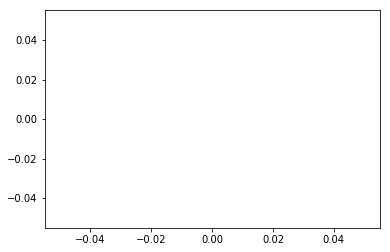

In [11]:
plt.figure()
k = 0
plt.plot(0,0,linewidth=1,c='k')
plt.plot(0,0,linewidth=3,c='k')
opt = {}
opt['linewidth'] = 1
opt['c'] = 'k'
ut.plot_errorbar_hillel(25*np.array((0,0.06,0.12,0.25,0.5,1)),snorm.mean(0)[0],lb[0],ub[0],plot_options=opt)
opt['linewidth'] = 3
opt['c'] = 'k'
ut.plot_errorbar_hillel(25*np.array((0,0.06,0.12,0.25,0.5,1)),snorm.mean(0)[3],lb[3],ub[3],plot_options=opt)
plt.legend(['5 deg','22 deg'])
plt.xlabel('contrast (%)')
plt.ylabel('norm. event rate')
# plt.title('Leftward shift in PC contrast response function with increasing size')
# plt.savefig('low_contrast_pc_crfs.pdf')

In [12]:
vals = {keylist[k]:soriavg[keylist[k]] for k in (2,)}
select = {keylist[k]:ontarget[keylist[k]] for k in (2,)}
snorm = sca.get_norm_curves(vals,select,sizes=(0,1,2,3,4),contrasts=(0,1,2,3,4,5),append_gray=True)
lbo,ubo = ut.bootstrap(snorm,np.mean,axis=0,pct=(2.5,97.5))
plt.figure()
for i in range(4):
    ut.plot_errorbar_hillel(np.array((0,7.5,15,30)),snorm.mean(0)[:-1,i],lb[:-1,i],ub[:-1,i],plot_options=opt)


TypeError: unhashable type: 'slice'

<IPython.core.display.Javascript object>


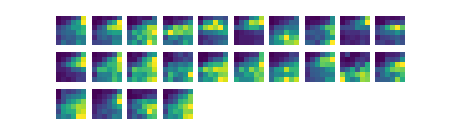

In [79]:
k = 1
ut.imshow_in_rows(soriavg[keylist[k]][ontarget[keylist[k]]])

In [14]:
s = np.logspace(np.log10(5),np.log10(60),6)
c = np.array((0,0.06,0.12,0.25,0.5,1))
cc,ss = np.meshgrid(c,s)

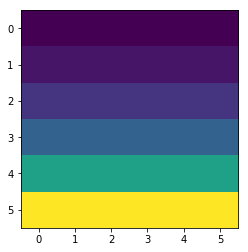

In [15]:
plt.figure()
plt.imshow(ss)

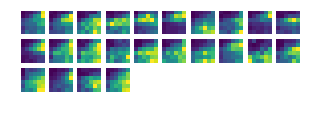

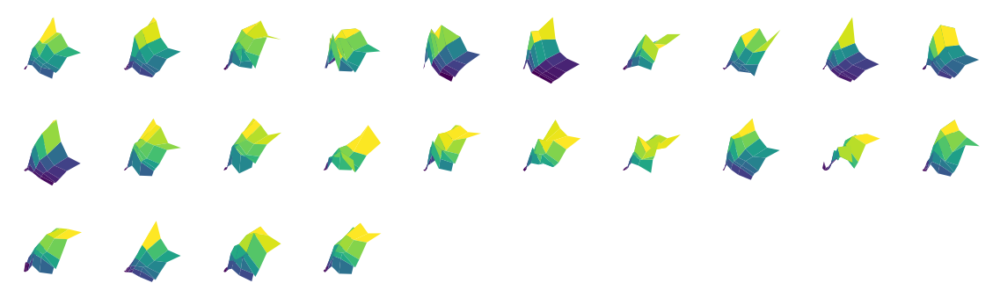

In [16]:
s = np.logspace(np.log10(5),np.log10(60),6)
c = np.array((0,0.06,0.12,0.25,0.5,1))
cc,ss = np.meshgrid(s,c,indexing='ij')

from mpl_toolkits.mplot3d import Axes3D
ut.imshow_in_rows(soriavg[keylist[k]][ontarget[keylist[k]]])
fig = plt.figure(figsize=(20,6))
k = 1
for i in range(24):
    ax = fig.add_subplot(3, 10, i+1, projection='3d')
    ax.plot_surface(cc, ss, soriavg[keylist[k]][ontarget[keylist[k]]][i],cmap=plt.cm.viridis)
    plt.axis('off')
    elev = 30
    azim = -45
    ax.view_init(elev, azim)
    plt.draw()

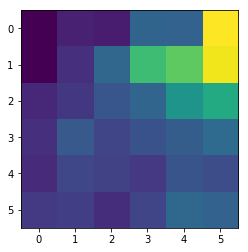

In [37]:
plt.figure()
plt.imshow(soriavg[keylist[k]][188])

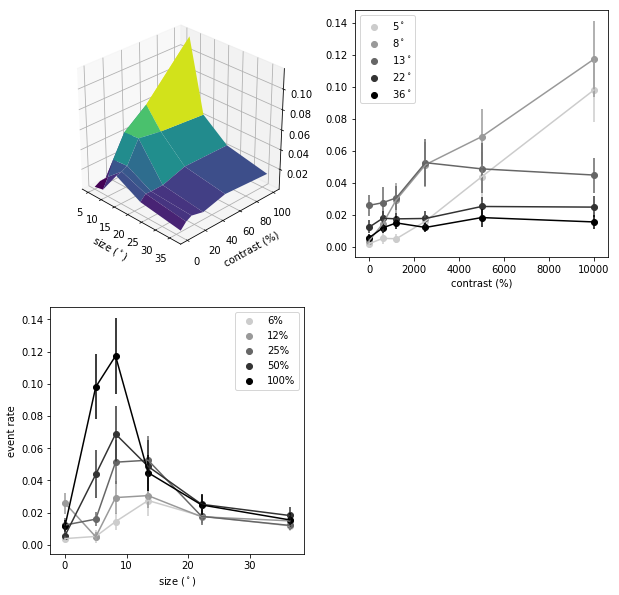

In [17]:
s = np.logspace(np.log10(5),np.log10(36.5),5)
c = 100*np.array((0,0.06,0.12,0.25,0.5,1))
cc,ss = np.meshgrid(s,c,indexing='ij')

ind = 8

from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(10,10))
k = 1
ax = fig.add_subplot(2,2,1, projection='3d')
ax.plot_surface(cc, ss, soriavg[keylist[k]][ontarget[keylist[k]]][ind][:-1],cmap=plt.cm.viridis)
# plt.axis('off')
elev = 30
azim = -45
ax.view_init(elev, azim)
plt.draw()
plt.xlabel('size ($^\circ$)')
plt.ylabel('contrast (%)')

s = np.concatenate(((0,),np.logspace(np.log10(5),np.log10(36.5),5)))
# ut.plot_errorbars(s,,lb[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,:-1].T,ub[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,:-1].T)
colors = plt.cm.gray(np.linspace(0.8,0,5))
ax = fig.add_subplot(2,2,3)
arrM = np.vstack((soriavg[keylist[k]][ontarget[keylist[k]]][ind][1:,0][np.newaxis,:],soriavg[keylist[k]][ontarget[keylist[k]]][ind][:-1,1:])).T
arrL = np.vstack((lb[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[1:,0][np.newaxis,:],lb[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,1:])).T
arrU = np.vstack((ub[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[1:,0][np.newaxis,:],ub[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,1:])).T
ut.plot_errorbars_hillel(s,arrM,arrL,arrU,colors=colors)
plt.xlabel('size ($^\circ$)')
plt.legend(['6%','12%','25%','50%','100%'])
plt.ylabel('event rate')
ax = fig.add_subplot(2,2,2)
arrM = soriavg[keylist[k]][ontarget[keylist[k]]][ind][:-1]
arrL = lb[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1]
arrU = ub[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1]
ut.plot_errorbars_hillel(100*c,arrM,arrL,arrU,colors=colors)
plt.xlabel('contrast (%)')
plt.legend(['5$^\circ$','8$^\circ$','13$^\circ$','22$^\circ$','36$^\circ$'])
# plt.savefig('surf_plot_with_projections.pdf')

In [18]:
soriavg[keylist[k]][ontarget[keylist[k]]][ind][:-1,0][np.newaxis,:].shape
soriavg[keylist[k]][ontarget[keylist[k]]][ind][:-1,1:].shape
lb[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,0][np.newaxis,:].shape
lb[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,1:].shape

(5, 5)

In [19]:
reload(ut)

<module 'pyute' from '/home/mossing/Documents/code/adesnal/pyute.py'>

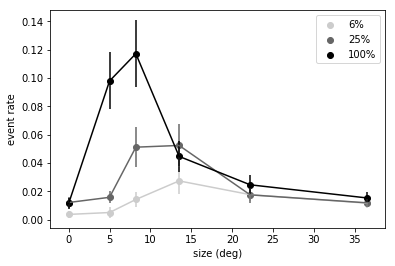

In [20]:
plt.figure() #figsize=(12,4))
# plt.subplot(1,3,1)
k = 1
ind = 8
# s = np.array((7.5,15,30,60))
s = np.concatenate(((0,),np.logspace(np.log10(5),np.log10(36.5),5)))
arrM = np.vstack((soriavg[keylist[k]][ontarget[keylist[k]]][ind][1:,0][np.newaxis,:],soriavg[keylist[k]][ontarget[keylist[k]]][ind][:-1,1:])).T
arrL = np.vstack((lb[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[1:,0][np.newaxis,:],lb[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,1:])).T
arrU = np.vstack((ub[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[1:,0][np.newaxis,:],ub[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,1:])).T
# ut.plot_errorbars(s,,lb[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,:-1].T,ub[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,:-1].T)
colors = plt.cm.gray(np.linspace(0.8,0,5))
ut.plot_errorbars_hillel(s,arrM[::2],arrL[::2],arrU[::2],colors=colors[::2])
plt.xlabel('size (deg)')
plt.ylabel('event rate')
plt.legend(['6%','25%','100%'])
# plt.savefig('pc_size_contrast_ex1_3lines_with_dots.pdf')

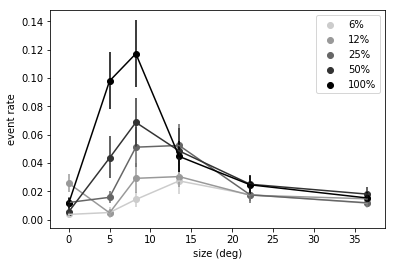

In [23]:
plt.figure() #figsize=(12,4))
# plt.subplot(1,3,1)
k = 1
ind = 8
# s = np.array((7.5,15,30,60))
s = np.concatenate(((0,),np.logspace(np.log10(5),np.log10(36.5),5)))
arrM = np.vstack((soriavg[keylist[k]][ontarget[keylist[k]]][ind][1:,0][np.newaxis,:],soriavg[keylist[k]][ontarget[keylist[k]]][ind][:-1,1:])).T
arrL = np.vstack((lb[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[1:,0][np.newaxis,:],lb[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,1:])).T
arrU = np.vstack((ub[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[1:,0][np.newaxis,:],ub[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,1:])).T
# ut.plot_errorbars(s,,lb[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,:-1].T,ub[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,:-1].T)
colors = plt.cm.gray(np.linspace(0.8,0,5))
ut.plot_errorbars_hillel(s,arrM,arrL,arrU,colors=colors)
plt.xlabel('size (deg)')
plt.ylabel('event rate')
plt.legend(['6%','12%','25%','50%','100%'])
# plt.savefig('pc_size_contrast_ex1_5lines_with_dots.pdf')

In [45]:
np.where(ontarget[keylist[k]])[0][21]

487

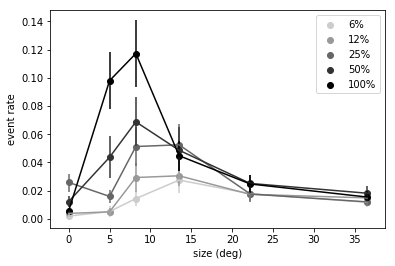

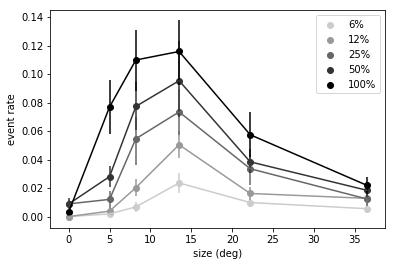

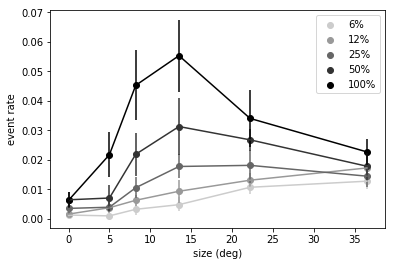

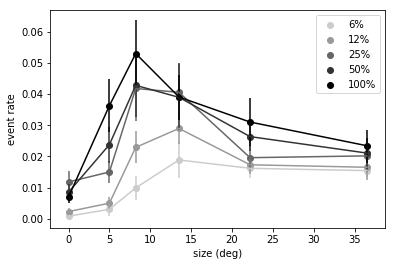

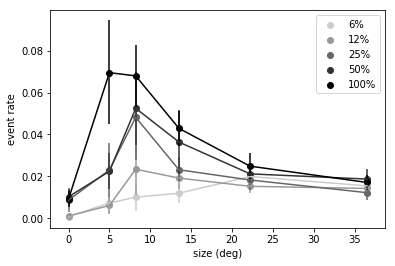

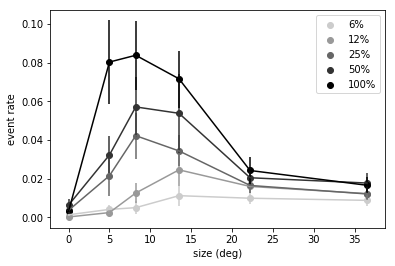

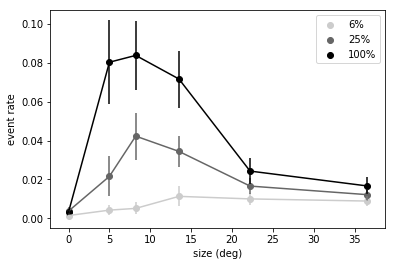

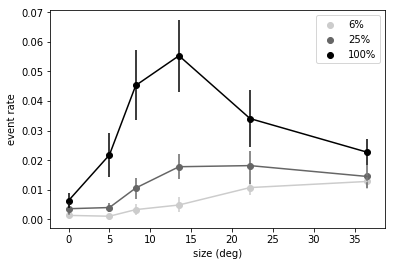

In [46]:
plt.figure() #figsize=(12,4))
# plt.subplot(1,3,1)
k = 1
ind = 8
# s = np.array((7.5,15,30,60))
s = np.concatenate(((0,),np.logspace(np.log10(5),np.log10(36.5),5)))
arrM = np.vstack((soriavg[keylist[k]][ontarget[keylist[k]]][ind][:-1,0][np.newaxis,:],soriavg[keylist[k]][ontarget[keylist[k]]][ind][:-1,1:])).T
arrL = np.vstack((lb[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,0][np.newaxis,:],lb[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,1:])).T
arrU = np.vstack((ub[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,0][np.newaxis,:],ub[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,1:])).T
# ut.plot_errorbars(s,,lb[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,:-1].T,ub[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,:-1].T)
colors = plt.cm.gray(np.linspace(0.8,0,5))
ut.plot_errorbars_hillel(s,arrM,arrL,arrU,colors=colors)
plt.xlabel('size (deg)')
plt.ylabel('event rate')
plt.legend(['6%','12%','25%','50%','100%'])
plt.savefig('pc_size_contrast_ex1.pdf')

# plt.subplot(1,3,2)
plt.figure()
k = 1
ind = 10
# s = np.array((7.5,15,30,60))
s = np.concatenate(((0,),np.logspace(np.log10(5),np.log10(36.5),5)))
arrM = np.vstack((soriavg[keylist[k]][ontarget[keylist[k]]][ind][:-1,0][np.newaxis,:],soriavg[keylist[k]][ontarget[keylist[k]]][ind][:-1,1:])).T
arrL = np.vstack((lb[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,0][np.newaxis,:],lb[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,1:])).T
arrU = np.vstack((ub[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,0][np.newaxis,:],ub[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,1:])).T
# ut.plot_errorbars(s,,lb[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,:-1].T,ub[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,:-1].T)
colors = plt.cm.gray(np.linspace(0.8,0,5))
ut.plot_errorbars_hillel(s,arrM,arrL,arrU,colors=colors)
plt.xlabel('size (deg)')
plt.ylabel('event rate')
plt.legend(['6%','12%','25%','50%','100%'])
plt.savefig('pc_size_contrast_ex2.pdf')

# plt.subplot(1,3,3)
plt.figure()
k = 1
ind = 21
# s = np.array((7.5,15,30,60))
s = np.concatenate(((0,),np.logspace(np.log10(5),np.log10(36.5),5)))
arrM = np.vstack((soriavg[keylist[k]][ontarget[keylist[k]]][ind][:-1,0][np.newaxis,:],soriavg[keylist[k]][ontarget[keylist[k]]][ind][:-1,1:])).T
arrL = np.vstack((lb[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,0][np.newaxis,:],lb[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,1:])).T
arrU = np.vstack((ub[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,0][np.newaxis,:],ub[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,1:])).T
# ut.plot_errorbars(s,,lb[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,:-1].T,ub[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,:-1].T)
colors = plt.cm.gray(np.linspace(0.8,0,5))
ut.plot_errorbars_hillel(s,arrM,arrL,arrU,colors=colors)
plt.xlabel('size (deg)')
plt.ylabel('event rate')
plt.legend(['6%','12%','25%','50%','100%'])
plt.savefig('pc_size_contrast_ex3.pdf')

plt.figure()
k = 1
ind = 17
# s = np.array((7.5,15,30,60))
s = np.concatenate(((0,),np.logspace(np.log10(5),np.log10(36.5),5)))
arrM = np.vstack((soriavg[keylist[k]][ontarget[keylist[k]]][ind][:-1,0][np.newaxis,:],soriavg[keylist[k]][ontarget[keylist[k]]][ind][:-1,1:])).T
arrL = np.vstack((lb[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,0][np.newaxis,:],lb[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,1:])).T
arrU = np.vstack((ub[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,0][np.newaxis,:],ub[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,1:])).T
# ut.plot_errorbars(s,,lb[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,:-1].T,ub[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,:-1].T)
colors = plt.cm.gray(np.linspace(0.8,0,5))
ut.plot_errorbars_hillel(s,arrM,arrL,arrU,colors=colors)
plt.xlabel('size (deg)')
plt.ylabel('event rate')
plt.legend(['6%','12%','25%','50%','100%'])
plt.savefig('pc_size_contrast_ex4.pdf')

plt.figure()
k = 1
ind = 188
# s = np.array((7.5,15,30,60))
s = np.concatenate(((0,),np.logspace(np.log10(5),np.log10(36.5),5)))
arrM = np.vstack((soriavg[keylist[k]][ind][:-1,0][np.newaxis,:],soriavg[keylist[k]][ind][:-1,1:])).T
arrL = np.vstack((lb[keylist[k]][ind].mean(0)[:-1,0][np.newaxis,:],lb[keylist[k]][ind].mean(0)[:-1,1:])).T
arrU = np.vstack((ub[keylist[k]][ind].mean(0)[:-1,0][np.newaxis,:],ub[keylist[k]][ind].mean(0)[:-1,1:])).T
# ut.plot_errorbars(s,,lb[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,:-1].T,ub[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,:-1].T)
colors = plt.cm.gray(np.linspace(0.8,0,5))
ut.plot_errorbars_hillel(s,arrM,arrL,arrU,colors=colors)
plt.xlabel('size (deg)')
plt.ylabel('event rate')
plt.legend(['6%','12%','25%','50%','100%'])
plt.savefig('pc_size_contrast_ex5.pdf')

plt.figure()
k = 1
ind = 461
# s = np.array((7.5,15,30,60))
s = np.concatenate(((0,),np.logspace(np.log10(5),np.log10(36.5),5)))
arrM = np.vstack((soriavg[keylist[k]][ind][:-1,0][np.newaxis,:],soriavg[keylist[k]][ind][:-1,1:])).T
arrL = np.vstack((lb[keylist[k]][ind].mean(0)[:-1,0][np.newaxis,:],lb[keylist[k]][ind].mean(0)[:-1,1:])).T
arrU = np.vstack((ub[keylist[k]][ind].mean(0)[:-1,0][np.newaxis,:],ub[keylist[k]][ind].mean(0)[:-1,1:])).T
# ut.plot_errorbars(s,,lb[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,:-1].T,ub[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,:-1].T)
colors = plt.cm.gray(np.linspace(0.8,0,5))
ut.plot_errorbars_hillel(s,arrM,arrL,arrU,colors=colors)
plt.xlabel('size (deg)')
plt.ylabel('event rate')
plt.legend(['6%','12%','25%','50%','100%'])
plt.savefig('pc_size_contrast_ex6.pdf')

plt.figure()
k = 1
ind = 461
# s = np.array((7.5,15,30,60))
s = np.concatenate(((0,),np.logspace(np.log10(5),np.log10(36.5),5)))
arrM = np.vstack((soriavg[keylist[k]][ind][:-1:2,0][np.newaxis,:],soriavg[keylist[k]][ind][:-1,1::2])).T
arrL = np.vstack((lb[keylist[k]][ind].mean(0)[:-1:2,0][np.newaxis,:],lb[keylist[k]][ind].mean(0)[:-1,1::2])).T
arrU = np.vstack((ub[keylist[k]][ind].mean(0)[:-1:2,0][np.newaxis,:],ub[keylist[k]][ind].mean(0)[:-1,1::2])).T
# ut.plot_errorbars(s,,lb[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,:-1].T,ub[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,:-1].T)
colors = plt.cm.gray(np.linspace(0.8,0,3))
ut.plot_errorbars_hillel(s,arrM,arrL,arrU,colors=colors)
plt.xlabel('size (deg)')
plt.ylabel('event rate')
plt.legend(['6%','25%','100%'])
plt.savefig('pc_size_contrast_ex6_3lines.pdf')

plt.figure()
k = 1
ind = 487
# s = np.array((7.5,15,30,60))
s = np.concatenate(((0,),np.logspace(np.log10(5),np.log10(36.5),5)))
arrM = np.vstack((soriavg[keylist[k]][ind][:-1:2,0][np.newaxis,:],soriavg[keylist[k]][ind][:-1,1::2])).T
arrL = np.vstack((lb[keylist[k]][ind].mean(0)[:-1:2,0][np.newaxis,:],lb[keylist[k]][ind].mean(0)[:-1,1::2])).T
arrU = np.vstack((ub[keylist[k]][ind].mean(0)[:-1:2,0][np.newaxis,:],ub[keylist[k]][ind].mean(0)[:-1,1::2])).T
# ut.plot_errorbars(s,,lb[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,:-1].T,ub[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,:-1].T)
colors = plt.cm.gray(np.linspace(0.8,0,3))
ut.plot_errorbars_hillel(s,arrM,arrL,arrU,colors=colors)
plt.xlabel('size (deg)')
plt.ylabel('event rate')
plt.legend(['6%','25%','100%'])
plt.savefig('pc_size_contrast_ex3_3lines.pdf')

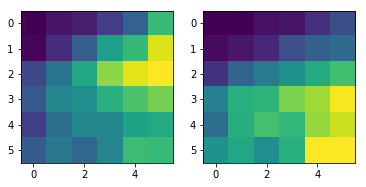

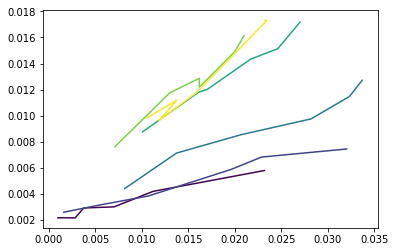

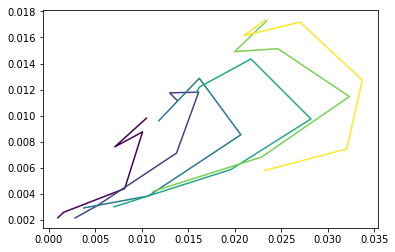

In [51]:
plt.figure()
plt.subplot(1,2,1)
arr1 = soriavg[keylist[k]][ontarget[keylist[k]]].mean(0)
plt.imshow(arr1)
plt.subplot(1,2,2)
arr2 = soriavg[keylist[k]][np.logical_not(ontarget[keylist[k]])].mean(0)
plt.imshow(arr2)

plt.figure()
colors = plt.cm.viridis(np.linspace(0,1,6))
for i in range(6):
    plt.plot(arr1[i],arr2[i],c=colors[i])
    
plt.figure()
colors = plt.cm.viridis(np.linspace(0,1,6))
for i in range(6):
    plt.plot(arr1[:,i],arr2[:,i],c=colors[i])

In [65]:
k = 1
nc = 3
data = soriavg[keylist[k]].reshape((soriavg[keylist[k]].shape[0],-1))
kmeans = sklearn.cluster.KMeans(n_clusters=nc, random_state=0).fit(data)

<IPython.core.display.Javascript object>


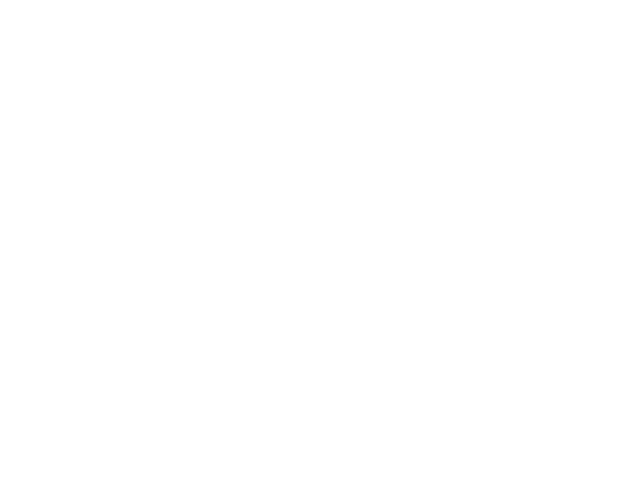

In [67]:
plt.figure()
for i in range(nc):
    plt.subplot(1,nc,i+1)
    plt.imshow(kmeans.cluster_centers_[i].reshape((6,6)))

<IPython.core.display.Javascript object>


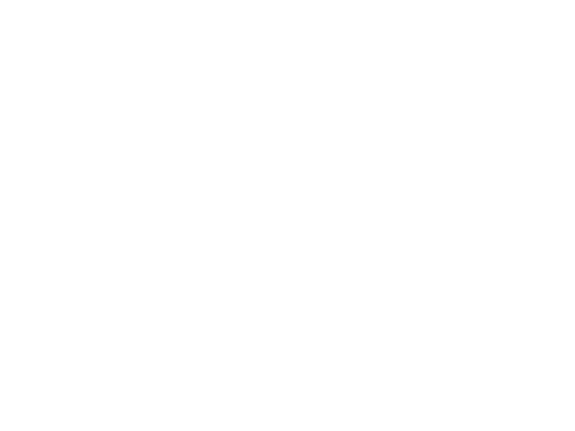

IndexError: boolean index did not match indexed array along dimension 0; dimension is 1116 but corresponding boolean dimension is 661

In [77]:
plt.figure()
plt.subplot(1,2,1)
arr1 = soriavg[keylist[k]][kmeans.labels_==2].mean(0)
plt.imshow(arr1)
plt.subplot(1,2,2)
arr2 = soriavg[keylist[k]][kmeans.labels_!=2].mean(0)
plt.imshow(arr2)

plt.figure()
colors = plt.cm.viridis(np.linspace(0,1,6))
for i in range(6):
    plt.plot(arr1[i],arr2[i],c=colors[i])
    
plt.figure()
colors = plt.cm.viridis(np.linspace(0,1,6))
for i in range(6):
    plt.plot(arr1[:,i],arr2[:,i],c=colors[i])

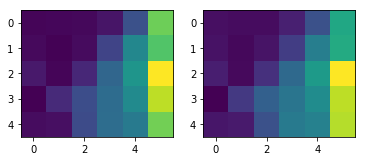

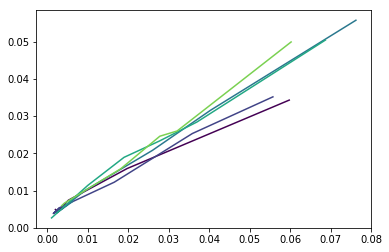

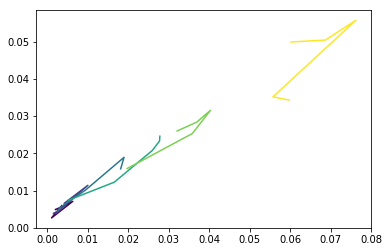

In [53]:
k = 0

plt.figure()
plt.subplot(1,2,1)
arr1 = soriavg[keylist[k]][ontarget[keylist[k]]].mean(0)
plt.imshow(arr1)
plt.subplot(1,2,2)
arr2 = soriavg[keylist[k]][np.logical_not(ontarget[keylist[k]])].mean(0)
plt.imshow(arr2)

plt.figure()
colors = plt.cm.viridis(np.linspace(0,1,6))
for i in range(arr1.shape[0]):
    plt.plot(arr1[i],arr2[i],c=colors[i])
    
plt.figure()
colors = plt.cm.viridis(np.linspace(0,1,6))
for i in range(arr1.shape[1]):
    plt.plot(arr1[:,i],arr2[:,i],c=colors[i])

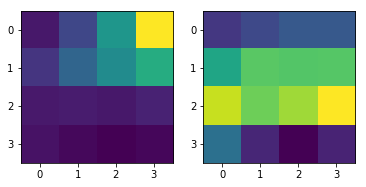

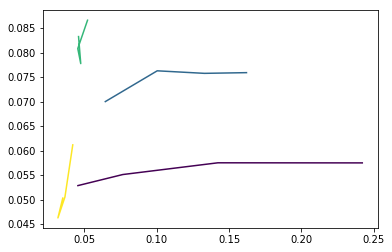

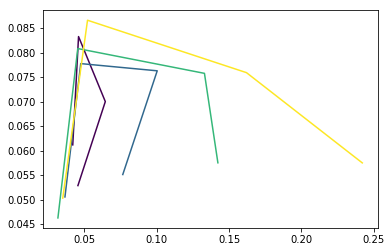

In [55]:
k = 2

plt.figure()
plt.subplot(1,2,1)
arr1 = soriavg[keylist[k]][ontarget[keylist[k]]].mean(0)
plt.imshow(arr1)
plt.subplot(1,2,2)
arr2 = soriavg[keylist[k]][np.logical_not(ontarget[keylist[k]])].mean(0)
plt.imshow(arr2)

plt.figure()
colors = plt.cm.viridis(np.linspace(0,1,4))
for i in range(arr1.shape[0]):
    plt.plot(arr1[i],arr2[i],c=colors[i])
    
plt.figure()
colors = plt.cm.viridis(np.linspace(0,1,4))
for i in range(arr1.shape[1]):
    plt.plot(arr1[:,i],arr2[:,i],c=colors[i])

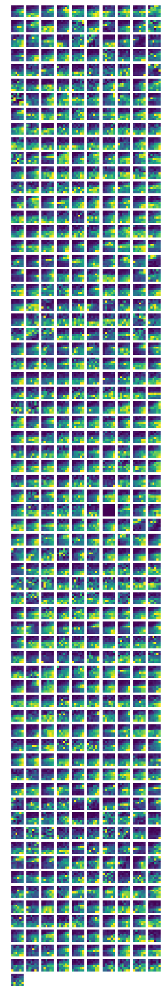

In [36]:
ut.imshow_in_rows(soriavg[keylist[k]])

In [102]:
def align_to_max(arr,arr0):
    arrc = np.zeros_like(arr[:,0,:])
    for i in range(arr.shape[0]):
        amy = np.argmax(arr[i].mean(-1))
        amx = np.argmax(arr0[i,amy])
        arrc[i] = np.roll(arr[i,amy],-amx)
    return arrc
def compute_sangle(thisproc,thislkat,slc=slice(-2,None)):
    strialwise = thisproc['strialwise'][thislkat]
    angle = thisproc['angle']
    size = thisproc['size']
    contrast = thisproc['contrast']
    trialrun = thisproc['trialrun']
    uangle = np.unique(angle)
    usize = np.unique(size)
    ucontrast = np.unique(contrast)
    sangle = np.zeros((thislkat.sum(),usize.size,uangle.size))
    sangle0 = np.zeros((thislkat.sum(),usize.size,uangle.size))
    for i in range(sangle.shape[1]):
        for j in range(sangle.shape[2]):
            thiscond = np.logical_and(trialrun,np.logical_and(np.in1d(contrast,ucontrast[slc]),np.logical_and(angle==uangle[j],size==usize[i])))
            sangle0[:,i,j] = strialwise[:,thiscond,4:-4][:,:1].mean(-1).mean(-1)
            sangle[:,i,j] = strialwise[:,thiscond,4:-4][:,1:].mean(-1).mean(-1)
    return sangle,sangle0

(-0.0086608312088557529,
 0.12347274537058789,
 -0.0097636943887951765,
 0.12223147787491759)

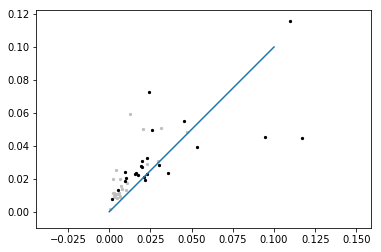

In [92]:
k = 1
arrM = soriavg[keylist[k]][ontarget[keylist[k]]]
arrM.shape
plt.figure()
plt.scatter(arrM[:,1,2],arrM[:,2,2],c=np.array((1,1,1))*0.75,s=5)
plt.scatter(arrM[:,1,-1],arrM[:,2,-1],c=np.array((1,1,1))*0,s=5)
plt.plot((0,0.1),(0,0.1))
plt.axis('equal')

(-0.050000000000000003, 1.05, -0.050000000000000003, 1.05)

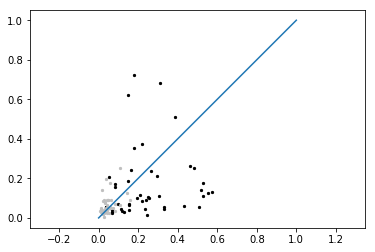

In [99]:
k = 2
arrM = soriavg[keylist[k]][ontarget[keylist[k]]]
arrM.shape
plt.figure()
plt.scatter(arrM[:,0,-1],arrM[:,1,-1],c=np.array((1,1,1))*0,s=5)
plt.scatter(arrM[:,0,0],arrM[:,1,0],c=np.array((1,1,1))*0.75,s=5)

plt.plot((0,1),(0,1))
plt.axis('equal')

(-0.052798791252390176,
 1.0501332757739235,
 -0.053736220331696123,
 1.0501779152538904)

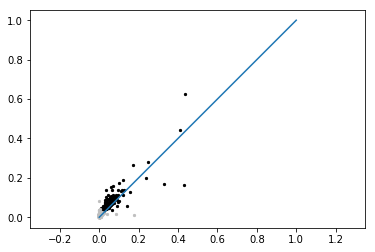

In [101]:
k = 0
arrM = soriavg[keylist[k]][ontarget[keylist[k]]]
arrM.shape
plt.figure()
plt.scatter(arrM[:,1,-1],arrM[:,2,-1],c=np.array((1,1,1))*0,s=5)
plt.scatter(arrM[:,1,2],arrM[:,2,2],c=np.array((1,1,1))*0.75,s=5)
plt.plot((0,1),(0,1))
plt.axis('equal')

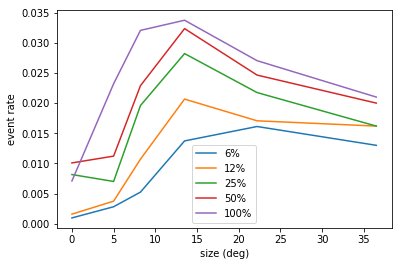

In [75]:
plt.figure() #figsize=(12,4))
# plt.subplot(1,3,1)
k = 1
ind = 8
# s = np.array((7.5,15,30,60))
s = np.concatenate(((0,),np.logspace(np.log10(5),np.log10(36.5),5)))
arrM = np.vstack((soriavg[keylist[k]][ontarget[keylist[k]]].mean(0)[:-1,0][np.newaxis,:],soriavg[keylist[k]][ontarget[keylist[k]]].mean(0)[:-1,1:])).T
# arrL = np.vstack((lb[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,0][np.newaxis,:],lb[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,1:])).T
# arrU = np.vstack((ub[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,0][np.newaxis,:],ub[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,1:])).T
# ut.plot_errorbars(s,,lb[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,:-1].T,ub[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1,:-1].T)
colors = plt.cm.gray(np.linspace(0.8,0,5))
plt.plot(s,arrM.T) #,arrL,arrU,colors=colors)
plt.xlabel('size (deg)')
plt.ylabel('event rate')
plt.legend(['6%','12%','25%','50%','100%'])

In [ ]:
reload(sca)
sanglemax = {}
lkatd = {}
for k in ((1,2)):
    lkatd[keylist[k]] = ontarget[keylist[k]]
def align_to_max(arr,arr0):
    arrc = np.zeros_like(arr[:,0,:])
    for i in range(arr.shape[0]):
        amy = np.argmax(arr[i].mean(-1))
        amx = np.argmax(arr0[i,amy])
        arrc[i] = np.roll(arr[i,amy],-amx)
    return arrc
def compute_sangle(thisproc,thislkat,slc=slice(-2,None)):
    strialwise = thisproc['strialwise'][thislkat]
    angle = thisproc['angle']
    size = thisproc['size']
    contrast = thisproc['contrast']
    trialrun = thisproc['trialrun']
    uangle = np.unique(angle)
    usize = np.unique(size)
    ucontrast = np.unique(contrast)
    sangle = np.zeros((thislkat.sum(),usize.size,uangle.size))
    sangle0 = np.zeros((thislkat.sum(),usize.size,uangle.size))
    for i in range(sangle.shape[1]):
        for j in range(sangle.shape[2]):
            thiscond = np.logical_and(trialrun,np.logical_and(np.in1d(contrast,ucontrast[slc]),np.logical_and(angle==uangle[j],size==usize[i])))
            sangle0[:,i,j] = strialwise[:,thiscond,4:-4][:,:1].mean(-1).mean(-1)
            sangle[:,i,j] = strialwise[:,thiscond,4:-4][:,1:].mean(-1).mean(-1)
    return sangle,sangle0

plt.figure()

plt.plot(0,0,c='k')
plt.plot(0,0,c=np.array((1,1,1))*0.6)

for k in (1,2):
    sangle,sangle0 = compute_sangle(proc[keylist[k]],lkatd[keylist[k]],slc=slice(-2,None))
    sanglemax[keylist[k]] = align_to_max(sangle,sangle0)-spont[keylist[k]][lkatd[keylist[k]]][:,np.newaxis]
snorm = np.vstack([val for val in sanglemax.values()])
snorm = np.roll(snorm,2,axis=1)
snorm = np.hstack((snorm,snorm[:,0:1]))/(snorm.max(1)[:,np.newaxis])
lb,ub = ut.bootstrap(snorm,np.nanmean,axis=0,pct=(2.5,97.5))
ut.plot_errorbar_hillel(45*np.arange(9),np.nanmean(snorm,0),lb,ub,c='k')
plt.ylim((0,1))

for k in (1,2):
    sangle,sangle0 = compute_sangle(proc[keylist[k]],lkatd[keylist[k]],slc=slice(1,4))
    sanglemax[keylist[k]] = align_to_max(sangle,sangle0)-spont[keylist[k]][lkatd[keylist[k]]][:,np.newaxis]
snorm = np.vstack([val for val in sanglemax.values()])
snorm = np.roll(snorm,2,axis=1)
snorm = np.hstack((snorm,snorm[:,0:1]))/(snorm.max(1)[:,np.newaxis])
lb,ub = ut.bootstrap(snorm,np.nanmean,axis=0,pct=(2.5,97.5))
ut.plot_errorbar_hillel(45*np.arange(9),np.nanmean(snorm,0),lb,ub,c=0.6*np.array((1,1,1)))
plt.ylim((0,1))
plt.legend(['PC high contrast','PC low contrast'])

plt.ylabel('norm. evoked event rate')
plt.xlabel('direction (deg.)')

# plt.savefig('pc_ori_tuning.pdf')
# plt.savefig('pc_ori_tuning.eps')

In [ ]:
plt.figure()
k = 1
ind = 8
lkat = np.array(())
# s = np.array((7.5,15,30,60))
s = np.logspace(np.log10(5),np.log10(36.5),5)
ut.plot_errorbars(s,soriavg[keylist[k]][ontarget[keylist[k]]][ind][:-1].T,lb[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1].T,ub[keylist[k]][ontarget[keylist[k]]][ind].mean(0)[:-1].T)
plt.xlabel('size (deg)')
plt.ylabel('event rate')

In [43]:
lb[keylist[k]][ontarget[keylist[k]]].shape

(24, 4, 6, 6)

In [39]:
lb

array([[ 0.18673477,  0.18673477,  0.18673477,  0.18673477],
       [ 0.15681889,  0.24776637,  0.45487685,  0.75215167],
       [ 0.22109521,  0.32004593,  0.4045363 ,  0.43767239],
       [ 0.17083227,  0.17105103,  0.14959885,  0.16861253],
       [ 0.15460406,  0.11790416,  0.10170845,  0.11886848]])

<IPython.core.display.Javascript object>


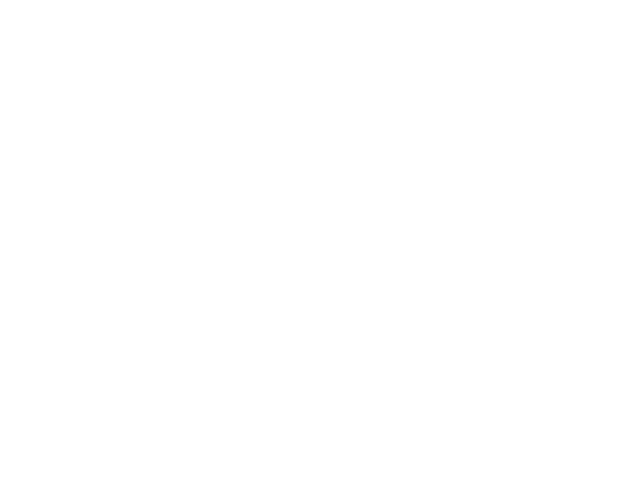

In [42]:
vals = {keylist[k]:soriavg[keylist[k]] for k in (2,)}
select = {keylist[k]:ontarget[keylist[k]] for k in (2,)}
snorm = sca.get_norm_curves(vals,select,sizes=(0,1,2,3,4),contrasts=(0,1,2,3,4,5),append_gray=True)
lb,ub = ut.bootstrap(snorm,np.mean,axis=0,pct=(2.5,97.5))
plt.figure()
for i in range(4):
    ut.plot_errorbar_hillel(np.array((0,7.5,15,30,60)),snorm.mean(0)[:,i],lb[:,i],ub[:,i],plot_options=opt)


<IPython.core.display.Javascript object>


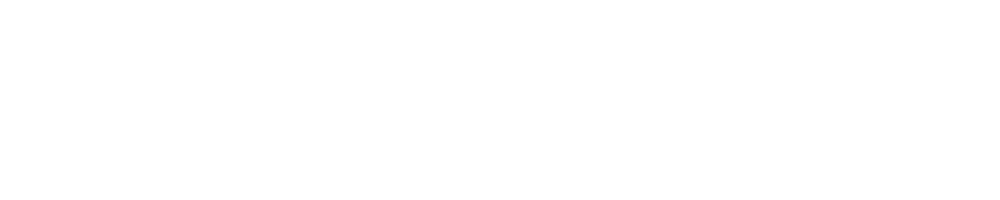

In [10]:
k = 2
plt.figure(figsize=(15,3))
ucontrast = np.unique(proc[keylist[k]]['contrast'])
usize = np.unique(proc[keylist[k]]['size'])
for i,size in enumerate(usize):
    plt.subplot(1,len(usize),i+1)
    for contrast in ucontrast:
        lkat = np.logical_and(np.logical_and(proc[keylist[k]]['contrast']==contrast,proc[keylist[k]]['size']==size),proc[keylist[k]]['runtrial'])
        f = proc[keylist[k]]['trialwise'][:,lkat].mean(0).mean(0)
        plt.plot(f-f[4])
    plt.ylim(-50,400)

<IPython.core.display.Javascript object>


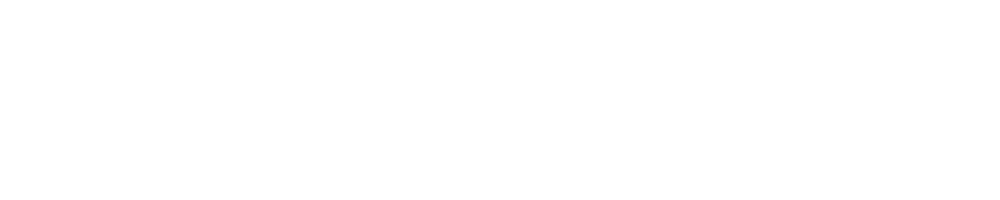

In [11]:
k = 2
plt.figure(figsize=(15,3))
ucontrast = np.unique(proc[keylist[k]]['contrast'])
usize = np.unique(proc[keylist[k]]['size'])
for i,size in enumerate(usize):
    plt.subplot(1,len(usize),i+1)
    for contrast in ucontrast:
        lkat = np.logical_and(np.logical_and(proc[keylist[k]]['contrast']==contrast,proc[keylist[k]]['size']==size),proc[keylist[k]]['runtrial'])
        f = proc[keylist[k]]['strialwise'][:,lkat].mean(0).mean(0)
        plt.plot(f)
    plt.ylim(0,0.15)

<IPython.core.display.Javascript object>


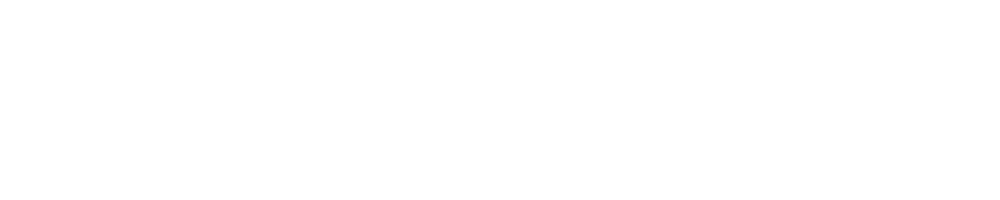

In [12]:
plt.figure(figsize=(15,3))
k = 0
ucontrast = np.unique(proc[keylist[k]]['contrast'])
usize = np.unique(proc[keylist[k]]['size'])
for i,size in enumerate(usize):
    plt.subplot(1,len(usize),i+1)
    for contrast in ucontrast:
        lkat = np.logical_and(np.logical_and(proc[keylist[k]]['contrast']==contrast,proc[keylist[k]]['size']==size),proc[keylist[k]]['runtrial'])
        f = proc[keylist[k]]['trialwise'][:,lkat].mean(0).mean(0)
        plt.plot(f-f[4])
    plt.ylim(-50,200)

<IPython.core.display.Javascript object>


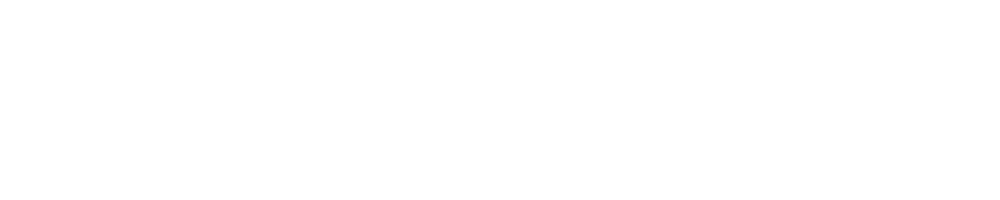

In [13]:
plt.figure(figsize=(15,3))
k = 0
ucontrast = np.unique(proc[keylist[k]]['contrast'])
usize = np.unique(proc[keylist[k]]['size'])
for i,size in enumerate(usize):
    plt.subplot(1,5,i+1)
    for contrast in ucontrast:
        lkat = np.logical_and(np.logical_and(proc[keylist[k]]['contrast']==contrast,proc[keylist[k]]['size']==size),1-proc[keylist[k]]['runtrial'])
        plt.plot(proc[keylist[k]]['strialwise'][:,lkat].mean(0).mean(0),c='b',alpha=contrast)
    for contrast in ucontrast:
        lkat = np.logical_and(np.logical_and(proc[keylist[k]]['contrast']==contrast,proc[keylist[k]]['size']==size),proc[keylist[k]]['runtrial'])
        plt.plot(proc[keylist[k]]['strialwise'][:,lkat].mean(0).mean(0),c='y',alpha=contrast)
    plt.ylim(0,0.1)
#     plt.ylim(600,800)

<IPython.core.display.Javascript object>


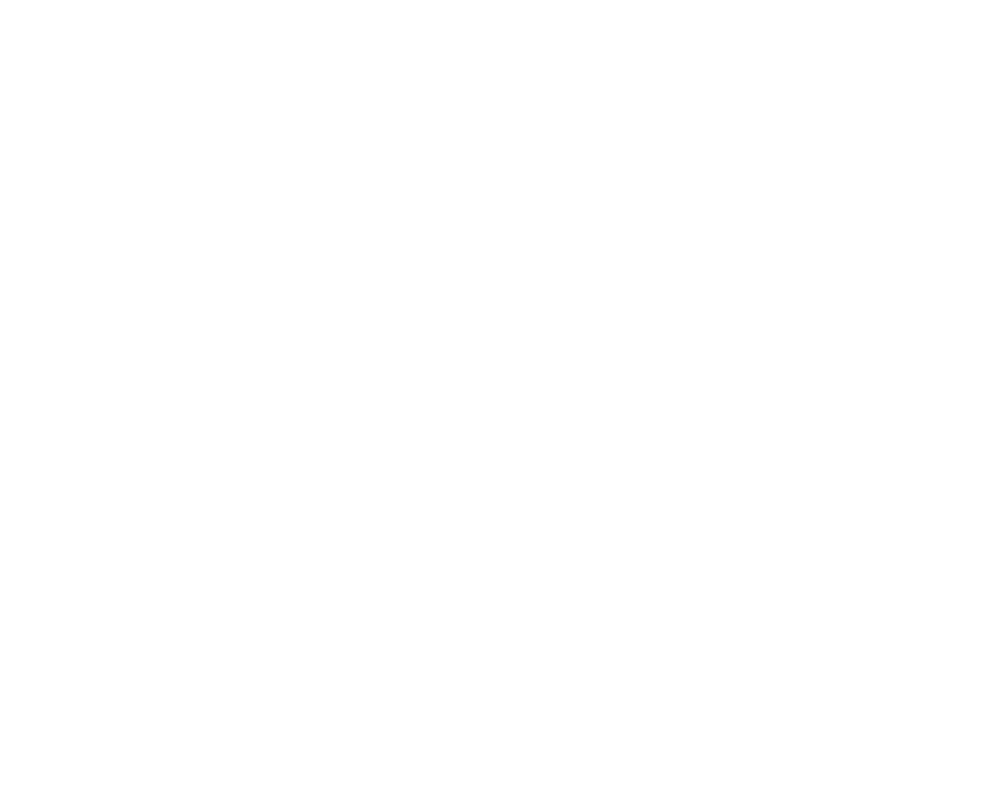

/home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


In [14]:
plt.figure(figsize=(15,12))
k = 0
ucontrast = np.unique(proc[keylist[k]]['contrast'])
usize = np.unique(proc[keylist[k]]['size'])
ncontrast = len(ucontrast)
nsize = len(usize)
gd = ontarget[keylist[k]]
r_run = np.zeros((nsize,ncontrast))
r_stat = np.zeros((nsize,ncontrast))
re_run = np.zeros((nsize,ncontrast))
re_stat = np.zeros((nsize,ncontrast))
for i,size in enumerate(usize):
    for j,contrast in enumerate(ucontrast):
        plt.subplot(nsize,ncontrast,i*ncontrast+j+1)
        lkat = np.logical_and(np.logical_and(proc[keylist[k]]['contrast']==contrast,proc[keylist[k]]['size']==size),1-proc[keylist[k]]['runtrial'])
        plt.plot(proc[keylist[k]]['strialwise'][gd][:,lkat].mean(0).mean(0),c='b')
        re_stat[i,j] = proc[keylist[k]]['strialwise'][gd][:,lkat].mean(0).mean(0)[4:6].mean()
        r_stat[i,j] = proc[keylist[k]]['strialwise'][gd][:,lkat].mean(0).mean(0)[6:].mean()
        plt.ylim(0,0.1)
    for j,contrast in enumerate(ucontrast):
        plt.subplot(nsize,ncontrast,i*ncontrast+j+1)
        lkat = np.logical_and(np.logical_and(proc[keylist[k]]['contrast']==contrast,proc[keylist[k]]['size']==size),proc[keylist[k]]['runtrial'])
        plt.plot(proc[keylist[k]]['strialwise'][gd][:,lkat].mean(0).mean(0),c='y')
        re_run[i,j] = proc[keylist[k]]['strialwise'][gd][:,lkat].mean(0).mean(0)[4:6].mean()
        r_run[i,j] = proc[keylist[k]]['strialwise'][gd][:,lkat].mean(0).mean(0)[6:].mean()
        plt.ylim(0,0.1)

<IPython.core.display.Javascript object>


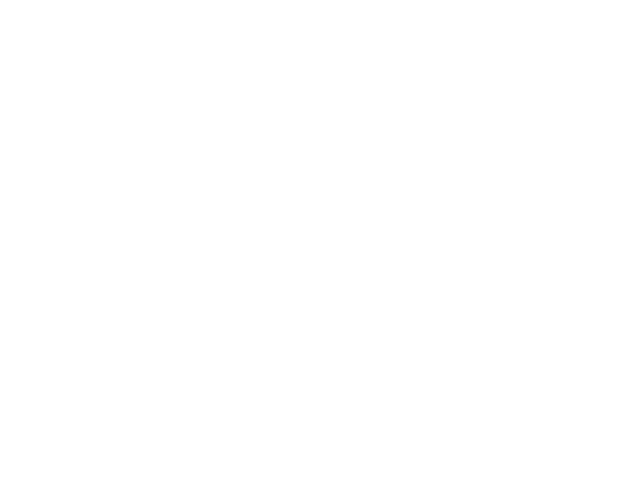

In [15]:
mn = np.minimum(np.minimum(np.minimum(r_run,r_stat),re_run),re_stat).min()
mx = np.maximum(np.maximum(np.maximum(r_run,r_stat),re_run),re_stat).max()

plt.figure()
plt.subplot(1,4,1)
plt.imshow(r_run,vmin=mn,vmax=mx)
plt.subplot(1,4,2)
plt.imshow(r_stat,vmin=mn,vmax=mx)
plt.subplot(1,4,3)
plt.imshow(re_run,vmin=mn,vmax=mx)
plt.subplot(1,4,4)
plt.imshow(re_stat,vmin=mn,vmax=mx)

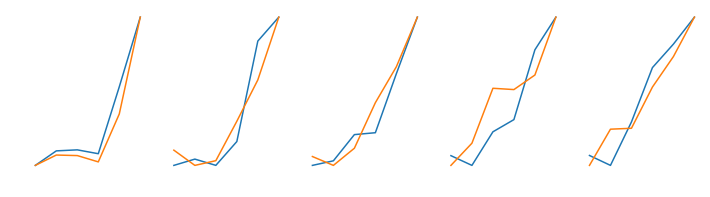

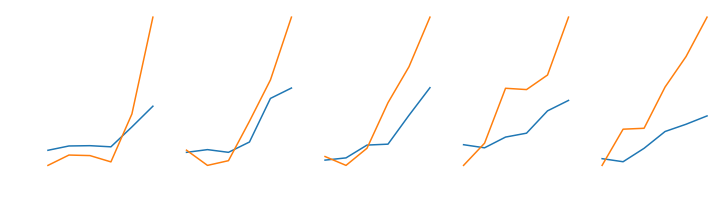

In [26]:
plt.figure(figsize=(12,3))
for i in range(5):
    plt.subplot(1,5,i+1)
    plt.plot((r_stat[i]-r_stat[i].min())/(r_stat[i].max()-r_stat[i].min()))
    plt.plot((r_run[i]-r_run[i].min())/(r_run[i].max()-r_run[i].min()))
#     plt.ylim((0,0.04))
    plt.axis('off')
plt.figure(figsize=(12,3))
for i in range(5):
    plt.subplot(1,5,i+1)
    plt.plot(r_stat[i])
    plt.plot(r_run[i])
#     plt.ylim((0,0.04))
    plt.axis('off')

<IPython.core.display.Javascript object>


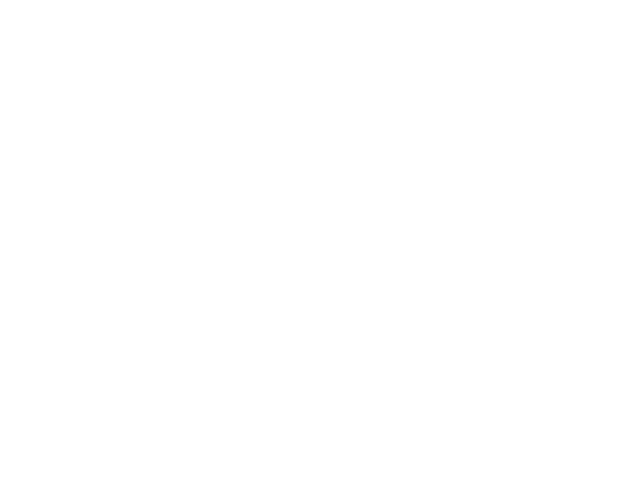

In [123]:
plt.figure()
plt.plot(0.25*np.array((0,0.06,0.12,0.25,0.5,1)),r_run.T)

In [148]:
vals = {keylist[k]:soriavg[keylist[k]] for k in (0,)}
select = {keylist[k]:ontarget[keylist[k]] for k in (0,)}
snorm = sca.get_norm_curves(vals,select,sizes=(0,1,2,3,4),contrasts=(0,1,2,3,4,5),append_gray=False)
lb,ub = ut.bootstrap(snorm,np.mean,axis=0,pct=(2.5,97.5))

In [117]:
colors = plt.cm.viridis(np.linspace(0,1,5))

In [ ]:
ut.plot_errorbars()

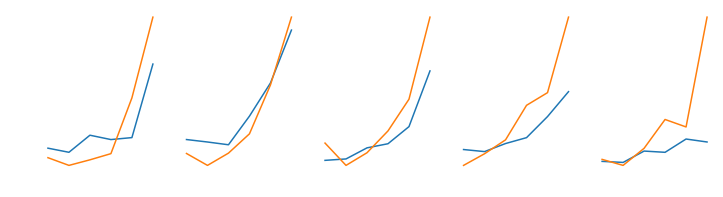

In [28]:
plt.figure(figsize=(12,3))
for i in range(5):
    plt.subplot(1,5,i+1)
    plt.plot(re_stat[i])
    plt.plot(re_run[i])
#     plt.ylim((0,0.04))
    plt.axis('off')

/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:16: RuntimeWarning: Mean of empty slice.
  app.launch_new_instance()
/home/mossing/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:73: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)
/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: Mean of empty slice.
/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: Mean of empty slice.
/home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(mes

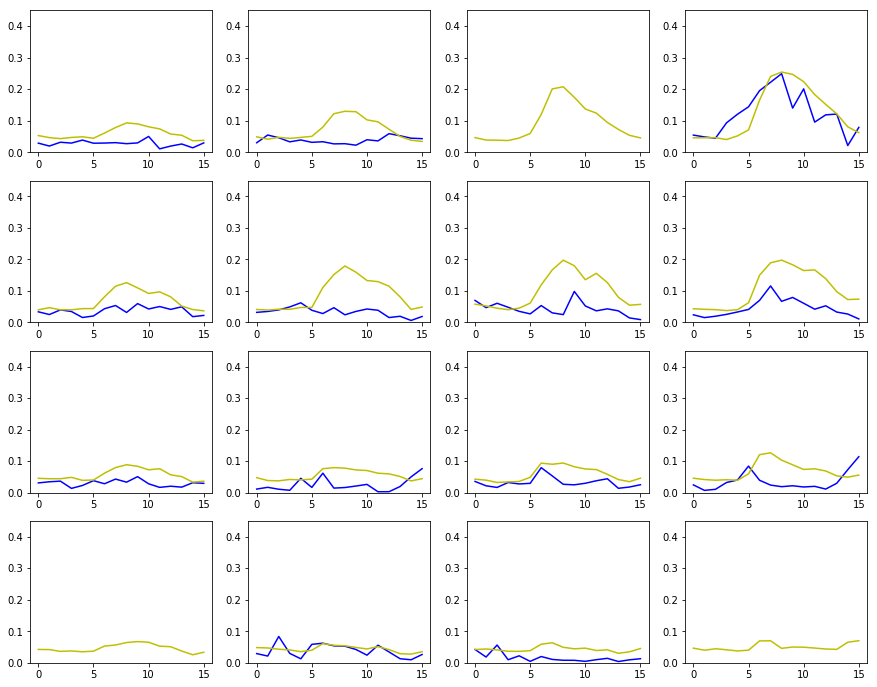

In [392]:
plt.figure(figsize=(15,12))
k = 2
ucontrast = np.unique(proc[keylist[k]]['contrast'])
usize = np.unique(proc[keylist[k]]['size'])
ncontrast = len(ucontrast)
nsize = len(usize)
gd = ontarget[keylist[k]]
r_run = np.zeros((nsize,ncontrast))
r_stat = np.zeros((nsize,ncontrast))
re_run = np.zeros((nsize,ncontrast))
re_stat = np.zeros((nsize,ncontrast))
for i,size in enumerate(usize):
    for j,contrast in enumerate(ucontrast):
        plt.subplot(nsize,ncontrast,i*ncontrast+j+1)
        lkat = np.logical_and(np.logical_and(proc[keylist[k]]['contrast']==contrast,proc[keylist[k]]['size']==size),1-proc[keylist[k]]['runtrial'])
        plt.plot(proc[keylist[k]]['strialwise'][gd][:,lkat].mean(0).mean(0),c='b')
        re_stat[i,j] = proc[keylist[k]]['strialwise'][gd][:,lkat].mean(0).mean(0)[4:6].mean()
        r_stat[i,j] = proc[keylist[k]]['strialwise'][gd][:,lkat].mean(0).mean(0)[6:].mean()
        plt.ylim(0,0.45)
    for j,contrast in enumerate(ucontrast):
        plt.subplot(nsize,ncontrast,i*ncontrast+j+1)
        lkat = np.logical_and(np.logical_and(proc[keylist[k]]['contrast']==contrast,proc[keylist[k]]['size']==size),proc[keylist[k]]['runtrial'])
        plt.plot(proc[keylist[k]]['strialwise'][gd][:,lkat].mean(0).mean(0),c='y')
        re_run[i,j] = proc[keylist[k]]['strialwise'][gd][:,lkat].mean(0).mean(0)[4:6].mean()
        r_run[i,j] = proc[keylist[k]]['strialwise'][gd][:,lkat].mean(0).mean(0)[6:].mean()
        plt.ylim(0,0.45)

<IPython.core.display.Javascript object>


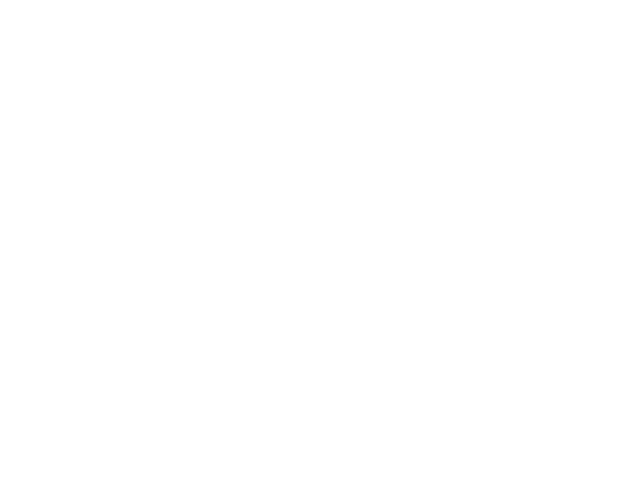

In [68]:
plt.figure()
# s0 = spont[keylist[1]][ontarget[keylist[1]]].mean(0)
plt.plot(cstar,soriavg[keylist[1]][ontarget[keylist[1]]].mean(0)[:-1].T)

<IPython.core.display.Javascript object>


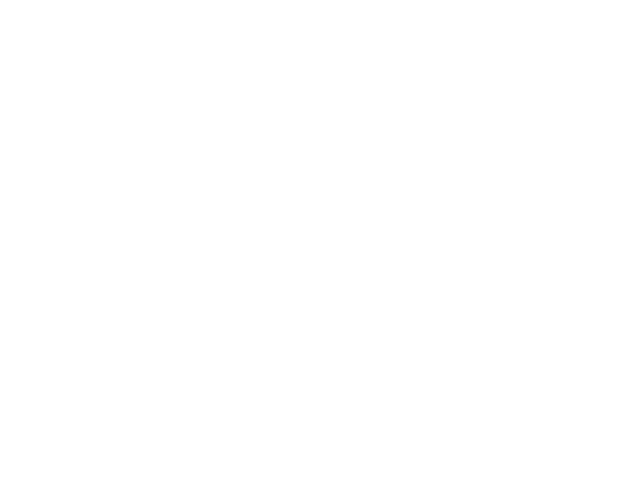

NameError: name 's0' is not defined

In [190]:
reload(nra)
param = np.zeros((4,4))
c = np.array((0,12,25,50,100))
cstar = np.array((0,6,12,25,50,100))
plt.figure()
for i in range(4):
    param[i] = nra.fit_opt_params(c,np.hstack((s0,soriavg[keylist[-1]][ontarget[keylist[-1]]].mean(0)[i])))
    plt.plot(cstar,nra.naka_rushton(cstar,param[i]))
plt.plot(cstar,nra.naka_rushton(cstar,(param[1]+param[2])/2))
for i in range(4):
    plt.plot(c,np.hstack((s0,soriavg[keylist[-1]][ontarget[keylist[-1]]].mean(0)[i])).T)

In [189]:
data = np.hstack((s0*np.ones((4,1)),soriavg[keylist[-1]][ontarget[keylist[-1]]].mean(0)))[:3]

NameError: name 's0' is not defined

In [112]:
lb[keylist[-1]].shape

(1116, 4, 4, 4)

<IPython.core.display.Javascript object>


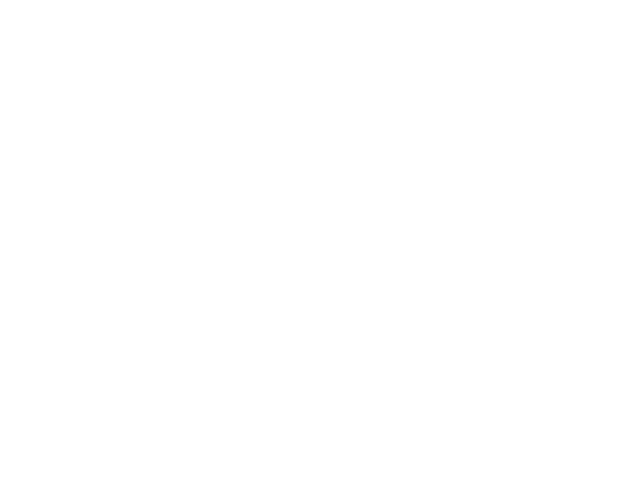

In [115]:
plt.figure()
plt.plot(c,data.T)
plt.legend(['7.5 deg','15 deg','30 deg'])
plt.xlabel('contrast (%)')
plt.ylabel('mean event rate')
plt.title('PC contrast response functions by size')
# plt.savefig('pc_crf_by_size_no_errorbar.pdf')

<IPython.core.display.Javascript object>


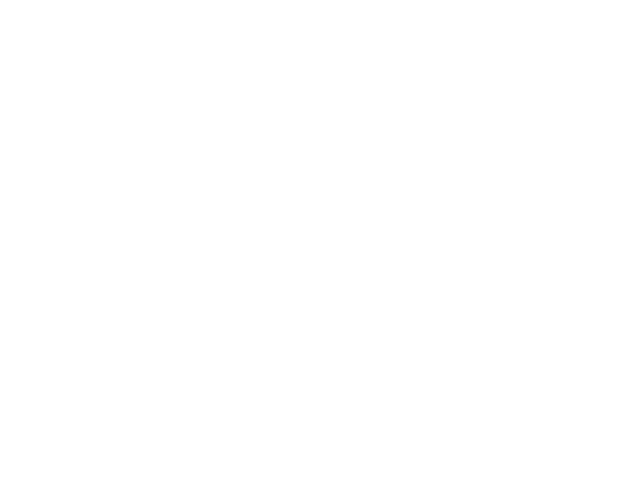

In [104]:
synthetic = np.hstack((s0*np.ones((4,1)),soriavg[keylist[-1]][ontarget[keylist[-1]]].mean(0)))[:3]
plt.figure()
# plt.plot(c,synthetic.T)
# plt.plot(c,synthetic[0]+1*(synthetic[0]-synthetic[1]))
# plt.plot(c,0.5*(synthetic[-1]+synthetic[-2]))
synthetic = np.vstack((synthetic[0]+(synthetic[0]-synthetic[1]),synthetic[:2],0.5*(synthetic[1]+synthetic[2]),synthetic[2]))
synthetic = np.hstack((synthetic[:,0:1],0.5*(synthetic[:,0:1]+synthetic[:,1:2]),synthetic[:,1:]))
plt.plot(cstar,synthetic.T)
synthetic = synthetic/synthetic.max()

In [105]:
import pickle as pkl
with open('fake_pc_size_contrast.p', 'wb') as handle:
    pkl.dump(synthetic, handle, protocol=pkl.HIGHEST_PROTOCOL)

<IPython.core.display.Javascript object>


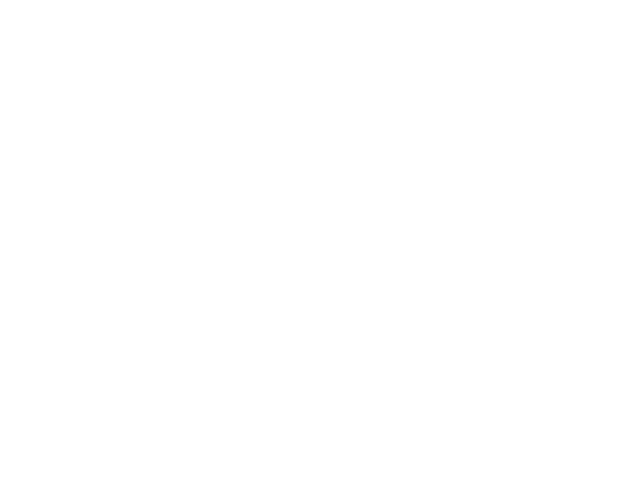

In [80]:
plt.figure()
plt.plot(param[1])
plt.plot(param[2])

In [73]:
(param[1]+param[2])/2

15.569375021053247

<IPython.core.display.Javascript object>


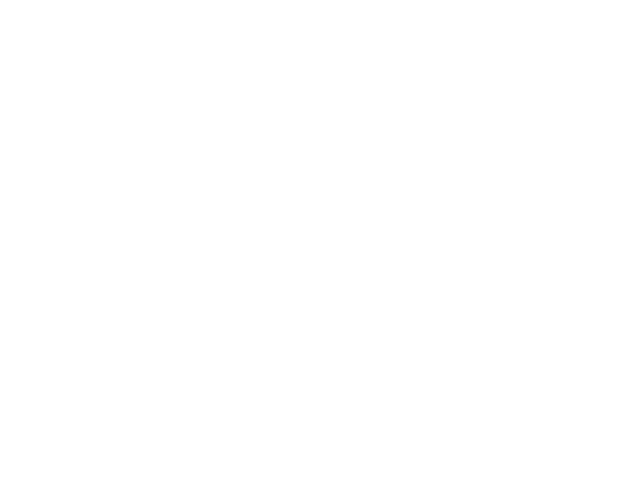

In [64]:
plt.figure()
plt.plot(param[:,1])

In [36]:
spont[keylist[-1]][ontarget[keylist[-1]]].mean(0)

0.042736581493325876

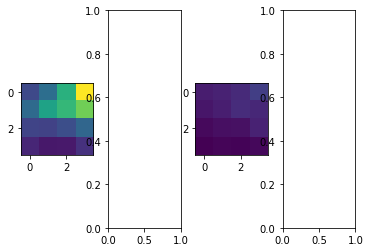

In [393]:
mn = np.minimum(np.minimum(np.minimum(r_run,r_run),re_run),re_run).min()
mx = np.maximum(np.maximum(np.maximum(r_run,r_run),re_run),re_run).max()

plt.figure()
plt.subplot(1,4,1)
plt.imshow(r_run,vmin=mn,vmax=mx)
plt.subplot(1,4,2)
# plt.imshow(r_stat,vmin=mn,vmax=mx)
plt.subplot(1,4,3)
plt.imshow(re_run,vmin=mn,vmax=mx)
plt.subplot(1,4,4)
# plt.imshow(re_stat,vmin=mn,vmax=mx)

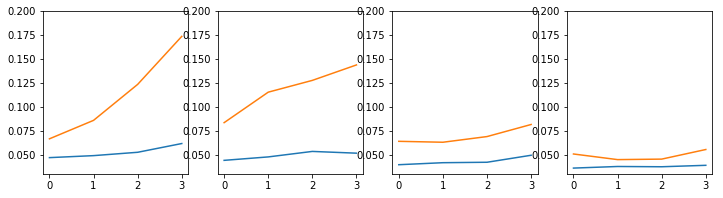

In [394]:
plt.figure(figsize=(12,3))
for i in range(4):
    plt.subplot(1,4,i+1)
    plt.plot(re_run[i])
    plt.plot(r_run[i])
    plt.ylim((0.03,0.2))

In [13]:
plt.figure(figsize=(15,12))
k = 1
ucontrast = np.unique(proc[keylist[k]]['contrast'])
usize = np.unique(proc[keylist[k]]['size'])
ncontrast = len(ucontrast)
nsize = len(usize)
gd = ontarget[keylist[k]]
r_run = np.zeros((nsize,ncontrast))
r_stat = np.zeros((nsize,ncontrast))
re_run = np.zeros((nsize,ncontrast))
re_stat = np.zeros((nsize,ncontrast))
for i,size in enumerate(usize):
    for j,contrast in enumerate(ucontrast):
        plt.subplot(nsize,ncontrast,i*ncontrast+j+1)
        lkat = np.logical_and(np.logical_and(proc[keylist[k]]['contrast']==contrast,proc[keylist[k]]['size']==size),1-proc[keylist[k]]['runtrial'])
        plt.plot(proc[keylist[k]]['strialwise'][gd][:,lkat].mean(0).mean(0),c='b')
        re_stat[i,j] = proc[keylist[k]]['strialwise'][gd][:,lkat].mean(0).mean(0)[4:7].mean()
        r_stat[i,j] = proc[keylist[k]]['strialwise'][gd][:,lkat].mean(0).mean(0)[7:].mean()
        plt.ylim(0,0.1)
    for j,contrast in enumerate(ucontrast):
        plt.subplot(nsize,ncontrast,i*ncontrast+j+1)
        lkat = np.logical_and(np.logical_and(proc[keylist[k]]['contrast']==contrast,proc[keylist[k]]['size']==size),proc[keylist[k]]['runtrial'])
        plt.plot(proc[keylist[k]]['strialwise'][gd][:,lkat].mean(0).mean(0),c='y')
        re_run[i,j] = proc[keylist[k]]['strialwise'][gd][:,lkat].mean(0).mean(0)[4:7].mean()
        r_run[i,j] = proc[keylist[k]]['strialwise'][gd][:,lkat].mean(0).mean(0)[7:].mean()
        plt.ylim(0,0.1)

NameError: name 'keylist' is not defined

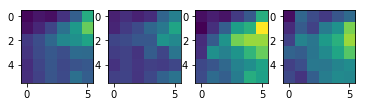

In [396]:
mn = np.minimum(np.minimum(np.minimum(r_run,r_stat),re_run),re_stat).min()
mx = np.maximum(np.maximum(np.maximum(r_run,r_stat),re_run),re_stat).max()

plt.figure()
plt.subplot(1,4,1)
plt.imshow(r_run,vmin=mn,vmax=mx)
plt.subplot(1,4,2)
plt.imshow(r_stat,vmin=mn,vmax=mx)
plt.subplot(1,4,3)
plt.imshow(re_run,vmin=mn,vmax=mx)
plt.subplot(1,4,4)
plt.imshow(re_stat,vmin=mn,vmax=mx)

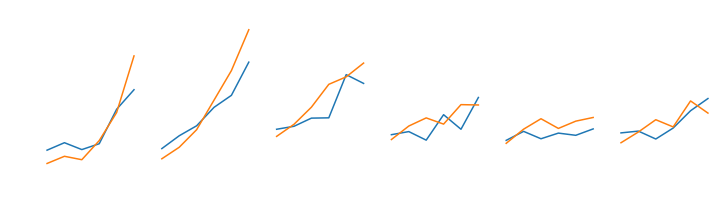

In [397]:
plt.figure(figsize=(12,3))
for i in range(6):
    plt.subplot(1,6,i+1)
    plt.plot(r_stat[i])
    plt.plot(r_run[i])
    plt.ylim((0,0.04))
    plt.axis('off')

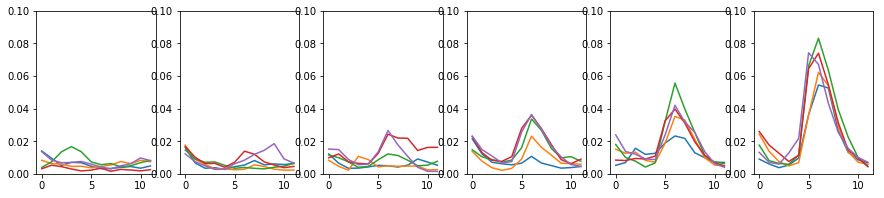

In [398]:
plt.figure(figsize=(15,3))
k = 0
ucontrast = np.unique(proc[keylist[k]]['contrast'])
usize = np.unique(proc[keylist[k]]['size'])
for i,contrast in enumerate(ucontrast):
    plt.subplot(1,len(ucontrast),i+1)
    for size in usize:
        lkat = np.logical_and(np.logical_and(proc[keylist[k]]['contrast']==contrast,proc[keylist[k]]['size']==size),proc[keylist[k]]['runtrial'])
        plt.plot(proc[keylist[k]]['strialwise'][:,lkat].mean(0).mean(0))
    plt.ylim(0,0.1)
#     plt.ylim(600,800)

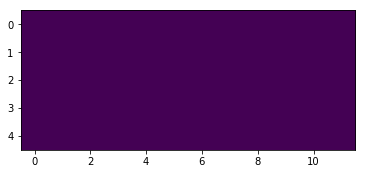

In [322]:
savg = np.zeros((5,proc[keylist[k]]['strialwise'].shape[-1]))
plt.figure()
plt.imshow(savg)

In [323]:
plt.figure()
plt.imshow()

TypeError: imshow() missing 1 required positional argument: 'X'

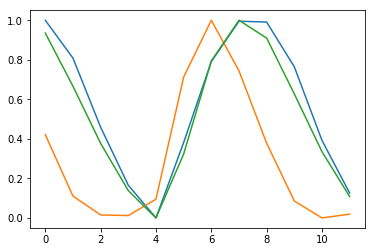

In [399]:
k = 0
# plt.plot(proc[keylist[k]]['trialwise'].mean(0).mean(0))
s = proc[keylist[k]]['strialwise'].mean(0).mean(0)
f = proc[keylist[k]]['trialwise'].mean(0).mean(0)
c = proc[keylist[k]]['ctrialwise'].mean(0).mean(0)
plt.plot(ut.norm01(f))
plt.plot(ut.norm01(s))
plt.plot(ut.norm01(c))

In [325]:
keylist = list(soriavg.keys())

In [326]:
keylist

['180530/M8174/', '180220/M7254/', '180216/M7307/']

In [352]:
ontarget = {}
for key in keylist:
    ontarget[key] = np.nanmin(pval[key],axis=1)<0.01/(np.logical_not(np.isnan(pval[key][0])).sum())
    print(ontarget[key].sum())

162
21
50


/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: All-NaN axis encountered
  This is separate from the ipykernel package so we can avoid doing imports until
/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in less
  This is separate from the ipykernel package so we can avoid doing imports until


In [401]:
Smean_stat[keylist[0]].shape
stat_avg = {}
for key in keylist:
    stat_avg[key] = Smean_stat[key].mean(1)[:,:,:,4:-4].mean(-1)

In [402]:
strialavg[keylist[2]].shape

(1116, 4, 4, 4, 16)

In [403]:
filebase

NameError: name 'filebase' is not defined

In [404]:
thisfold = '180530/M8174/'
thisfile = 'M8174_130_003'
trialwise,ctrialwise,strialwise,dfof = ut.gen_precise_trialwise(datafiles,rg=rg,frame_adjust=frame_adjust,nbefore=nbefore,nafter=nafter)

NameError: name 'datafiles' is not defined

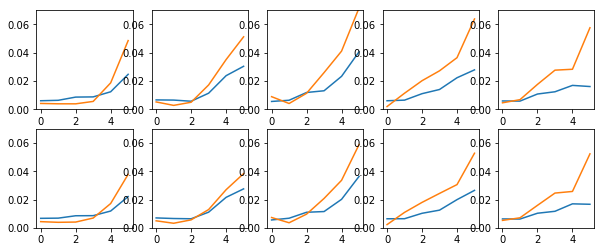

In [408]:
plt.figure(figsize=(10,4))
k = 0
nlines = soriavg[keylist[k]].shape[1]
for i in range(nlines):
    plt.subplot(2,nlines,i+1)
    lkat = ontarget[keylist[k]] #np.logical_and(ontarget[keylist[k]],ontarget_ret_lax)
    plt.plot(stat_avg[keylist[k]][lkat].mean(0)[i].T)
    plt.plot(soriavg[keylist[k]][lkat].mean(0)[i].T)
#     plt.ylim(0,0.1)
    plt.ylim(0,0.07)
    plt.subplot(2,nlines,i+nlines+1)
    lkat = ontarget[keylist[k]]
    lkat = lkat > -1
    plt.plot(stat_avg[keylist[k]][lkat].mean(0)[i].T)
    plt.plot(soriavg[keylist[k]][lkat].mean(0)[i].T)
#     plt.ylim(0,0.1)
    plt.ylim(0,0.07)

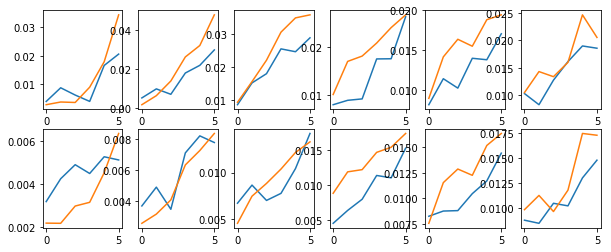

In [409]:
plt.figure(figsize=(10,4))
k = 1
nlines = soriavg[keylist[k]].shape[1]
for i in range(nlines):
    plt.subplot(2,nlines,i+1)
    lkat = ontarget[keylist[k]] #np.logical_and(ontarget[keylist[k]],ontarget_ret_lax)
    plt.plot(stat_avg[keylist[k]][lkat].mean(0)[i].T)
    plt.plot(soriavg[keylist[k]][lkat].mean(0)[i].T)
#     plt.ylim(0,0.2)
    plt.subplot(2,nlines,i+nlines+1)
    lkat = ontarget[keylist[k]]
    lkat = lkat > -1
    plt.plot(stat_avg[keylist[k]][lkat].mean(0)[i].T)
    plt.plot(soriavg[keylist[k]][lkat].mean(0)[i].T)
#     plt.ylim(0,0.2)

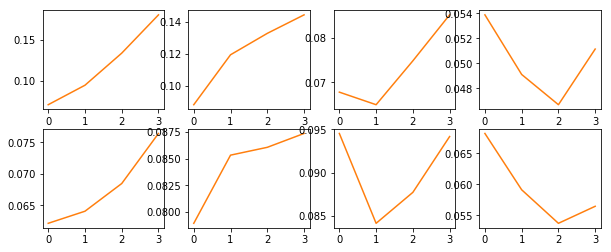

In [410]:
plt.figure(figsize=(10,4))
k = 2
nlines = soriavg[keylist[k]].shape[1]
for i in range(nlines):
    plt.subplot(2,nlines,i+1)
    lkat = ontarget[keylist[k]] #np.logical_and(ontarget[keylist[k]],ontarget_ret_lax)
    plt.plot(stat_avg[keylist[k]][lkat].mean(0)[i].T)
    plt.plot(soriavg[keylist[k]][lkat].mean(0)[i].T)
#     plt.ylim(0,0.2)
    plt.subplot(2,nlines,i+nlines+1)
    lkat = ontarget[keylist[k]]
    lkat = lkat > -1
    plt.plot(stat_avg[keylist[k]][lkat].mean(0)[i].T)
    plt.plot(soriavg[keylist[k]][lkat].mean(0)[i].T)
#     plt.ylim(0,0.2)

In [411]:
def ontarget_by_retinotopy(ret_vars,ctr=None,rg=5,pcutoff=1e-2):
    # ctr is the location of the center in the expt of interest, relative to the retinotopy center, in degrees.
    # as given in the MATLAB output, positive y-values are upward on the monitor
    if ctr is None:
        ctr = np.array((0,0))
#         ctr = (ret[0].shape-np.array((1,1)))/2
#     com = np.zeros((ret.shape[0],2))
#     for i in range(com.shape[0]):
#         com[i] = snm.center_of_mass(ret[i]-ret[i].min())
#     return ((com-ctr[np.newaxis,:])**2).sum(1)<rg**2,com
    xo = ret_vars['paramdict_normal']['xo'][()]
    yo = ret_vars['paramdict_normal']['yo'][()]
    pval_ret = ret_vars['pval_ret']
    return np.logical_and((xo-ctr[0])**2+(yo+ctr[1])**2<rg**2,pval_ret<pcutoff),np.hstack((xo,yo))

In [412]:
ontarget_ret_strict,com = rt.ontarget_by_retinotopy(ret_vars[keylist[0]],ctr=np.array((-5,5)),rg=2.5)
ontarget_ret_lax,com = rt.ontarget_by_retinotopy(ret_vars[keylist[0]],ctr=np.array((-5,5)),rg=5)

/home/mossing/Documents/code/adesnal/retinotopy_analysis.py:248: RuntimeWarning: invalid value encountered in less
  return np.logical_and((xo-ctr[0])**2+(yo+ctr[1])**2<rg**2,pval_ret<pcutoff),np.hstack((xo,yo))


In [413]:
# plt.figure()
# k = 0
# rfcentered = ontarget_ret_strict #ontarget[keylist[k]]
# plt.subplot(2,2,1)
# for contrast in range(strialavg[keylist[k]].shape[3]):
#     plt.plot(np.nanmean(np.nanmean(np.nanmean(strialavg[keylist[k]][rfcentered,:,:,contrast],axis=0),axis=0),axis=0))
# plt.subplot(2,2,2)
# for size in range(strialavg[keylist[k]].shape[2]):
#     plt.plot(np.nanmean(np.nanmean(np.nanmean(strialavg[keylist[k]][rfcentered,:,size,:],axis=0),axis=0),axis=0))
# k = 0
# rfcentered = ontarget_ret_lax #ontarget[keylist[k]]
# rfcentered = ontarget[keylist[k]]
# plt.subplot(2,2,3)
# for contrast in range(strialavg[keylist[k]].shape[3]):
#     plt.plot(np.nanmean(np.nanmean(np.nanmean(strialavg[keylist[k]][rfcentered,:,:,contrast],axis=0),axis=0),axis=0))
# plt.subplot(2,2,4)
# for size in range(strialavg[keylist[k]].shape[2]):
#     plt.plot(np.nanmean(np.nanmean(np.nanmean(strialavg[keylist[k]][rfcentered,:,size,:],axis=0),axis=0),axis=0))

In [414]:
lkat = np.logical_and(ontarget[keylist[0]],ontarget_ret_lax)
lkat.sum()

64

In [415]:
lbm = {}
ubm = {}
for key in keylist:
    lbm[key] = lb[key].mean(1)
    ubm[key] = ub[key].mean(1)

In [416]:
def do_three(x,mn,lb,ub,fn_outer,fn_inner):
    fn_outer(x,fn_inner(mn),fn_inner(lb),fn_inner(ub))

In [417]:
spont[keylist][0]

TypeError: unhashable type: 'list'

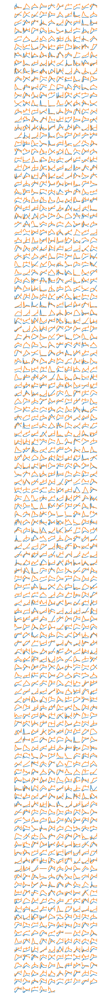

In [418]:
reload(ut)
s = np.array([5,9.3,17.3,32.2,60])
# k = 1
lkat = np.logical_and(ontarget[keylist[0]],ontarget_ret_lax)>-1
theserows = np.array((2,4))
# plt.plot(np.nanmean(strialavg[keylist[0]][ontarget_ret_strict][1],axis=0).mean(0).T)
fn_outer = ut.plot_errorbars_in_rows
fn_inner = lambda x: x[keylist[0]][lkat][:,:,theserows].transpose((0,2,1))
do_three(s,soriavg,lbm,ubm,fn_outer,fn_inner)
# ut.plot_errorbars_in_rows(s,soriavg[keylist[0]][lkat][:,:,theserows].transpose((0,2,1)),lb[keylist[0]][lkat][:,:,theserows].mean(1).transpose((0,2,1)),ub[keylist[0]][lkat][:,:,theserows].mean(1).transpose((0,2,1)))

/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.


<IPython.core.display.Javascript object>


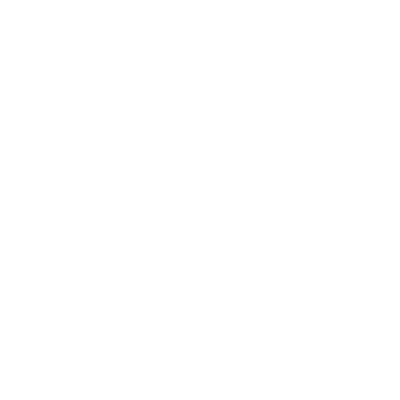

NameError: name 'do_three' is not defined

In [214]:
s = np.array([7.5,15,30,60])
theserows = np.array((0,2))

snorm = (soriavg[keylist[1]]/soriavg[keylist[1]].max(1).max(1)[:,np.newaxis,np.newaxis])
lkat = ontarget[keylist[1]]
lbmn,ubmn = ut.bootstrap(snorm[lkat],np.mean,axis=0,pct=(16,84))

plt.figure(figsize=(4,4))
reload(ut)

fn_outer = lambda x,y,z,w: ut.plot_errorbar_hillel(x,y,z,w,linestyle='solid',c='b')
fn_inner = lambda x: x[:,theserows[1]].T
do_three(s,snorm[lkat].mean(0),lbmn,ubmn,fn_outer,fn_inner)

fn_outer = lambda x,y,z,w: ut.plot_errorbar_hillel(x,y,z,w,linestyle='dashed',c='c')
fn_inner = lambda x: x[:,theserows[0]].T
do_three(s,snorm[lkat].mean(0),lbmn,ubmn,fn_outer,fn_inner)

# ut.plot_errorbar_hillel(s,snorm[lkat].mean(0)[:,theserows[0]].T,lbmn[:,theserows[0]].T,ubmn[:,theserows[0]].T,linestyle='dashed')
plt.plot(30,0.5,linestyle='solid',c='b')
plt.plot(30,0.5,linestyle='dashed',c='c')
plt.plot(s,snorm[lkat][:,:,theserows[0]].T,alpha=0.04,c='c')
plt.plot(s,snorm[lkat][:,:,theserows[1]].T,alpha=0.02,c='b')
plt.xlabel('size (deg.)')
plt.ylabel('norm. event rate')
plt.legend(['50% contrast','12% contrast'])
plt.axis('tight')

In [482]:
thisoneworked = soriavg[keylist[2]][ontarget[keylist[k]],1].mean(0)
normby = thisoneworked[1]/thisoneworked[3]

In [578]:
contrast

1.0

In [213]:
cdict = {}
szs = np.array((2,2,1))
k = 0
cdict[keylist[k]] = np.array((0,0.06,0.12,0.25))#np.array((0,0.06,0.12,0.25,0.5,1))/4
lkat = ontarget[keylist[k]]
thisoneworked = soriavg[keylist[2]][ontarget[keylist[2]],1].mean(0)
normby = thisoneworked[1]/thisoneworked[3]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,szs[k]:szs[k]+1,:]},{keylist[k]:ontarget[keylist[k]]},sizes=(0,),contrasts=(0,3,4,5),append_gray=False)
# plt.plot(cdict[keylist[k]],normby*snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],normby*snorm[:,0].mean(0),c='b')
snorm1 = put_in_place(normby*snorm[:,0],np.array((0,1,2,3)),6) # normalize to other expts' max

k = 1
cdict[keylist[k]] = np.array((0,0.06,0.12,0.25,0.5,1))
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,szs[k]:szs[k]+1,:]},{keylist[k]:ontarget[keylist[k]]},sizes=(0,),contrasts=(0,1,2,3,4,5),append_gray=False)
# plt.plot(cdict[keylist[k]],snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],snorm[:,0].mean(0),c='b')
snorm1 = np.vstack((snorm1,put_in_place(snorm[:,0],np.array((0,1,2,3,4,5)),6)))

k = 2
cdict[keylist[k]] = np.array((0.12,0.25,0.5,1))
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,szs[k]:szs[k]+1,:]},{keylist[k]:ontarget[keylist[k]]},sizes=(0,),contrasts=(0,1,2,3),append_gray=False)
# plt.plot(cdict[keylist[k]],snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],snorm[:,0].mean(0),c='b')
snorm1 = np.vstack((snorm1,put_in_place(snorm[:,0],np.array((2,3,4,5)),6)))
plt.figure()
lb,ub = ut.bootstrap(snorm1,pct=(2.5,97.5),fn=np.nanmean)
ut.plot_errorbar_hillel(100*np.array((0,0.06,0.12,0.25,0.5,1)),np.nanmean(snorm1,axis=0),lb,ub,c='k')
plt.ylim(-0.05,1.05)
plt.xlabel('contrast (%)')
plt.ylabel('norm. event rate')
# plt.savefig('pc_crf.pdf')
# plt.savefig('pc_crf.eps')

savedict = {}
savedict['contrast'] = 100*np.array((0,0.06,0.12,0.25,0.5,1))
savedict['rate'] = {}
savedict['opt'] = {}
savedict['rate']['mid'] = (np.nanmean(snorm1,axis=0),lb,ub)
# savedict['rate']['lo'] = (np.nanmean(snorm,axis=0)[:,2],lb[:,2],ub[:,2])
savedict['opt']['mid'] = {'c':'k','linewidth':2}
# savedict['opt']['lo'] = {'c':'y','linestyle':'dashed'}

NameError: name 'put_in_place' is not defined

In [582]:
import pickle as pkl
with open('pc_contrast.p', 'wb') as handle:
    pkl.dump(savedict, handle, protocol=pkl.HIGHEST_PROTOCOL)

In [199]:
soriavg[keylist[2]][ontarget[keylist[2]],:].mean(1).shape

(128, 4)

In [203]:
keylist

['180530/M8174/', '180220/M7254/', '180216/M7307/']

In [208]:
normby

0.78279439646254112

<IPython.core.display.Javascript object>


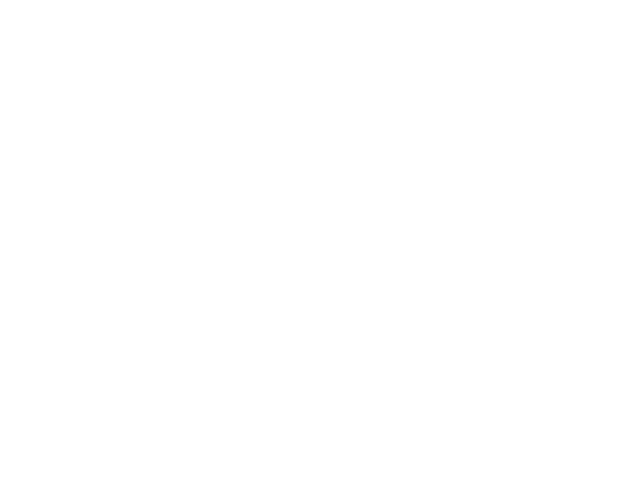

Text(0,0.5,'norm. event rate')

In [281]:
def put_in_place_cols(arr,xvals,tot_xvals):
    to_return = np.nan*np.ones((arr.shape[0],arr.shape[1],tot_xvals))
    to_return[:,:,xvals] = arr
    return to_return

cdict = {}
szs = np.array(((1,2,3),(1,2,3),(0,1,2)))
k = 0
cdict[keylist[k]] = np.array((0,0.06,0.12,0.25))#np.array((0,0.06,0.12,0.25,0.5,1))/4
lkat = ontarget[keylist[k]]
thisoneworked0 = soriavg[keylist[2]][ontarget[keylist[2]],0].mean(0)
thisoneworked1 = soriavg[keylist[2]][ontarget[keylist[2]],1].mean(0)
normby = 0.5*(thisoneworked0[1]/thisoneworked0[3] + thisoneworked1[1]/thisoneworked1[3])
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,szs[k],:]},{keylist[k]:ontarget[keylist[k]]},sizes=(0,1,2),contrasts=(0,3,4,5),append_gray=False)
# plt.plot(cdict[keylist[k]],normby*snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],normby*snorm[:,0].mean(0),c='b')
snorm1 = put_in_place_cols(normby*snorm,np.array((0,1,2,3)),6) # normalize to other expts' max

k = 1
cdict[keylist[k]] = np.array((0,0.06,0.12,0.25,0.5,1))
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,szs[k],:]},{keylist[k]:ontarget[keylist[k]]},sizes=(0,1,2),contrasts=(0,1,2,3,4,5),append_gray=False)
# plt.plot(cdict[keylist[k]],snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],snorm[:,0].mean(0),c='b')
snorm1 = np.vstack((snorm1,put_in_place_cols(snorm,np.array((0,1,2,3,4,5)),6)))

k = 2
cdict[keylist[k]] = np.array((0.12,0.25,0.5,1))
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,szs[k],:]},{keylist[k]:ontarget[keylist[k]]},sizes=(0,1,2),contrasts=(0,1,2,3),append_gray=False)
# plt.plot(cdict[keylist[k]],snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],snorm[:,0].mean(0),c='b')
snorm1 = np.vstack((snorm1,put_in_place_cols(snorm,np.array((2,3,4,5)),6)))
plt.figure()
lb,ub = ut.bootstrap(snorm1,pct=(2.5,97.5),fn=np.nanmean)
for i in range(3):
    ut.plot_errorbar_hillel(100*np.array((0,0.06,0.12,0.25,0.5,1)),np.nanmean(snorm1[:,i],axis=0),lb[i],ub[i],c='k',linewidth=1)
# ut.plot_errorbar_hillel(100*np.array((0,0.06,0.12,0.25,0.5,1)),np.nanmean(snorm1[:,1],axis=0),lb[1],ub[1],c='k',linewidth=3)
plt.ylim(-0.05,1.05)
plt.xlabel('contrast (%)')
plt.ylabel('norm. event rate')

# plt.savefig('pc_crf_two.pdf')
# plt.savefig('pc_crf_two.eps')

/home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


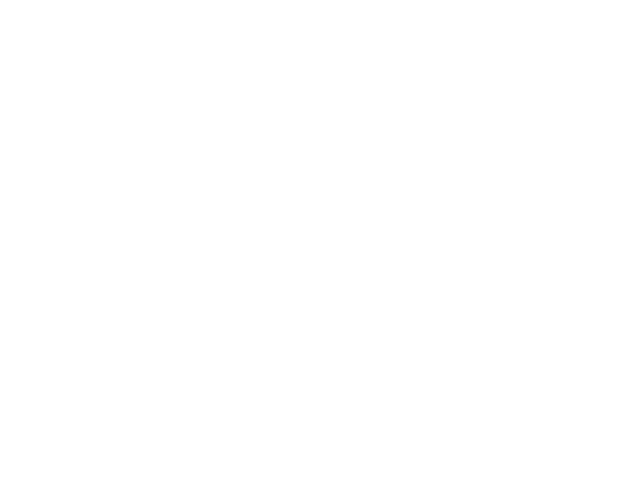

In [349]:
reload(ut)
def put_in_place_cols(arr,xvals,tot_xvals):
    to_return = np.nan*np.ones((arr.shape[0],arr.shape[1],tot_xvals))
    to_return[:,:,xvals] = arr
    return to_return

cdict = {}
szs = np.array(((1,2,4),(1,2,4),(0,1,2)))
k = 0
cdict[keylist[k]] = np.array((0,0.06,0.12,0.25))#np.array((0,0.06,0.12,0.25,0.5,1))/4
lkat = ontarget[keylist[k]]
thisoneworked0 = soriavg[keylist[2]][ontarget[keylist[2]],0].mean(0)
thisoneworked1 = soriavg[keylist[2]][ontarget[keylist[2]],1].mean(0)
normby = 0.5*(thisoneworked0[1]/thisoneworked0[3] + thisoneworked1[1]/thisoneworked1[3])
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,:,:]},{keylist[k]:ontarget[keylist[k]]},sizes=szs[k],contrasts=(0,2,3,4,5),append_gray=False)
# plt.plot(cdict[keylist[k]],normby*snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],normby*snorm[:,0].mean(0),c='b')
snorm1 = put_in_place_cols(normby*snorm,np.array((0,1,2,3,4)),7) # normalize to other expts' max

k = 1
cdict[keylist[k]] = np.array((0,0.06,0.12,0.25,0.5,1))
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,:,:]},{keylist[k]:ontarget[keylist[k]]},sizes=szs[k],contrasts=(0,1,2,3,4,5),append_gray=False)
# plt.plot(cdict[keylist[k]],snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],snorm[:,0].mean(0),c='b')
snorm1 = np.vstack((snorm1,put_in_place_cols(snorm,np.array((0,2,3,4,5,6)),7)))

k = 2
cdict[keylist[k]] = np.array((0.12,0.25,0.5,1))
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,:,:]},{keylist[k]:ontarget[keylist[k]]},sizes=szs[k],contrasts=(0,1,2,3),append_gray=False)
# plt.plot(cdict[keylist[k]],snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],snorm[:,0].mean(0),c='b')
snorm1 = np.vstack((snorm1,put_in_place_cols(snorm,np.array((3,4,5,6)),7)))
plt.figure()
lb,ub = ut.bootstrap(snorm1,pct=(2.5,97.5),fn=np.nanmean)

c = [np.array((0.6,0.6,0.6)),np.array((0.3,0.3,0.3)),np.array((0.0,0.0,0.0))]
for i in range(3):
    plt.plot(0,0,c=c[i])
for i in range(3):
    ut.plot_errorbar_hillel(100*np.array((0,0.03,0.06,0.12,0.25,0.5,1)),np.nanmean(snorm1[:,i],axis=0),lb[i],ub[i],c=c[i])
# ut.plot_errorbar_hillel(100*np.array((0,0.06,0.12,0.25,0.5,1)),np.nanmean(snorm1[:,1],axis=0),lb[1],ub[1],c='k',linewidth=3)
plt.ylim(-0.05,1.05)
plt.xlabel('contrast (%)')
plt.ylabel('norm. event rate')
plt.legend(['7-8 deg','13-15 deg','30-36 deg'])

plt.savefig('pc_crf_three.pdf')
plt.savefig('pc_crf_three.eps')

/home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


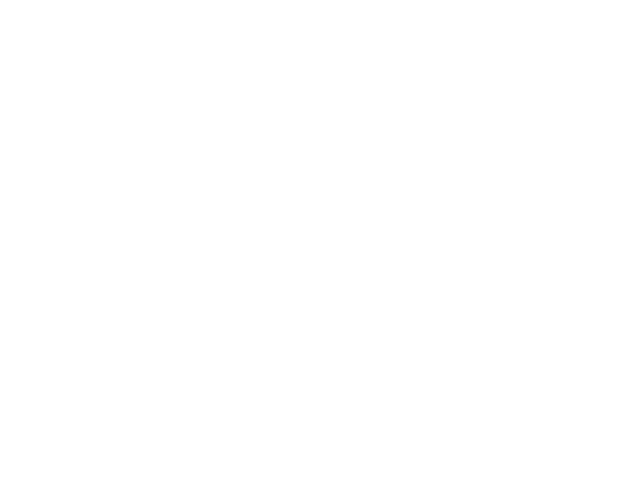

/home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_base.py:2918: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=1.0, right=1.0
  'left=%s, right=%s') % (left, right))


In [309]:
reload(ut)
def put_in_place_cols(arr,xvals,tot_xvals):
    to_return = np.nan*np.ones((arr.shape[0],arr.shape[1],tot_xvals))
    to_return[:,:,xvals] = arr
    return to_return

cdict = {}
szs = np.array(((1,2,4),(1,2,4),(0,1,2)))
k = 0
cdict[keylist[k]] = np.array((0,0.06,0.12,0.25))#np.array((0,0.06,0.12,0.25,0.5,1))/4
lkat = ontarget[keylist[k]]
thisoneworked0 = soriavg[keylist[2]][ontarget[keylist[2]],0].mean(0)
thisoneworked1 = soriavg[keylist[2]][ontarget[keylist[2]],1].mean(0)
normby = 0.5*(thisoneworked0[1]/thisoneworked0[3] + thisoneworked1[1]/thisoneworked1[3])
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,szs[k],:]},{keylist[k]:ontarget[keylist[k]]},sizes=(0,1,2),contrasts=(0,2,3,4,5),append_gray=False)
# plt.plot(cdict[keylist[k]],normby*snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],normby*snorm[:,0].mean(0),c='b')
snorm1 = put_in_place_cols(normby*snorm,np.array((0,1,2,3,4)),7) # normalize to other expts' max

k = 1
cdict[keylist[k]] = np.array((0,0.06,0.12,0.25,0.5,1))
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,szs[k],:]},{keylist[k]:ontarget[keylist[k]]},sizes=(0,1,2),contrasts=(0,1,2,3,4,5),append_gray=False)
# plt.plot(cdict[keylist[k]],snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],snorm[:,0].mean(0),c='b')
snorm1 = np.vstack((snorm1,put_in_place_cols(snorm,np.array((0,2,3,4,5,6)),7)))

k = 2
cdict[keylist[k]] = np.array((0.12,0.25,0.5,1))
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,szs[k],:]},{keylist[k]:ontarget[keylist[k]]},sizes=(0,1,2),contrasts=(0,1,2,3),append_gray=False)
# plt.plot(cdict[keylist[k]],snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],snorm[:,0].mean(0),c='b')
snorm1 = np.vstack((snorm1,put_in_place_cols(snorm,np.array((3,4,5,6)),7)))
plt.figure()
lb,ub = ut.bootstrap(snorm1,pct=(2.5,97.5),fn=np.nanmean)

c = [np.array((0.6,0.6,0.6)),np.array((0.3,0.3,0.3)),np.array((0.0,0.0,0.0))]
for i in range(3):
    plt.semilogx(1,1,c=c[i])
for i in range(3):
    ut.plot_errorbar_hillel(0.1+100*np.array((0,0.03,0.06,0.12,0.25,0.5,1)),np.nanmean(snorm1[:,i],axis=0),lb[i],ub[i],c=c[i])
# ut.plot_errorbar_hillel(100*np.array((0,0.06,0.12,0.25,0.5,1)),np.nanmean(snorm1[:,1],axis=0),lb[1],ub[1],c='k',linewidth=3)
plt.ylim(-0.05,1.05)
plt.xlim(1,110)
plt.xlabel('contrast (%)')
plt.ylabel('norm. event rate')
plt.legend(['7-8 deg','13-15 deg','30-33 deg'])

plt.savefig('pc_crf_three_log.pdf')
plt.savefig('pc_crf_three_log.eps')

In [351]:
for key in keylist:
    print(key)
    print(ontarget[key].sum())

180530/M8174/
160
180220/M7254/
20
180216/M7307/
40


/home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


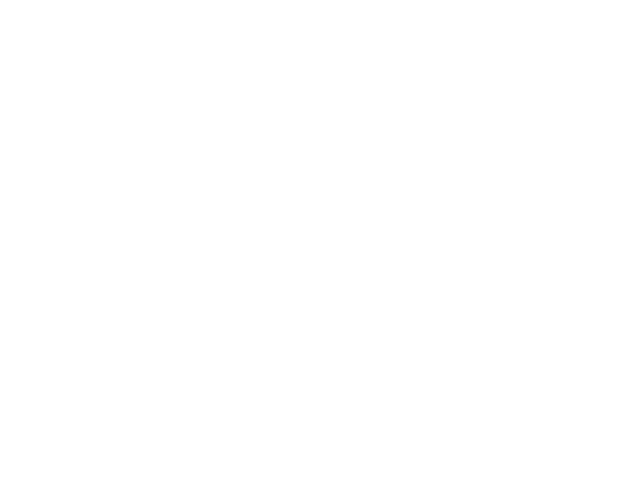

In [315]:
reload(ut)
def put_in_place_cols(arr,xvals,tot_xvals):
    to_return = np.nan*np.ones((arr.shape[0],arr.shape[1],tot_xvals))
    to_return[:,:,xvals] = arr
    return to_return

cdict = {}
szs = np.array(((1,2,4),(1,2,4),(0,1,2)))
k = 0
cdict[keylist[k]] = np.array((0,0.06,0.12,0.25))#np.array((0,0.06,0.12,0.25,0.5,1))/4
lkat = ontarget[keylist[k]]
thisoneworked0 = soriavg[keylist[2]][ontarget[keylist[2]],0].mean(0)
thisoneworked1 = soriavg[keylist[2]][ontarget[keylist[2]],1].mean(0)
normby = 0.5*(thisoneworked0[1]/thisoneworked0[3] + thisoneworked1[1]/thisoneworked1[3])
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,:,:]},{keylist[k]:ontarget[keylist[k]]},sizes=szs[k][np.array((0,1,2))],contrasts=(0,2,3,4,5),append_gray=False)
# plt.plot(cdict[keylist[k]],normby*snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],normby*snorm[:,0].mean(0),c='b')
snorm1 = put_in_place_cols(normby*snorm,np.array((0,1,2,3,4)),7) # normalize to other expts' max

k = 1
cdict[keylist[k]] = np.array((0,0.06,0.12,0.25,0.5,1))
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,:,:]},{keylist[k]:ontarget[keylist[k]]},sizes=szs[k][np.array((0,1,2))],contrasts=(0,1,2,3,4,5),append_gray=False)
# plt.plot(cdict[keylist[k]],snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],snorm[:,0].mean(0),c='b')
snorm1 = np.vstack((snorm1,put_in_place_cols(snorm,np.array((0,2,3,4,5,6)),7)))

k = 2
cdict[keylist[k]] = np.array((0.12,0.25,0.5,1))
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,:,:]},{keylist[k]:ontarget[keylist[k]]},sizes=szs[k][np.array((0,1,2))],contrasts=(0,1,2,3),append_gray=False)
# plt.plot(cdict[keylist[k]],snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],snorm[:,0].mean(0),c='b')
snorm1 = np.vstack((snorm1,put_in_place_cols(snorm,np.array((3,4,5,6)),7)))
plt.figure()
lb,ub = ut.bootstrap(snorm1,pct=(2.5,97.5),fn=np.nanmean)
plt.scatter(-1,-1,s=7.5,c='k')
plt.scatter(-1,-1,s=7.5+15,c='k')
plt.scatter(-1,-1,s=7.5+30,c='k')
for i in (1,):
    ut.plot_errorbar_hillel(100*np.array((0,0.03,0.06,0.12,0.25,0.5,1)),np.nanmean(snorm1[:,i],axis=0),lb[i],ub[i],c='k')
# ut.plot_errorbar_hillel(100*np.array((0,0.06,0.12,0.25,0.5,1)),np.nanmean(snorm1[:,1],axis=0),lb[1],ub[1],c='k',linewidth=3)
plt.ylim(-0.05,1.05)
plt.xlabel('contrast (%)')
plt.ylabel('norm. event rate')
# plt.legend(['7-8 deg','13-15 deg','30-33 deg'])

plt.savefig('pc_crf_one.pdf')
plt.savefig('pc_crf_one.eps')

In [557]:
(normby*snorm).shape

(141, 2, 4)

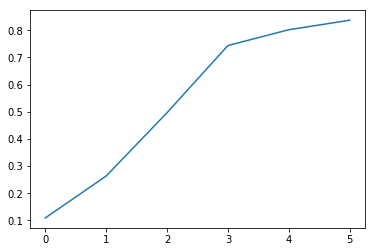

In [462]:
plt.figure()
plt.plot(np.nanmean(snorm1,axis=0))

In [443]:
snorm1.shape

(303, 6)

(0, 40)

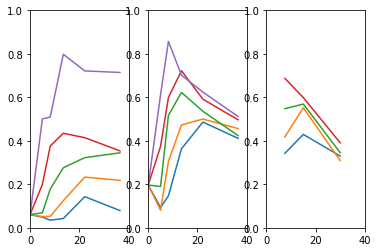

In [422]:
# 5x5: [5,9.3,17.3,32.2,60]x[0,0.1,0.22,0.46,1]
# 5x6: [5,8.2,13.5,22.2,36.5]x[0,0.06,0.12,0.25,0.5,1]
# # 3x6: [5,13.5,36.5]x[0,0.06,0.12,0.25,0.5,1]
# # 4x4: [7.5,15,30,60]
plt.subplot(1,3,1)
k = 0
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves(soriavg,{keylist[k]:ontarget[keylist[k]]},contrasts=(1,2,3,4,5),append_gray=True)
# plt.figure()
plt.plot([0,5,8.2,13.5,22.2,36.5],snorm.mean(0))
plt.ylim(0,1)
plt.xlim(0,40)
plt.subplot(1,3,2)
k = 1
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves(soriavg,{keylist[k]:ontarget[keylist[k]]},contrasts=(1,2,3,4,5),sizes=(0,1,2,3,4),append_gray=True)
# plt.figure()
plt.plot([0,5,8.2,13.5,22.2,36.5],snorm.mean(0))
plt.ylim(0,1)
plt.xlim(0,40)
plt.subplot(1,3,3)
k = 2
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves(soriavg,{keylist[k]:ontarget[keylist[k]]},contrasts=(0,1,2,3),sizes=(0,1,2),append_gray=False)
# plt.figure()
plt.plot([7.5,15,30],snorm.mean(0))
plt.ylim(0,1)
plt.xlim(0,40)

In [121]:
cdict = {}
szs = np.array((2,2,1))
k = 0
cdict[keylist[k]] = np.array((0,0.06,0.12,0.25))#np.array((0,0.06,0.12,0.25,0.5,1))/4
lkat = ontarget[keylist[k]]
thisoneworked = soriavg[keylist[2]][ontarget[keylist[2]],1].mean(0)
normby = thisoneworked[1]/thisoneworked[3]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,szs[k]:szs[k]+1,:]},{keylist[k]:ontarget[keylist[k]]},sizes=(0,),contrasts=(0,3,4,5),append_gray=False)
# plt.plot(cdict[keylist[k]],normby*snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],normby*snorm[:,0].mean(0),c='b')
snorm1 = put_in_place(normby*snorm[:,0],np.array((0,1,2,3)),6) # normalize to other expts' max

k = 1
cdict[keylist[k]] = np.array((0,0.06,0.12,0.25,0.5,1))
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,szs[k]:szs[k]+1,:]},{keylist[k]:ontarget[keylist[k]]},sizes=(0,),contrasts=(0,1,2,3,4,5),append_gray=False)
# plt.plot(cdict[keylist[k]],snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],snorm[:,0].mean(0),c='b')
snorm1 = np.vstack((snorm1,put_in_place(snorm[:,0],np.array((0,1,2,3,4,5)),6)))

k = 2
cdict[keylist[k]] = np.array((0.12,0.25,0.5,1))
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,szs[k]:szs[k]+1,:]},{keylist[k]:ontarget[keylist[k]]},sizes=(0,),contrasts=(0,1,2,3),append_gray=False)
# plt.plot(cdict[keylist[k]],snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],snorm[:,0].mean(0),c='b')
snorm1 = np.vstack((snorm1,put_in_place(snorm[:,0],np.array((2,3,4,5)),6)))
plt.figure()
lb,ub = ut.bootstrap(snorm1,pct=(2.5,97.5),fn=np.nanmean)
ut.plot_errorbar_hillel(100*np.array((0,0.06,0.12,0.25,0.5,1)),np.nanmean(snorm1,axis=0),lb,ub,c='k')
plt.ylim(-0.05,1.05)
plt.xlabel('contrast (%)')
plt.ylabel('norm. event rate')

NameError: name 'put_in_place' is not defined

In [99]:
snorm1.shape

(9, 4, 3)

<IPython.core.display.Javascript object>


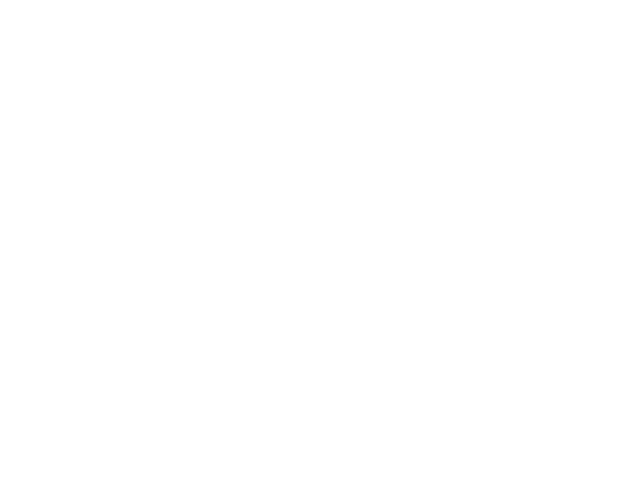

Text(0,0.5,'norm. event rate')

In [115]:
def put_in_place_rows(arr,xvals,tot_xvals):
    to_return = np.nan*np.ones((arr.shape[0],tot_xvals,arr.shape[2]))
    to_return[:,xvals] = arr
    return to_return

sdict = {}
cs = np.array(((),(2,5),(0,3)))

k = 1
sdict[keylist[k]] = np.array([5,8.2,13.5,22.2,36.5])
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,(1,2,4)][:,:,cs[k]]},{keylist[k]:ontarget[keylist[k]]},append_gray=False)
# plt.plot(cdict[keylist[k]],snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],snorm[:,0].mean(0),c='b')
snorm1 = put_in_place_rows(snorm,np.array((0,1,2)),3)

k = 2
sdict[keylist[k]] = np.array([7.5,15,30,60])
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,(0,1,2)][:,:,cs[k]]},{keylist[k]:ontarget[keylist[k]]},append_gray=False)
# plt.plot(cdict[keylist[k]],snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],snorm[:,0].mean(0),c='b')
snorm1 = np.vstack((snorm1,put_in_place_rows(snorm,np.array((0,1,2)),3)))
plt.figure()
lb,ub = ut.bootstrap(snorm1,pct=(2.5,97.5),fn=np.nanmean)
ut.plot_errorbar_hillel(np.array((8,14,33)),np.nanmean(snorm1[:,:,0],axis=0),lb[:,0],ub[:,0],c='k')
ut.plot_errorbar_hillel(np.array((8,14,33)),np.nanmean(snorm1[:,:,1],axis=0),lb[:,1],ub[:,1],c='r')
plt.ylim(-0.05,1.05)
plt.xlabel('size (deg.)')
plt.ylabel('norm. event rate')

In [50]:
k = 1
sdict[keylist[k]] = np.array([5,8.2,13.5,22.2,36.5])
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,(1,2,4)][:,:,cs[k]]},{keylist[k]:ontarget[keylist[k]]},append_gray=True)
# plt.plot(cdict[keylist[k]],snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],snorm[:,0].mean(0),c='b')
snorm1 = put_in_place_rows(snorm[:,:,1:],np.array((0,1,2,3)),4)

In [51]:
snorm.shape

(9, 4, 3)

<IPython.core.display.Javascript object>


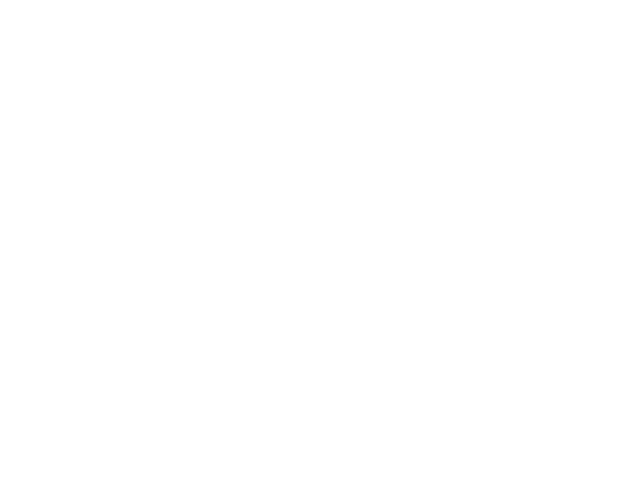

In [229]:
def put_in_place_rows(arr,xvals,tot_xvals):
    to_return = np.nan*np.ones((arr.shape[0],tot_xvals,arr.shape[2]))
    to_return[:,xvals] = arr
    return to_return

sdict = {}
cs = np.array(((),(0,2,5),(0,3)))

k = 1
sdict[keylist[k]] = np.array([5,8.2,13.5,22.2,36.5])
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,(1,2,4)][:,:,cs[k]]},{keylist[k]:ontarget[keylist[k]]},append_gray=True)
# plt.plot(cdict[keylist[k]],snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],snorm[:,0].mean(0),c='b')
snorm1 = put_in_place_rows(snorm[:,:,1:],np.array((0,1,2,3)),4)

k = 2
sdict[keylist[k]] = np.array([7.5,15,30,60])
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,(0,1,2)][:,:,cs[k]]},{keylist[k]:ontarget[keylist[k]]},append_gray=False)
# plt.plot(cdict[keylist[k]],snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],snorm[:,0].mean(0),c='b')
snorm1 = np.vstack((snorm1,put_in_place_rows(snorm,np.array((1,2,3)),4)))
plt.figure()
lb,ub = ut.bootstrap(snorm1,pct=(2.5,97.5),fn=np.nanmean)
ut.plot_errorbar_hillel(np.array((0,8,14,33)),np.nanmean(snorm1[:,:,0],axis=0),lb[:,0],ub[:,0],c='k',linestyle='dashed')
ut.plot_errorbar_hillel(np.array((0,8,14,33)),np.nanmean(snorm1[:,:,1],axis=0),lb[:,1],ub[:,1],c='k',linestyle='solid')
plt.ylim(-0.05,1.05)
plt.legend(['12%','100%'])
plt.xlabel('size (deg.)')
plt.ylabel('norm. event rate')
# plt.savefig('pc_size_tuning.pdf')
# plt.savefig('pc_size_tuning.eps')
savedict = {}
savedict['size'] = np.array((0,8,14,33))
savedict['rate'] = {}
savedict['opt'] = {}
savedict['rate']['lo'] = (np.nanmean(snorm1[:,:,0],axis=0),lb[:,0],ub[:,0])
savedict['rate']['hi'] = (np.nanmean(snorm1[:,:,1],axis=0),lb[:,1],ub[:,1])
savedict['opt']['hi'] = {'c':'k','linestyle':'solid'}
savedict['opt']['lo'] = {'c':'k','linestyle':'dashed'}
import pickle as pkl
with open('pc_size.p', 'wb') as handle:
    pkl.dump(savedict, handle, protocol=pkl.HIGHEST_PROTOCOL)

In [65]:
np.dstack((soriavg[keylist[k]][:,(0,1,2)][:,:,cs[k]],spont[keylist[k]])).shape

ValueError: all the input array dimensions except for the concatenation axis must match exactly

In [119]:
k = 2
sdict[keylist[k]] = np.array([7.5,15,30,60])
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,(0,1,2)][:,:,cs[k]]},{keylist[k]:ontarget[keylist[k]]},append_gray=False)

In [77]:
np.dstack((soriavg[keylist[k]],np.tile(spont[keylist[k]][:,np.newaxis,np.newaxis],(4,1))))[:,(1,2,4)][:,:,cs[k]]

ValueError: all the input array dimensions except for the concatenation axis must match exactly

In [81]:
k = 2
np.dstack((soriavg[keylist[k]],np.tile(spont[keylist[k]][:,np.newaxis,np.newaxis],(4,1))))

array([[[ 0.14242043,  0.12910239,  0.10179677,  0.15440593,  0.158867  ],
        [ 0.04072939,  0.06611488,  0.10907863,  0.06431858,  0.158867  ],
        [ 0.03650497,  0.10428748,  0.01841818,  0.00662601,  0.158867  ],
        [ 0.02825799,  0.04095486,  0.0376837 ,  0.0195724 ,  0.158867  ]],

       [[ 0.02948185,  0.02189127,  0.03342991,  0.04331928,  0.1150679 ],
        [ 0.0141475 ,  0.01090586,  0.02187375,  0.01217162,  0.1150679 ],
        [ 0.03231357,  0.01784582,  0.00365993,  0.01668853,  0.1150679 ],
        [ 0.00904079,  0.01195508,  0.01714605,  0.01083003,  0.1150679 ]],

       [[ 0.15393407,  0.10696624,  0.12971833,  0.08517265,  0.05877094],
        [ 0.08925299,  0.30196658,  0.47940345,  0.93812449,  0.05877094],
        [ 0.05325181,  0.06230641,  0.14968838,  0.13300934,  0.05877094],
        [ 0.05807549,  0.05242826,  0.05756416,  0.07850854,  0.05877094]],

       ..., 
       [[ 0.01735009,  0.00876784,  0.0124552 ,  0.00948912,  0.01150776],
      

In [80]:
k = 2

soriavg[keylist[k]].shape

(1116, 4, 4)

In [270]:
ontarget_ret_lax = {}
ontarget_ret_lax[keylist[0]],com = rt.ontarget_by_retinotopy(ret_vars[keylist[0]],ctr=np.array((-5,5)),rg=5,pcutoff=0.01)

/home/mossing/Documents/code/adesnal/retinotopy_analysis.py:260: RuntimeWarning: invalid value encountered in less
  return np.logical_and((xo+ctr_ret[0]-ctr[0])**2+(-yo+ctr_ret[1]-ctr[1])**2<rg**2,pval_ret<pcutoff),np.hstack((xo,yo))


In [271]:
ontarget_ret_lax[keylist[0]].sum()

377

/home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


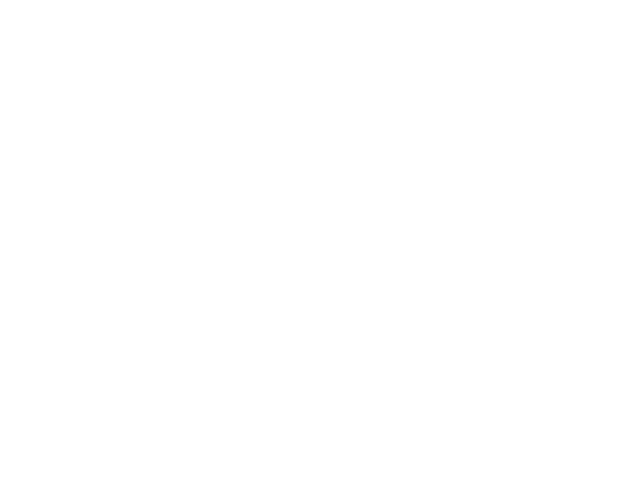

In [348]:
def put_in_place_rows(arr,xvals,tot_xvals):
    to_return = np.nan*np.ones((arr.shape[0],tot_xvals,arr.shape[2]))
    to_return[:,xvals] = arr
    return to_return

sdict = {}
cs = np.array(((),(0,2,3,4,5),(0,1,2,3,4)))

k = 1
sdict[keylist[k]] = np.array([5,8.2,13.5,22.2,36.5])
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,(1,2,4)][:,:,cs[k]]},{keylist[k]:ontarget[keylist[k]]},append_gray=True)
# plt.plot(cdict[keylist[k]],snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],snorm[:,0].mean(0),c='b')
snorm1 = put_in_place_rows(snorm[:,:,1:],np.array((0,1,2,3)),4)

k = 2
sdict[keylist[k]] = np.array([7.5,15,30,60])
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:np.dstack((np.tile(spont[keylist[k]][:,np.newaxis,np.newaxis],(4,1)),soriavg[keylist[k]]))[:,(0,1,2)][:,:,cs[k]]},{keylist[k]:ontarget[keylist[k]]},append_gray=True)
# plt.plot(cdict[keylist[k]],snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],snorm[:,0].mean(0),c='b')
snorm1 = np.vstack((snorm1,put_in_place_rows(snorm[:,:,1:],np.array((0,1,2,3)),4)))
plt.figure()
lb,ub = ut.bootstrap(snorm1,pct=(2.5,97.5),fn=np.nanmean)
c = [np.array((0.6,0.6,0.6)),np.array((0.4,0.4,0.4)),np.array((0.2,0.2,0.2)),np.array((0.0,0.0,0.0))]
for i in np.array((0,2,3)):
    plt.plot(0,0,c=c[i])
for i in np.array((0,2,3)):
    ut.plot_errorbar_hillel(np.array((0,8,14,33)),np.nanmean(snorm1[:,:,i],axis=0),lb[:,i],ub[:,i],c=c[i],linestyle='solid')
plt.ylim(-0.05,1.05)
plt.xlim(-2,39)
plt.legend(['12%','50%','100%'])
plt.xlabel('size (deg.)')
plt.ylabel('norm. event rate')
# plt.savefig('pc_size_tuning.pdf')
# plt.savefig('pc_size_tuning.eps')
savedict = {}
savedict['size'] = np.array((0,8,14,33))
savedict['rate'] = {}
savedict['opt'] = {}
savedict['rate']['lo'] = (np.nanmean(snorm1[:,:,0],axis=0),lb[:,0],ub[:,0])
savedict['rate']['hi'] = (np.nanmean(snorm1[:,:,1],axis=0),lb[:,1],ub[:,1])
savedict['opt']['hi'] = {'c':'k','linestyle':'solid'}
savedict['opt']['lo'] = {'c':'k','linestyle':'dashed'}
plt.savefig('pc_size_tuning_3.pdf')
plt.savefig('pc_size_tuning_3.eps')
import pickle as pkl
# with open('pc_size.p', 'wb') as handle:
#     pkl.dump(savedict, handle, protocol=pkl.HIGHEST_PROTOCOL)

/home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


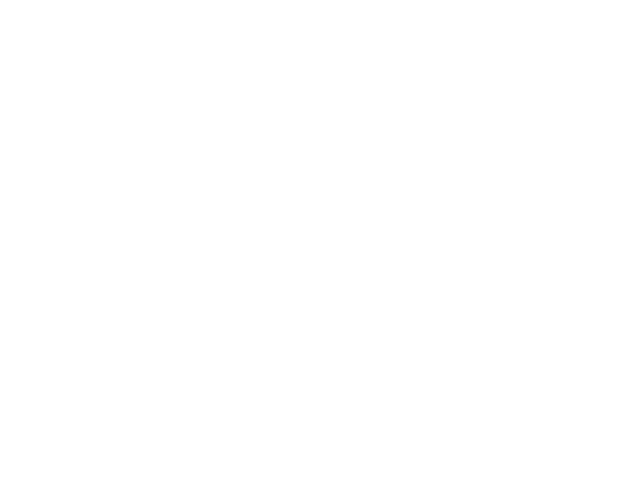

In [298]:
def put_in_place_rows(arr,xvals,tot_xvals):
    to_return = np.nan*np.ones((arr.shape[0],tot_xvals,arr.shape[2]))
    to_return[:,xvals] = arr
    return to_return

sdict = {}
cs = np.array(((),(0,2,3,4,5),(0,1,2,3,4)))

k = 1
sdict[keylist[k]] = np.array([5,8.2,13.5,22.2,36.5])
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,(1,2,4)][:,:,cs[k]]},{keylist[k]:ontarget[keylist[k]]},append_gray=True)
# plt.plot(cdict[keylist[k]],snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],snorm[:,0].mean(0),c='b')
snorm1 = put_in_place_rows(snorm[:,:,1:],np.array((0,1,2,3)),4)

k = 2
sdict[keylist[k]] = np.array([7.5,15,30,60])
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:np.dstack((np.tile(spont[keylist[k]][:,np.newaxis,np.newaxis],(4,1)),soriavg[keylist[k]]))[:,(0,1,2)][:,:,cs[k]]},{keylist[k]:ontarget[keylist[k]]},append_gray=True)
# plt.plot(cdict[keylist[k]],snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],snorm[:,0].mean(0),c='b')
snorm1 = np.vstack((snorm1,put_in_place_rows(snorm[:,:,1:],np.array((0,1,2,3)),4)))
plt.figure()
lb,ub = ut.bootstrap(snorm1,pct=(2.5,97.5),fn=np.nanmean)
c = [np.array((0.6,0.6,0.6)),np.array((0.4,0.4,0.4)),np.array((0.2,0.2,0.2)),np.array((0.0,0.0,0.0))]
for i in np.array((0,)):
    plt.plot(0,0,c=c[i])
for i in np.array((0,)):
    ut.plot_errorbar_hillel(np.array((0,8,14,33)),np.nanmean(snorm1[:,:,i],axis=0),lb[:,i],ub[:,i],c=c[i],linestyle='solid')
plt.ylim(-0.05,1.05)
plt.xlim(-2,39)
# plt.legend(['12%','50%','100%'])
plt.xlabel('size (deg.)')
plt.ylabel('norm. event rate')
# plt.savefig('pc_size_tuning.pdf')
# plt.savefig('pc_size_tuning.eps')
savedict = {}
savedict['size'] = np.array((0,8,14,33))
savedict['rate'] = {}
savedict['opt'] = {}
savedict['rate']['lo'] = (np.nanmean(snorm1[:,:,0],axis=0),lb[:,0],ub[:,0])
savedict['rate']['hi'] = (np.nanmean(snorm1[:,:,1],axis=0),lb[:,1],ub[:,1])
savedict['opt']['hi'] = {'c':'k','linestyle':'solid'}
savedict['opt']['lo'] = {'c':'k','linestyle':'dashed'}
plt.savefig('pc_size_tuning_12.pdf')
plt.savefig('pc_size_tuning_12.eps')
import pickle as pkl
# with open('pc_size.p', 'wb') as handle:
#     pkl.dump(savedict, handle, protocol=pkl.HIGHEST_PROTOCOL)

/home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


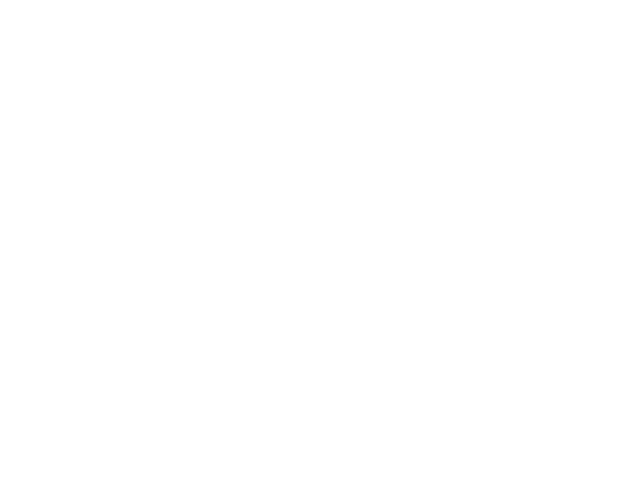

In [299]:
def put_in_place_rows(arr,xvals,tot_xvals):
    to_return = np.nan*np.ones((arr.shape[0],tot_xvals,arr.shape[2]))
    to_return[:,xvals] = arr
    return to_return

sdict = {}
cs = np.array(((),(0,2,3,4,5),(0,1,2,3,4)))

k = 1
sdict[keylist[k]] = np.array([5,8.2,13.5,22.2,36.5])
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,(1,2,4)][:,:,cs[k]]},{keylist[k]:ontarget[keylist[k]]},append_gray=True)
# plt.plot(cdict[keylist[k]],snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],snorm[:,0].mean(0),c='b')
snorm1 = put_in_place_rows(snorm[:,:,1:],np.array((0,1,2,3)),4)

k = 2
sdict[keylist[k]] = np.array([7.5,15,30,60])
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:np.dstack((np.tile(spont[keylist[k]][:,np.newaxis,np.newaxis],(4,1)),soriavg[keylist[k]]))[:,(0,1,2)][:,:,cs[k]]},{keylist[k]:ontarget[keylist[k]]},append_gray=True)
# plt.plot(cdict[keylist[k]],snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],snorm[:,0].mean(0),c='b')
snorm1 = np.vstack((snorm1,put_in_place_rows(snorm[:,:,1:],np.array((0,1,2,3)),4)))
plt.figure()
lb,ub = ut.bootstrap(snorm1,pct=(2.5,97.5),fn=np.nanmean)
c = [np.array((0.6,0.6,0.6)),np.array((0.4,0.4,0.4)),np.array((0.2,0.2,0.2)),np.array((0.0,0.0,0.0))]
for i in np.array((3,)):
    plt.plot(0,0,c=c[i])
for i in np.array((3,)):
    ut.plot_errorbar_hillel(np.array((0,8,14,33)),np.nanmean(snorm1[:,:,i],axis=0),lb[:,i],ub[:,i],c=c[i],linestyle='solid')
plt.ylim(-0.05,1.05)
plt.xlim(-2,39)
# plt.legend(['12%','50%','100%'])
plt.xlabel('size (deg.)')
plt.ylabel('norm. event rate')
# plt.savefig('pc_size_tuning.pdf')
# plt.savefig('pc_size_tuning.eps')
savedict = {}
savedict['size'] = np.array((0,8,14,33))
savedict['rate'] = {}
savedict['opt'] = {}
savedict['rate']['lo'] = (np.nanmean(snorm1[:,:,0],axis=0),lb[:,0],ub[:,0])
savedict['rate']['hi'] = (np.nanmean(snorm1[:,:,1],axis=0),lb[:,1],ub[:,1])
savedict['opt']['hi'] = {'c':'k','linestyle':'solid'}
savedict['opt']['lo'] = {'c':'k','linestyle':'dashed'}
plt.savefig('pc_size_tuning_100.pdf')
plt.savefig('pc_size_tuning_100.eps')
import pickle as pkl
# with open('pc_size.p', 'wb') as handle:
#     pkl.dump(savedict, handle, protocol=pkl.HIGHEST_PROTOCOL)

(160, 4, 4)
(160, 4, 2)
(160, 4, 2)


/home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


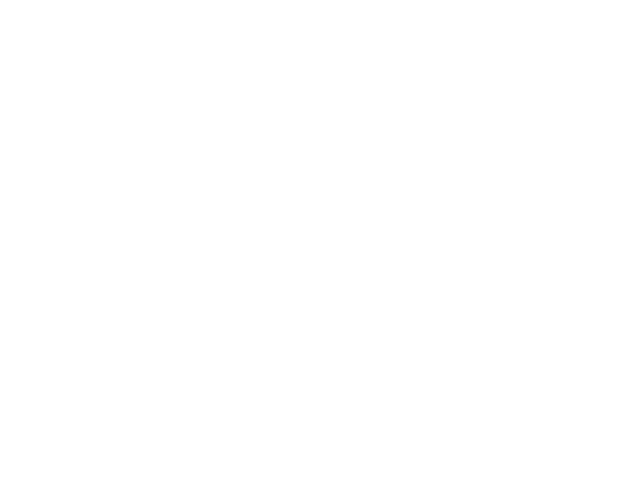

In [321]:
def put_in_place_rows(arr,xvals,tot_xvals):
    to_return = np.nan*np.ones((arr.shape[0],tot_xvals,arr.shape[2]))
    to_return[:,xvals] = arr
    return to_return

def put_in_place_rows_cols(arr,xvals,tot_xvals,yvals,tot_yvals):
    to_return = np.nan*np.ones((arr.shape[0],tot_xvals,tot_yvals))
    print(to_return.shape)
    print(arr.shape)
    print( to_return[:,xvals][:,:,yvals].shape)
    to_return[:,xvals][:,:,yvals] = arr
    return to_return

sdict = {}
cs = np.array(((0,4,5),(0,2,3,4,5),(0,1,2,3,4)))

k = 0
sdict[keylist[k]] = np.array([5,8.2,13.5,22.2,36.5])
lkat = ontarget_ret_lax[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,(1,2,4)][:,:,cs[k]]},{keylist[k]:ontarget[keylist[k]]},append_gray=True)
# plt.plot(cdict[keylist[k]],snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],snorm[:,0].mean(0),c='b')
snorm1 = put_in_place_rows_cols(snorm[:,:,1:],np.array((0,1,2,3)),4,np.array((0,1)),4)

k = 1
sdict[keylist[k]] = np.array([5,8.2,13.5,22.2,36.5])
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,(1,2,4)][:,:,cs[k]]},{keylist[k]:ontarget[keylist[k]]},append_gray=True)
# plt.plot(cdict[keylist[k]],snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],snorm[:,0].mean(0),c='b')
snorm1 = np.vstack((snorm1,put_in_place_rows(snorm[:,:,1:],np.array((0,1,2,3)),4)))

k = 2
sdict[keylist[k]] = np.array([7.5,15,30,60])
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:np.dstack((np.tile(spont[keylist[k]][:,np.newaxis,np.newaxis],(4,1)),soriavg[keylist[k]]))[:,(0,1,2)][:,:,cs[k]]},{keylist[k]:ontarget[keylist[k]]},append_gray=True)
# plt.plot(cdict[keylist[k]],snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],snorm[:,0].mean(0),c='b')
snorm1 = np.vstack((snorm1,put_in_place_rows(snorm[:,:,1:],np.array((0,1,2,3)),4)))
plt.figure()
lb,ub = ut.bootstrap(snorm1,pct=(2.5,97.5),fn=np.nanmean)
c = [np.array((0.6,0.6,0.6)),np.array((0.4,0.4,0.4)),np.array((0.2,0.2,0.2)),np.array((0.0,0.0,0.0))]
for i in np.array((0,2,3)):
    plt.plot(0,0,c=c[i])
for i in np.array((0,2,3)):
    ut.plot_errorbar_hillel(np.array((0,8,14,33)),np.nanmean(snorm1[:,:,i],axis=0),lb[:,i],ub[:,i],c=c[i],linestyle='solid')
plt.ylim(-0.05,1.05)
plt.legend(['12%','50%','100%'])
plt.xlabel('size (deg.)')
plt.ylabel('norm. event rate')
# plt.savefig('pc_size_tuning.pdf')
# plt.savefig('pc_size_tuning.eps')
savedict = {}
savedict['size'] = np.array((0,8,14,33))
savedict['rate'] = {}
savedict['opt'] = {}
savedict['rate']['lo'] = (np.nanmean(snorm1[:,:,0],axis=0),lb[:,0],ub[:,0])
savedict['rate']['hi'] = (np.nanmean(snorm1[:,:,1],axis=0),lb[:,1],ub[:,1])
savedict['opt']['hi'] = {'c':'k','linestyle':'solid'}
savedict['opt']['lo'] = {'c':'k','linestyle':'dashed'}
# plt.savefig('pc_size_tuning_3.pdf')
# plt.savefig('pc_size_tuning_3.eps')
import pickle as pkl
# with open('pc_size.p', 'wb') as handle:
#     pkl.dump(savedict, handle, protocol=pkl.HIGHEST_PROTOCOL)

In [326]:
normby

0.48662721249040741

In [344]:
k = 1
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]]},{keylist[k]:ontarget[keylist[k]]},append_gray=False)[:,(1,2,4)][:,:,cs[k]]
snorm.shape

(20, 3, 5)

(160, 4, 4)
(160, 4, 2)
(160, 4, 4)
[0 1 2 3]
[0 1]


/home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


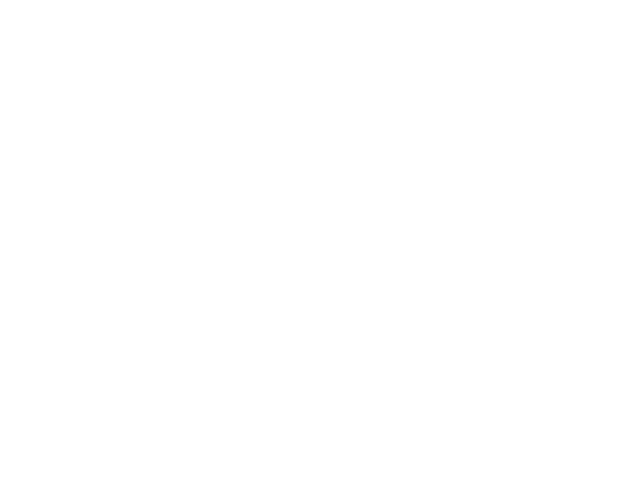

/home/mossing/Documents/code/adesnal/pyute.py:116: RuntimeWarning: Mean of empty slice
  stat = fn(resamp,axis=axis)
/home/mossing/anaconda3/lib/python3.6/site-packages/numpy/lib/function_base.py:4274: RuntimeWarning: Invalid value encountered in percentile
  interpolation=interpolation)
/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:53: RuntimeWarning: Mean of empty slice


In [347]:
def put_in_place_rows(arr,xvals,tot_xvals):
    to_return = np.nan*np.ones((arr.shape[0],tot_xvals,arr.shape[2]))
    to_return[:,xvals] = arr
    return to_return

def put_in_place_rows_cols(arr,xvals,tot_xvals,yvals,tot_yvals):
    to_return = np.nan*np.ones((arr.shape[0],tot_xvals,tot_yvals))
    print(to_return.shape)
    print(arr.shape)
    print( to_return[:,xvals].shape)
    print(xvals)
    print(yvals)
    to_return[:,:,yvals] = arr
    assert(np.logical_not(np.isnan(to_return[:,xvals][:,:,yvals])).sum())
    return to_return

sdict = {}
cs = np.array(((0,4,5),(2,3,4,5),(0,1,2,3)))

k = 0
sdict[keylist[k]] = np.array([5,8.2,13.5,22.2,36.5])
lkat = ontarget_ret_lax[keylist[k]]
thisoneworked0 = soriavg[keylist[2]][ontarget[keylist[2]],0].mean(0)
thisoneworked1 = soriavg[keylist[2]][ontarget[keylist[2]],1].mean(0)
normby = 0.5*(thisoneworked0[1]/thisoneworked0[3] + thisoneworked1[1]/thisoneworked1[3])

snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]]},{keylist[k]:ontarget[keylist[k]]},append_gray=True)[:,(0,2,3,5)][:,:,cs[k]]
# plt.plot(cdict[keylist[k]],snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],snorm[:,0].mean(0),c='b')
snorm1 = put_in_place_rows_cols(normby*snorm[:,:,1:],np.array((0,1,2,3)),4,np.array((0,1)),4)

k = 1
sdict[keylist[k]] = np.array([5,8.2,13.5,22.2,36.5])
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]]},{keylist[k]:ontarget[keylist[k]]},append_gray=False)[:,(1,2,4)][:,:,cs[k]]
# plt.plot(cdict[keylist[k]],snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],snorm[:,0].mean(0),c='b')
snorm1 = np.vstack((snorm1,put_in_place_rows(snorm[:,:,:],np.array((1,2,3)),4)))

k = 2
sdict[keylist[k]] = np.array([7.5,15,30,60])
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]]},{keylist[k]:ontarget[keylist[k]]},append_gray=False)[:,(0,1,2)][:,:,cs[k]]
# plt.plot(cdict[keylist[k]],snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],snorm[:,0].mean(0),c='b')
snorm1 = np.vstack((snorm1,put_in_place_rows(snorm[:,:,:],np.array((1,2,3)),4)))
plt.figure()
lb,ub = ut.bootstrap(snorm1,pct=(2.5,97.5),fn=np.nanmean)
c = [np.array((0.6,0.6,0.6)),np.array((0.4,0.4,0.4)),np.array((0.2,0.2,0.2)),np.array((0.0,0.0,0.0))]
for i in np.array((0,2,3)):
    plt.plot(0,0,c=c[i])
for i in np.array((0,2,3)):
    ut.plot_errorbar_hillel(np.array((0,8,14,33)),np.nanmean(snorm1[:,:,i],axis=0),lb[:,i],ub[:,i],c=c[i],linestyle='solid')
plt.ylim(-0.05,1.05)
plt.legend(['12%','50%','100%'])
plt.xlabel('size (deg.)')
plt.ylabel('norm. event rate')
# plt.savefig('pc_size_tuning.pdf')
# plt.savefig('pc_size_tuning.eps')
savedict = {}
savedict['size'] = np.array((0,8,14,33))
savedict['rate'] = {}
savedict['opt'] = {}
savedict['rate']['lo'] = (np.nanmean(snorm1[:,:,0],axis=0),lb[:,0],ub[:,0])
savedict['rate']['hi'] = (np.nanmean(snorm1[:,:,1],axis=0),lb[:,1],ub[:,1])
savedict['opt']['hi'] = {'c':'k','linestyle':'solid'}
savedict['opt']['lo'] = {'c':'k','linestyle':'dashed'}
# plt.savefig('pc_size_tuning_3.pdf')
# plt.savefig('pc_size_tuning_3.eps')
import pickle as pkl
# with open('pc_size.p', 'wb') as handle:
#     pkl.dump(savedict, handle, protocol=pkl.HIGHEST_PROTOCOL)

In [335]:
snorm.shape

(40, 3, 4)

In [334]:
snorm1.shape

(220, 4, 4)

In [332]:
put_in_place_rows_cols(normby*snorm[:,:,1:],np.array((0,1,2,3)),4,np.array((0,1)),4)

array([[[ 0.07684451,  0.07684451,  0.07684451],
        [ 0.05908987,  0.51738233,  0.68089084],
        [ 0.09670519,  0.56201815,  1.        ],
        [ 0.05892308,  0.34375737,  0.54984971]],

       [[ 0.00334965,  0.00334965,  0.00334965],
        [ 0.00569482,  0.33589737,  0.25927099],
        [ 0.00892889,  0.62138446,  0.56928478],
        [ 0.        ,  0.67419752,  0.84547069]],

       [[ 0.01307107,  0.01307107,  0.01307107],
        [ 0.00474111,  0.34048995,  0.24060205],
        [ 0.02585446,  0.1482898 ,  0.48689316],
        [ 0.        ,  0.47500096,  1.        ]],

       ..., 
       [[ 0.03035965,  0.03035965,  0.03035965],
        [ 0.01761406,  0.34334668,  0.58400215],
        [ 0.0562749 ,  0.5173047 ,  1.        ],
        [ 0.01073273,  0.54352295,  0.76190251]],

       [[ 0.15265841,  0.15265841,  0.15265841],
        [ 0.68394926,  0.86540173,  0.9535864 ],
        [ 0.06515467,  0.65126817,  1.        ],
        [ 0.00162999,  0.57298833,  0.75510635]]

In [104]:
put_in_place_rows(snorm[:,:,1:],np.array((0,1,2,3)),4).shape

(148, 4, 3)

In [172]:
slice(-2,None)

slice(-2, None, None)

In [170]:
np.arange(5)[slice(1,-1)]

array([1, 2, 3])

In [92]:
k = 1
sdict[keylist[k]] = np.array([5,8.2,13.5,22.2,36.5])
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,(1,2,4)][:,:,cs[k]]},{keylist[k]:ontarget[keylist[k]]},append_gray=True)

<IPython.core.display.Javascript object>


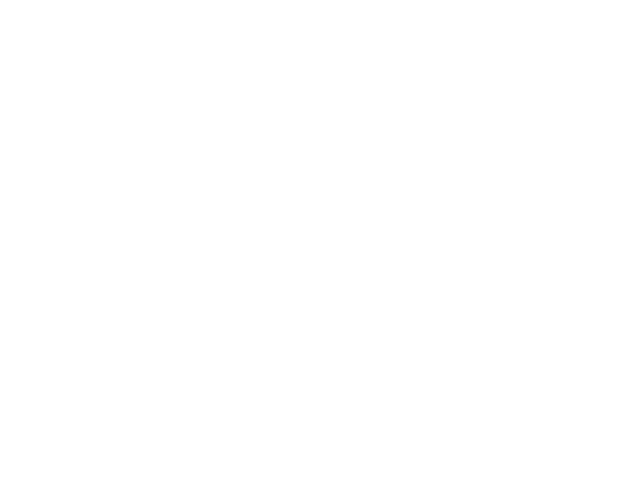

In [124]:
def put_in_place_rows(arr,xvals,tot_xvals):
    to_return = np.nan*np.ones((arr.shape[0],tot_xvals,arr.shape[2]))
    to_return[:,xvals] = arr
    return to_return

sdict = {}
cs = np.array(((),(0,3,4,5),(1,2,3)))

k = 1
sdict[keylist[k]] = np.array([5,8.2,13.5,22.2,36.5])
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,(1,2,4)][:,:,cs[k]]},{keylist[k]:ontarget[keylist[k]]},append_gray=True)
# plt.plot(cdict[keylist[k]],snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],snorm[:,0].mean(0),c='b')
snorm1 = put_in_place_rows(snorm[:,:,1:],np.array((0,1,2,3)),4)

k = 2
sdict[keylist[k]] = np.array([7.5,15,30,60])
lkat = ontarget[keylist[k]]
snorm = sca.get_norm_curves({keylist[k]:soriavg[keylist[k]][:,(0,1,2)][:,:,cs[k]]},{keylist[k]:ontarget[keylist[k]]},append_gray=False)
# plt.plot(cdict[keylist[k]],snorm[:,0].T,c='b',alpha=1e-1)
# plt.plot(cdict[keylist[k]],snorm[:,0].mean(0),c='b')
snorm1 = np.vstack((snorm1,put_in_place_rows(snorm,np.array((1,2,3)),4)))
plt.figure()
lb,ub = ut.bootstrap(snorm1,pct=(2.5,97.5),fn=np.nanmean)
ut.plot_errorbar_hillel(np.array((0,8,14,33)),np.nanmean(snorm1[:,:,0],axis=0),lb[:,0],ub[:,0],c=np.array((0.6,0.6,0.6)),linestyle='solid')
ut.plot_errorbar_hillel(np.array((0,8,14,33)),np.nanmean(snorm1[:,:,1],axis=0),lb[:,1],ub[:,1],c=np.array((0.4,0.4,0.4)),linestyle='solid')
ut.plot_errorbar_hillel(np.array((0,8,14,33)),np.nanmean(snorm1[:,:,2],axis=0),lb[:,2],ub[:,2],c=np.array((0,0,0)),linestyle='solid')
plt.ylim(-0.05,1.05)
plt.legend(['12%','100%'])
plt.xlabel('size (deg.)')
plt.ylabel('norm. event rate')
# plt.savefig('pc_size_tuning.pdf')
# plt.savefig('pc_size_tuning.eps')
savedict = {}
savedict['size'] = np.array((0,8,14,33))
savedict['rate'] = {}
savedict['opt'] = {}
savedict['rate']['lo'] = (np.nanmean(snorm1[:,:,0],axis=0),lb[:,0],ub[:,0])
savedict['rate']['hi'] = (np.nanmean(snorm1[:,:,1],axis=0),lb[:,1],ub[:,1])
savedict['opt']['hi'] = {'c':'k','linestyle':'solid'}
savedict['opt']['lo'] = {'c':'k','linestyle':'dashed'}
import pickle as pkl
# with open('pc_size.p', 'wb') as handle:
#     pkl.dump(savedict, handle, protocol=pkl.HIGHEST_PROTOCOL)

In [56]:
s = np.array([5,9.3,17.3,32.2]) #,60])
k = 0
theserows = np.array((4,5))
lkat = np.logical_and(ontarget[keylist[k]],ontarget_ret_lax)
snorm = (soriavg[keylist[k]]/soriavg[keylist[k]].max(1).max(1)[:,np.newaxis,np.newaxis])[:,:-1,:]
lbmn,ubmn = ut.bootstrap(snorm[lkat],np.mean,axis=0,pct=(2.5,97.5))

plt.figure(figsize=(4,4))
reload(ut)

fn_outer = lambda x,y,z,w: ut.plot_errorbar_hillel(x,y,z,w,linestyle='solid',c='b')
fn_inner = lambda x: x[:,theserows[1]].T
do_three(s,snorm[lkat].mean(0),lbmn,ubmn,fn_outer,fn_inner)

fn_outer = lambda x,y,z,w: ut.plot_errorbar_hillel(x,y,z,w,linestyle='dashed',c='c')
fn_inner = lambda x: x[:,theserows[0]].T
do_three(s,snorm[lkat].mean(0),lbmn,ubmn,fn_outer,fn_inner)

# ut.plot_errorbar_hillel(s,snorm[lkat].mean(0)[:,theserows[0]].T,lbmn[:,theserows[0]].T,ubmn[:,theserows[0]].T,linestyle='dashed')
plt.plot(30,0.5,linestyle='solid',c='b')
plt.plot(30,0.5,linestyle='dashed',c='c')
plt.plot(s,snorm[lkat][:,:,theserows[0]].T,alpha=0.04,c='c')
plt.plot(s,snorm[lkat][:,:,theserows[1]].T,alpha=0.02,c='b')
plt.xlabel('size (deg.)')
plt.ylabel('norm. event rate')
plt.legend(['25% contrast','12% contrast'])
plt.axis('tight')
whitespace = 0.05
plt.ylim(0-whitespace,1+whitespace)
# plt.savefig('pc_12_50_size_tuning_curves.pdf')

s = np.array([5,8.2,13.5,22.2,36.5]) #,60])
k = 1
theserows = np.array((2,5))
lkat = ontarget[keylist[k]]
snorm = (soriavg[keylist[k]]/soriavg[keylist[k]].max(1).max(1)[:,np.newaxis,np.newaxis])[:,:-1,:]
lbmn,ubmn = ut.bootstrap(snorm[lkat],np.mean,axis=0,pct=(2.5,97.5))

plt.figure(figsize=(4,4))
reload(ut)

fn_outer = lambda x,y,z,w: ut.plot_errorbar_hillel(x,y,z,w,linestyle='solid',c='b')
fn_inner = lambda x: x[:,theserows[1]].T
do_three(s,snorm[lkat].mean(0),lbmn,ubmn,fn_outer,fn_inner)

fn_outer = lambda x,y,z,w: ut.plot_errorbar_hillel(x,y,z,w,linestyle='dashed',c='c')
fn_inner = lambda x: x[:,theserows[0]].T
do_three(s,snorm[lkat].mean(0),lbmn,ubmn,fn_outer,fn_inner)

# ut.plot_errorbar_hillel(s,snorm[lkat].mean(0)[:,theserows[0]].T,lbmn[:,theserows[0]].T,ubmn[:,theserows[0]].T,linestyle='dashed')
plt.plot(30,0.5,linestyle='solid',c='b')
plt.plot(30,0.5,linestyle='dashed',c='c')
plt.plot(s,snorm[lkat][:,:,theserows[0]].T,alpha=0.04,c='c')
plt.plot(s,snorm[lkat][:,:,theserows[1]].T,alpha=0.02,c='b')
plt.xlabel('size (deg.)')
plt.ylabel('norm. event rate')
plt.legend(['25% contrast','12% contrast'])
plt.axis('tight')
whitespace = 0.05
plt.ylim(0-whitespace,1+whitespace)

s = np.array([7.5,15,30]) #,60])
k = 2
theserows = np.array((0,3))
lkat = ontarget[keylist[k]]
snorm = (soriavg[keylist[k]]/soriavg[keylist[k]].max(1).max(1)[:,np.newaxis,np.newaxis])[:,:-1,:]
lbmn,ubmn = ut.bootstrap(snorm[lkat],np.mean,axis=0,pct=(2.5,97.5))

plt.figure(figsize=(4,4))
reload(ut)

fn_outer = lambda x,y,z,w: ut.plot_errorbar_hillel(x,y,z,w,linestyle='solid',c='b')
fn_inner = lambda x: x[:,theserows[1]].T
do_three(s,snorm[lkat].mean(0),lbmn,ubmn,fn_outer,fn_inner)

fn_outer = lambda x,y,z,w: ut.plot_errorbar_hillel(x,y,z,w,linestyle='dashed',c='c')
fn_inner = lambda x: x[:,theserows[0]].T
do_three(s,snorm[lkat].mean(0),lbmn,ubmn,fn_outer,fn_inner)

# ut.plot_errorbar_hillel(s,snorm[lkat].mean(0)[:,theserows[0]].T,lbmn[:,theserows[0]].T,ubmn[:,theserows[0]].T,linestyle='dashed')
plt.plot(30,0.5,linestyle='solid',c='b')
plt.plot(30,0.5,linestyle='dashed',c='c')
plt.plot(s,snorm[lkat][:,:,theserows[0]].T,alpha=0.04,c='c')
plt.plot(s,snorm[lkat][:,:,theserows[1]].T,alpha=0.02,c='b')
plt.xlabel('size (deg.)')
plt.ylabel('norm. event rate')
plt.legend(['25% contrast','12% contrast'])
plt.axis('tight')
whitespace = 0.05
plt.ylim(0-whitespace,1+whitespace)

NameError: name 'ontarget_ret_lax' is not defined

In [507]:
snorm.shape

(661, 5, 6)

/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in true_divide
  """


<IPython.core.display.Javascript object>


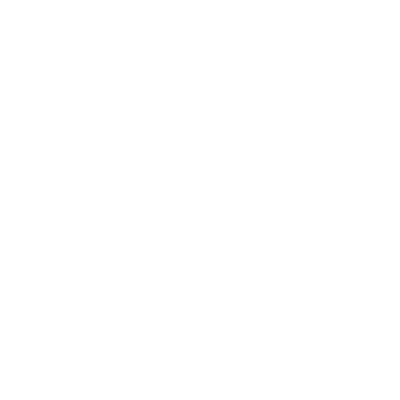

<IPython.core.display.Javascript object>


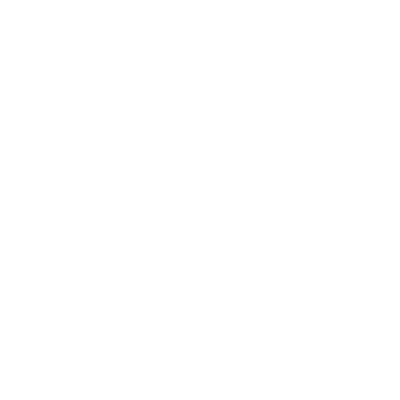

(-0.05, 1.05)

In [511]:
s = np.array([5,8.2,13.5,22.2,36.5]) #,60])
k = 1
theserows = np.array((2,3))
lkat = ontarget[keylist[k]]
snorm = (soriavg[keylist[k]]/soriavg[keylist[k]].max(1).max(1)[:,np.newaxis,np.newaxis])[:,:-1,:]
lbmn,ubmn = ut.bootstrap(snorm[lkat],np.mean,axis=0,pct=(2.5,97.5))

plt.figure(figsize=(4,4))
reload(ut)

fn_outer = lambda x,y,z,w: ut.plot_errorbar_hillel(x,y,z,w,linestyle='solid',c='b')
fn_inner = lambda x: x[:,theserows[1]].T
do_three(s,snorm[lkat].mean(0),lbmn,ubmn,fn_outer,fn_inner)

fn_outer = lambda x,y,z,w: ut.plot_errorbar_hillel(x,y,z,w,linestyle='dashed',c='c')
fn_inner = lambda x: x[:,theserows[0]].T
do_three(s,snorm[lkat].mean(0),lbmn,ubmn,fn_outer,fn_inner)

# ut.plot_errorbar_hillel(s,snorm[lkat].mean(0)[:,theserows[0]].T,lbmn[:,theserows[0]].T,ubmn[:,theserows[0]].T,linestyle='dashed')
plt.plot(30,0.5,linestyle='solid',c='b')
plt.plot(30,0.5,linestyle='dashed',c='c')
plt.plot(s,snorm[lkat][:,:,theserows[0]].T,alpha=0.04,c='c')
plt.plot(s,snorm[lkat][:,:,theserows[1]].T,alpha=0.02,c='b')
plt.xlabel('size (deg.)')
plt.ylabel('norm. event rate')
plt.legend(['25% contrast','12% contrast'])
plt.axis('tight')
whitespace = 0.05
plt.ylim(0-whitespace,1+whitespace)


<IPython.core.display.Javascript object>


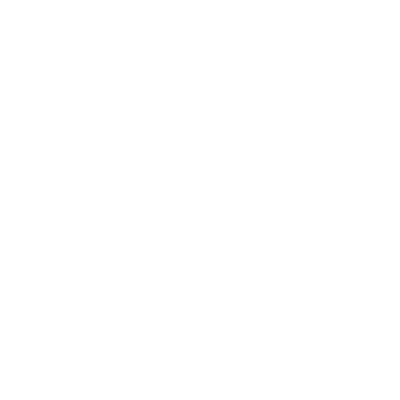

(-0.05, 1.05)

In [505]:
s = np.array([7.5,15,30]) #,60])
k = 2
theserows = np.array((0,1))
lkat = ontarget[keylist[k]]
snorm = (soriavg[keylist[k]]/soriavg[keylist[k]].max(1).max(1)[:,np.newaxis,np.newaxis])[:,:-1,:]
lbmn,ubmn = ut.bootstrap(snorm[lkat],np.mean,axis=0,pct=(2.5,97.5))

plt.figure(figsize=(4,4))
reload(ut)

fn_outer = lambda x,y,z,w: ut.plot_errorbar_hillel(x,y,z,w,linestyle='solid',c='b')
fn_inner = lambda x: x[:,theserows[1]].T
do_three(s,snorm[lkat].mean(0),lbmn,ubmn,fn_outer,fn_inner)

fn_outer = lambda x,y,z,w: ut.plot_errorbar_hillel(x,y,z,w,linestyle='dashed',c='c')
fn_inner = lambda x: x[:,theserows[0]].T
do_three(s,snorm[lkat].mean(0),lbmn,ubmn,fn_outer,fn_inner)

# ut.plot_errorbar_hillel(s,snorm[lkat].mean(0)[:,theserows[0]].T,lbmn[:,theserows[0]].T,ubmn[:,theserows[0]].T,linestyle='dashed')
plt.plot(30,0.5,linestyle='solid',c='b')
plt.plot(30,0.5,linestyle='dashed',c='c')
plt.plot(s,snorm[lkat][:,:,theserows[0]].T,alpha=0.04,c='c')
plt.plot(s,snorm[lkat][:,:,theserows[1]].T,alpha=0.02,c='b')
plt.xlabel('size (deg.)')
plt.ylabel('norm. event rate')
plt.legend(['25% contrast','12% contrast'])
plt.axis('tight')
whitespace = 0.05
plt.ylim(0-whitespace,1+whitespace)

In [553]:
snorm[lkat].mean(0)[1:3,theserows[0]].T

array([ 0.06579711,  0.16212505])

<IPython.core.display.Javascript object>


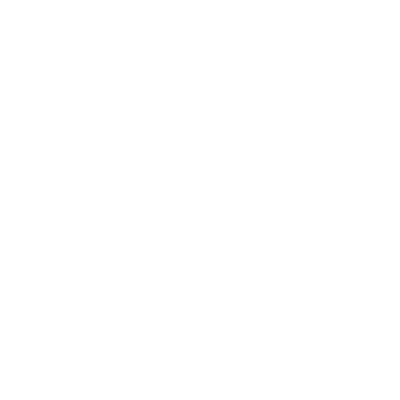

/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in true_divide
  import sys


(-5.6999999999999993, 47.200000000000003)

In [575]:
# plt.figure(figsize=(4,4))
# reload(ut)

# s = np.array([5,9.3,17.3,32.2,60])
# theserows = np.array((2,4))
# lkat = np.logical_and(ontarget[keylist[0]],ontarget_ret_lax)
# snorm = (soriavg[keylist[0]]/soriavg[keylist[0]].max(1).max(1)[:,np.newaxis,np.newaxis])
# lbmn,ubmn = ut.bootstrap(snorm[lkat],np.mean,axis=0,pct=(16,84))

# fn_outer = lambda x,y,z,w: ut.plot_errorbar_hillel(x,y,z,w,linestyle='solid',c='b')
# fn_inner = lambda x: x[np.array((1,3)),theserows[1]].T
# do_three(s[np.array((1,3))],snorm[lkat].mean(0),lbmn,ubmn,fn_outer,fn_inner)

# fn_outer = lambda x,y,z,w: ut.plot_errorbar_hillel(x,y,z,w,linestyle='dashed',c='c')
# fn_inner = lambda x: x[np.array((1,3)),theserows[0]].T
# do_three(s[np.array((1,3))],snorm[lkat].mean(0),lbmn,ubmn,fn_outer,fn_inner)

# # ut.plot_errorbar_hillel(s,snorm[lkat].mean(0)[:,theserows[0]].T,lbmn[:,theserows[0]].T,ubmn[:,theserows[0]].T,linestyle='dashed')
# plt.plot(12,0.5,linestyle='solid',c='b')
# plt.plot(12,0.5,linestyle='dashed',c='c')
# plt.plot(s[np.array((1,3))],snorm[lkat][:,np.array((1,3)),theserows[0]].T,alpha=0.04,c='c')
# plt.plot(s[np.array((1,3))],snorm[lkat][:,np.array((1,3)),theserows[1]].T,alpha=0.02,c='b')
# plt.xlabel('size (deg.)')
# plt.ylabel('norm. event rate')
# plt.legend(['50% contrast','12% contrast'])
# whitespace = 15
# plt.xlim((s[1]-whitespace,s[3]+whitespace))
# # plt.savefig('pc_12_50_zoomed.pdf')

<IPython.core.display.Javascript object>


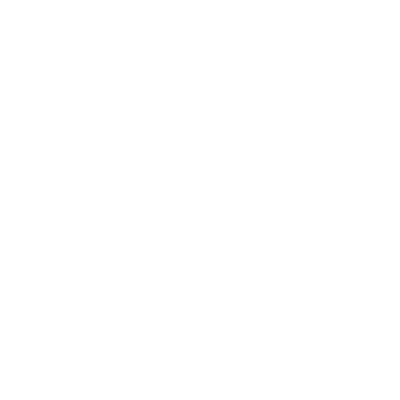

/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in true_divide
  import sys


(-0.05, 1.05)

In [639]:
plt.figure(figsize=(4,4))
reload(ut)

s = np.array([5,9.3,17.3,32.2,60])
theserows = np.array((2,4))
lkat = np.logical_and(ontarget[keylist[0]],ontarget_ret_lax)
snorm = (soriavg[keylist[0]]/soriavg[keylist[0]].max(1).max(1)[:,np.newaxis,np.newaxis])
lbmn,ubmn = ut.bootstrap(snorm[lkat],np.mean,axis=0,pct=(16,84))

fn_outer = lambda x,y,z,w: ut.plot_errorbar_hillel(x,y,z,w,linestyle='solid',c='b')
fn_inner = lambda x: x[1:3,theserows[1]].T
do_three(s[1:3],snorm[lkat].mean(0),lbmn,ubmn,fn_outer,fn_inner)

fn_outer = lambda x,y,z,w: ut.plot_errorbar_hillel(x,y,z,w,linestyle='dashed',c='c')
fn_inner = lambda x: x[1:3,theserows[0]].T
do_three(s[1:3],snorm[lkat].mean(0),lbmn,ubmn,fn_outer,fn_inner)

# ut.plot_errorbar_hillel(s,snorm[lkat].mean(0)[:,theserows[0]].T,lbmn[:,theserows[0]].T,ubmn[:,theserows[0]].T,linestyle='dashed')
plt.plot(12,0.5,linestyle='solid',c='b')
plt.plot(12,0.5,linestyle='dashed',c='c')
plt.plot(s[1:3],snorm[lkat][:,np.array((1,3)),theserows[0]].T,alpha=0.04,c='c')
plt.plot(s[1:3],snorm[lkat][:,np.array((1,3)),theserows[1]].T,alpha=0.02,c='b')
plt.xlabel('size (deg.)')
plt.ylabel('norm. event rate')
plt.legend(['50% contrast','12% contrast'])
whitespace = 10
plt.xlim((s[1]-whitespace,s[2]+whitespace))
whitespace = 0.05
plt.ylim(0-whitespace,1+whitespace)

<IPython.core.display.Javascript object>


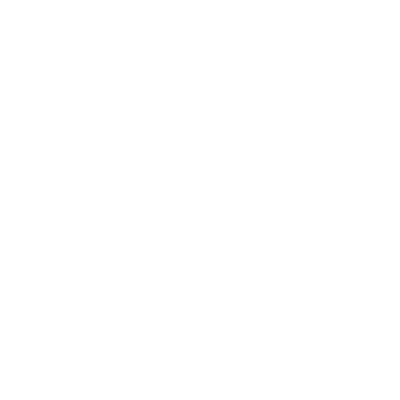

In [641]:
def snorm_four_pts(soriavg,pts,lkat):
    keylist = list(lkat.keys())
    snorm = np.array(())
    for key in keylist:
        biny = np.in1d(np.arange(soriavg[key].shape[1]),pts[key][:2])
        binx = np.in1d(np.arange(soriavg[key].shape[2]),pts[key][2:])
        to_add = soriavg[key][lkat[key]][:,biny][:,:,binx]
        to_add = to_add/soriavg[key][lkat[key]].max(1).max(1)[:,np.newaxis,np.newaxis]
        if snorm.size:
            snorm = np.vstack((snorm,to_add))
        else:
            snorm = to_add
    return snorm

plt.figure(figsize=(4,4))

pts = {}
pts[keylist[0]] = np.array((1,3,2,4))
pts[keylist[1]] = np.array((0,2,0,2))
lkat = {}
lkat[keylist[0]] = np.logical_and(ontarget[keylist[0]],ontarget_ret_lax)
lkat[keylist[1]] = ontarget[keylist[1]]
snorm = snorm_four_pts(soriavg,pts,lkat)
lbmn,ubmn = ut.bootstrap(snorm,np.mean,axis=0,pct=(16,84))

fn_outer = lambda x,y,z,w: ut.plot_errorbar_hillel(x,y,z,w,linestyle='solid',c='b')
fn_inner = lambda x: x[:,1]
do_three(np.array((0,1)),snorm.mean(0),lbmn,ubmn,fn_outer,fn_inner)

fn_outer = lambda x,y,z,w: ut.plot_errorbar_hillel(x,y,z,w,linestyle='dashed',c='c')
fn_inner = lambda x: x[:,0]
do_three(np.array((0,1)),snorm.mean(0),lbmn,ubmn,fn_outer,fn_inner)

plt.plot(0.5,0.5,linestyle='solid',c='b')
plt.plot(0.5,0.5,linestyle='dashed',c='c')
plt.plot(np.array((0,1)),snorm[:,:,0].T,alpha=0.04,c='c')
plt.plot(np.array((0,1)),snorm[:,:,1].T,alpha=0.02,c='b')
plt.xlabel('size (deg.)')
plt.ylabel('norm. event rate')
plt.legend(['50% contrast','12% contrast'])
whitespace = 0.5
plt.xlim((-whitespace,1+whitespace))
plt.xticks((0,1))
plt.gca().set_xticklabels(('7-10 deg.','30-37 deg.'))
whitespace = 0.05
plt.ylim(0-whitespace,1+whitespace)
plt.savefig('pc_12_50_zoomed.pdf')

In [606]:
lbmn.shape

(2, 2)

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

In [596]:
key = keylist[0]
biny = np.in1d(np.arange(soriavg[key].shape[1]),pts[key][:2])
binx = np.in1d(np.arange(soriavg[key].shape[2]),pts[key][2:])
to_add = soriavg[key][lkat[key]][:,biny][:,:,binx]

In [597]:
to_add.shape

(94, 2, 2)

In [588]:
soriavg[key][lkat[key]].shape

(94, 5, 6)

In [475]:
pdb.pm()

> /home/mossing/anaconda3/lib/python3.6/site-packages/numpy/lib/stride_tricks.py(184)_broadcast_shape()
-> b = np.broadcast(*args[:32])
(Pdb) u
> /home/mossing/anaconda3/lib/python3.6/site-packages/numpy/lib/stride_tricks.py(249)broadcast_arrays()
-> shape = _broadcast_shape(*args)
(Pdb) u
> /home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/lines.py(661)recache()
-> self._xy = np.column_stack(np.broadcast_arrays(x, y)).astype(float)
(Pdb) u
> /home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/lines.py(951)get_path()
-> self.recache()
(Pdb) u
> /home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_base.py(1781)_update_line_limits()
-> path = line.get_path()
(Pdb) u
> /home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_base.py(1759)add_line()
-> self._update_line_limits(line)
(Pdb) u
> /home/mossing/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py(2965)errorbar()
-> self.add_line(data_line)
(Pdb) u
> /home/mossing/ana

<IPython.core.display.Javascript object>


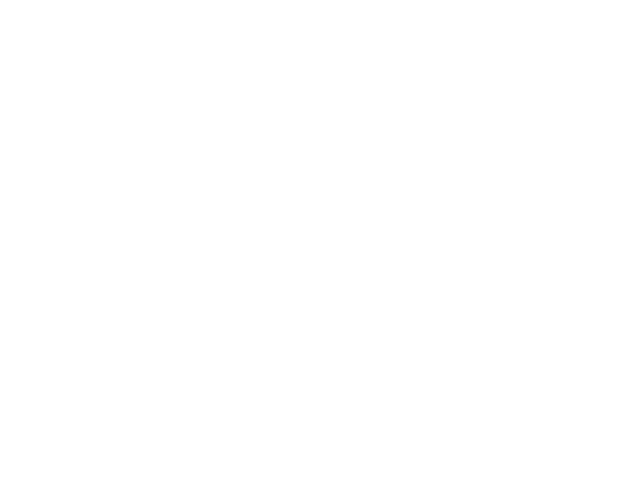

In [473]:
plt.figure()
reload(ut)
for i,key in enumerate(keylist):
    plt.subplot(1,2,i+1)
    plt.plot(soriavg[key][ontarget[key]].mean(0))

<IPython.core.display.Javascript object>


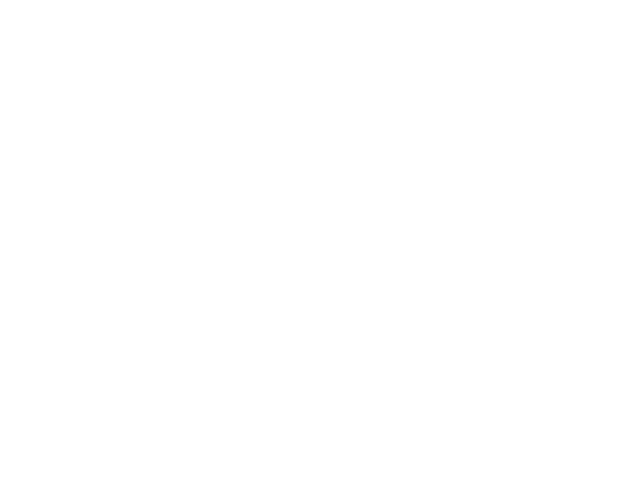

/home/mossing/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: Mean of empty slice
  


In [353]:
plt.figure()
plt.plot(np.nanmean(np.nanmean(ub[keylist[0]][ontarget_ret_strict],0),1).T)

In [350]:
lb[keylist[0]].shape

(1225, 4, 5, 6)

In [213]:
k = 0
soriavg[keylist[k]][ontarget[keylist[k]]].mean(0).shape

(5, 6)

In [30]:
keylist = list(ontarget.keys())

In [31]:
def add_to_array(starting,to_add):
    if starting.size:
        return np.concatenate((starting,to_add),axis=0)
    else:
        return to_add

<IPython.core.display.Javascript object>


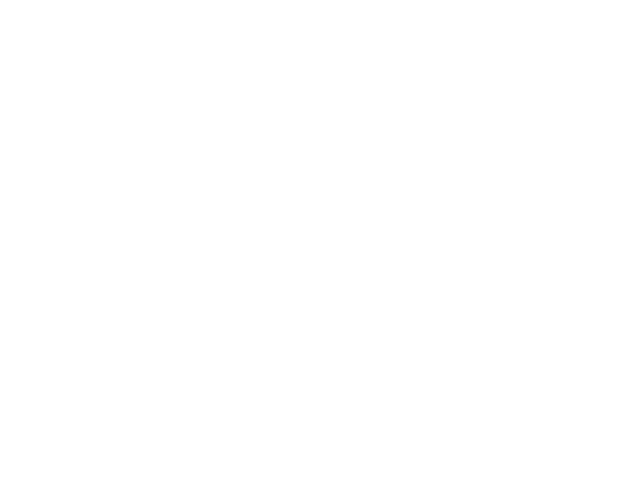

In [32]:
plt.figure()
XX = np.array(())
YY = np.array(())
for key in keylist:
        vals = soriavg[key].copy() #[ontarget[key]].copy()
        mx = 1 #vals.max()[np.newaxis,np.newaxis,np.newaxis]
        vals = vals/mx
#         xx = spont[key][ontarget[key]]/mx
        xx = vals[:,-1,-1]
        yy = vals[:,1,-1]
        plt.scatter(xx,yy,s=0.5)  # np.random.permutation(vals.shape[0])
        XX = add_to_array(XX,xx)
        YY = add_to_array(YY,yy)

<IPython.core.display.Javascript object>


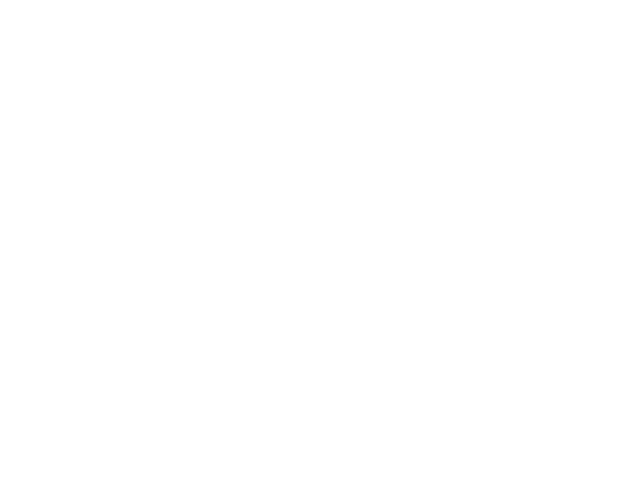

In [33]:
plt.figure()
XX = np.array(())
YY = np.array(())
for key in keylist:
        vals = soriavg[key][ontarget[key]].copy()
        mx = vals.max()[np.newaxis,np.newaxis,np.newaxis]
        vals = vals/mx
        xx = spont[key][ontarget[key]]/mx
        yy = vals[:,1,-1]
        plt.scatter(xx,yy,s=0.5)  # np.random.permutation(vals.shape[0])
        XX = add_to_array(XX,xx)
        YY = add_to_array(YY,yy)

<IPython.core.display.Javascript object>


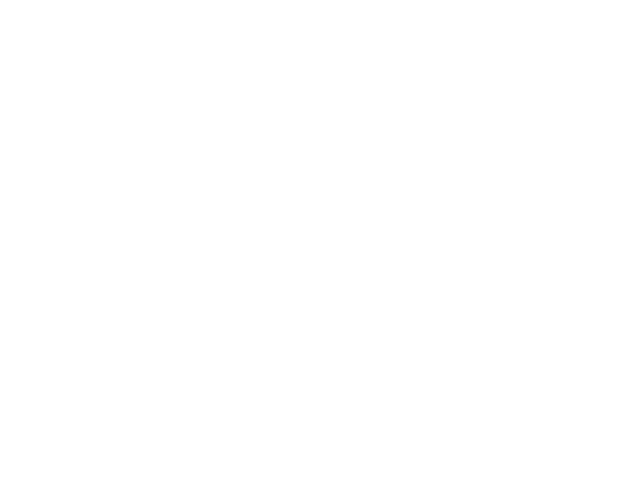

In [34]:
matdict = {}
matdict['dataX'] = XX
matdict['dataY'] = YY
matdict['labelX'] = 'inferred event rate 0% contrast'
matdict['labelY'] = 'inferred event rate 100% contrast'
plt.figure()
plt.scatter(matdict['dataX'],matdict['dataY'],s=5)
# matdict['x'] = 100*ucontrast
# sio.savemat('updated_pc_vip_15deg_0_100.mat',matdict)

<IPython.core.display.Javascript object>


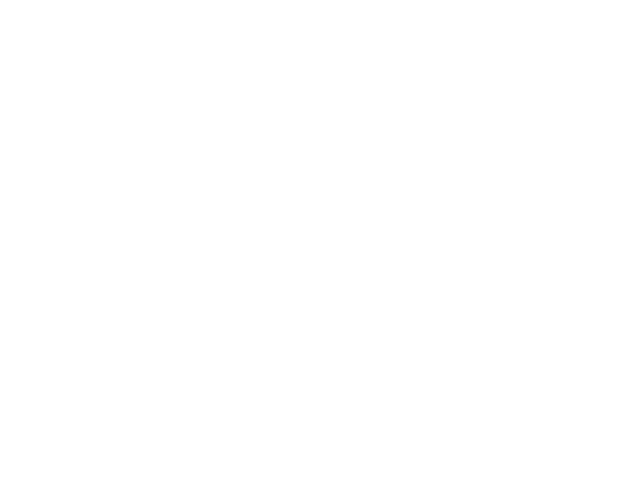

In [55]:
plt.figure()
XX = np.array(())
YY = np.array(())
for key in keylist:
        vals = soriavg[key][ontarget[key]].copy()
        mx = 1 #vals.max()[np.newaxis,np.newaxis,np.newaxis]
        vals = vals/mx
        xx = spont[key][ontarget[key]]/mx
        yy = vals[:,1,-1]
        plt.scatter(xx,yy,s=0.5)  # np.random.permutation(vals.shape[0])
        XX = add_to_array(XX,xx)
        YY = add_to_array(YY,yy)

<IPython.core.display.Javascript object>


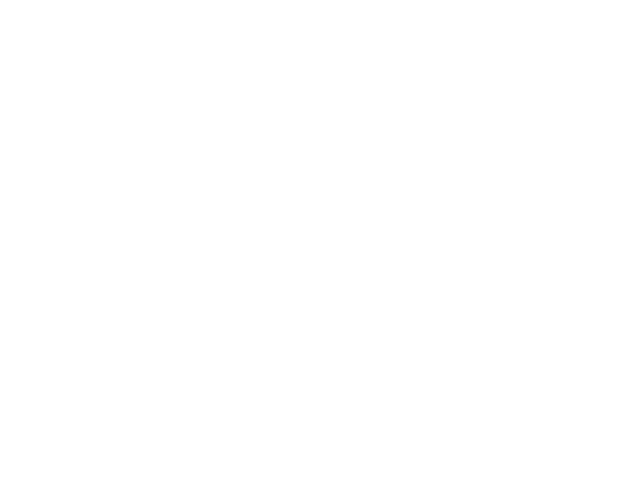

In [56]:
matdict = {}
matdict['dataX'] = XX
matdict['dataY'] = YY
matdict['labelX'] = 'inferred event rate 0% contrast'
matdict['labelY'] = 'inferred event rate 100% contrast'
plt.figure()
plt.scatter(matdict['dataX'],matdict['dataY'],s=5)
# matdict['x'] = 100*ucontrast
# sio.savemat('updated_pc_vip_15deg_0_100_non_norm.mat',matdict)

<IPython.core.display.Javascript object>


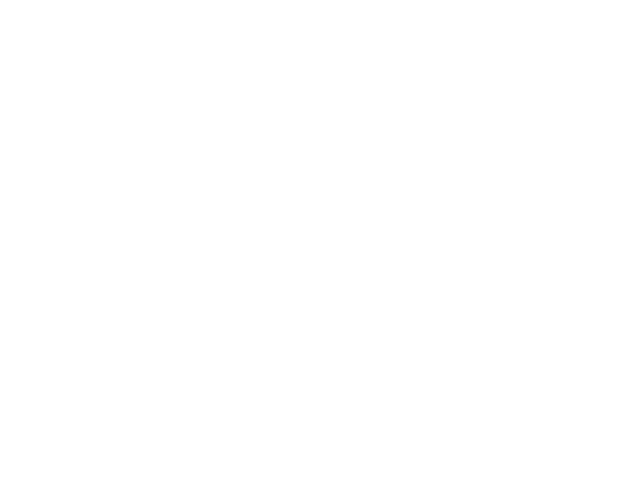

In [57]:
plt.figure()
plt.scatter(XX,YY)

In [38]:
pval[thisfold].min()

3.098484889398769e-08

In [39]:
(~ontarget[thisfold]).sum()

791

In [40]:
for key in ontarget.keys():
    print(ontarget[key].sum())

325


<IPython.core.display.Javascript object>


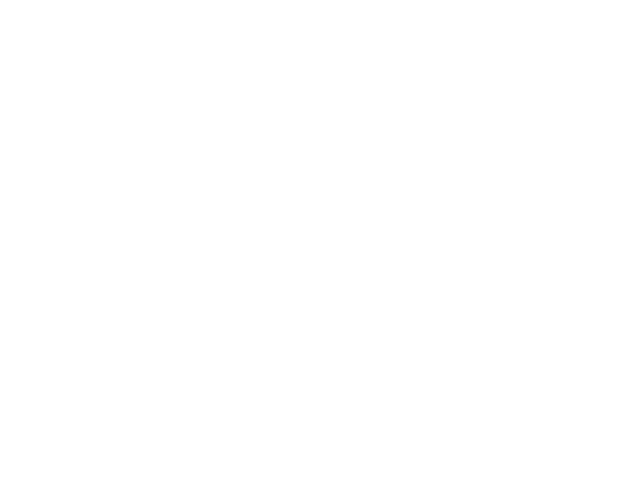

In [58]:
plt.figure()
for key in pval.keys():
    for i in range(pval[key].shape[0]):
        plt.scatter(np.array((0,1,2,3))+0.1*np.random.randn(4),-np.log10(pval[key][i]),s=1,c='g',alpha=0.5)

In [59]:
ucontrast = np.array([0,0.06,0.12,0.25,0.5,1])

In [60]:
lb[thisfold].shape

(1116, 4, 4, 4)

In [61]:
def plot_errorbars(x,mn_tgt,lb_tgt,ub_tgt):
    errorplus = ub_tgt-mn_tgt
    errorminus = mn_tgt-lb_tgt
    errors = np.concatenate((errorplus[np.newaxis],errorminus[np.newaxis]),axis=0)
    for i in range(mn_tgt.shape[0]):
        plt.errorbar(x,mn_tgt[i],yerr=errors[:,i,:])

In [62]:
list(ontarget.keys())

['180216/M7307/']

In [63]:
keylist = list(ontarget.keys())
# keylist.remove(keylist[3])
# keylist.remove(keylist[0])

In [64]:
ucontrast

array([ 0.  ,  0.06,  0.12,  0.25,  0.5 ,  1.  ])

In [65]:
spont[thisfold].shape

(1116,)

<IPython.core.display.Javascript object>


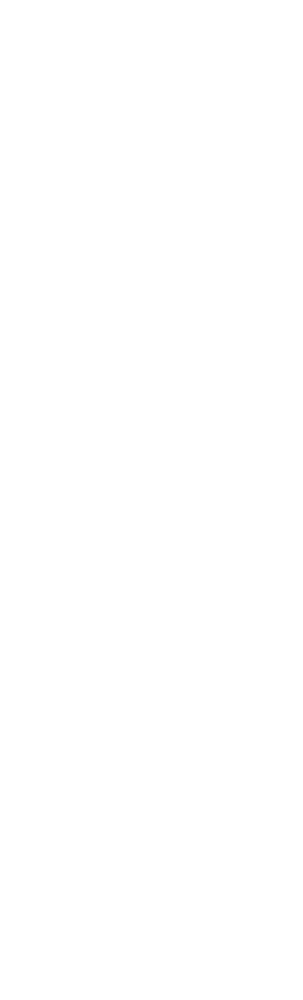

In [66]:
nvals = 4
contrast_w_0 = np.concatenate(((0,),ucontrast[-nvals:]))
for key in keylist:
    grid_dims = np.array((np.ceil(ontarget[key].sum()/10),10))
    plt.figure(figsize=tuple(0.8*grid_dims[::-1]))
    for k in range(ontarget[key].sum()):
        plt.subplot(grid_dims[0],grid_dims[1],k+1)
        nvals = soriavg[key].shape[-1]
        nsizes = soriavg[key].shape[-2]
        spontvect = spont[key][ontarget[key]][k]*np.ones((nsizes,))
        datatemp = np.concatenate((spontvect[:,np.newaxis],soriavg[key][ontarget[key]][k]),axis=1)
        lbtemp = np.concatenate((spontvect[:,np.newaxis],lb[key][ontarget[key]][k].mean(0)),axis=1)
        ubtemp = np.concatenate((spontvect[:,np.newaxis],ub[key][ontarget[key]][k].mean(0)),axis=1)
        plot_errorbars(100*contrast_w_0,datatemp,lbtemp,ubtemp)
        plt.axis('off')

<IPython.core.display.Javascript object>


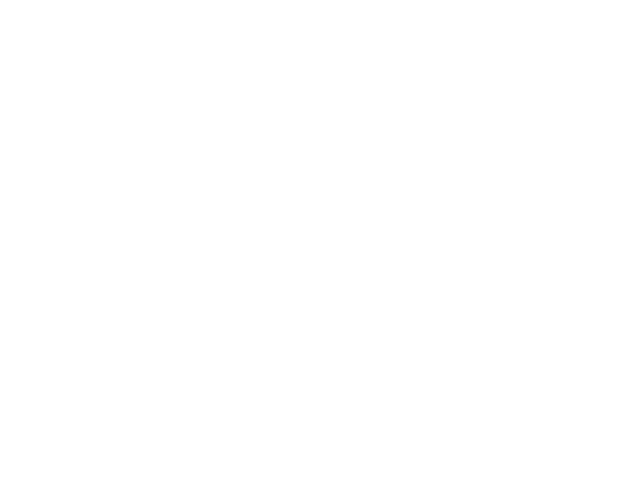

In [79]:
gd = (pval[thisfold].min(1)*4<0.01)
plt.figure()
plot_errorbars(ucontrast[-4:],soriavg[thisfold][gd].mean(0),soriavg[thisfold][gd].mean(0),soriavg[thisfold][gd].mean(0))

In [89]:
usize = np.array((7.5,15,30,60))

<IPython.core.display.Javascript object>


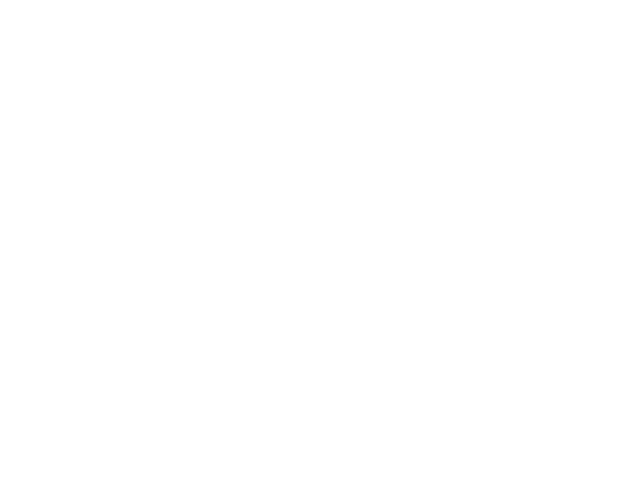

In [90]:
gd = (pval[thisfold].min(1)*4<0.01)
plt.figure()
plot_errorbars(usize,soriavg[thisfold][gd].mean(0).T,soriavg[thisfold][gd].mean(0).T,soriavg[thisfold][gd].mean(0).T)

In [76]:
usize

NameError: name 'usize' is not defined

In [32]:
facilitated = {}
suppressed = {}

for key in keylist:
    suppressed[key] = np.logical_and(ontarget,soriavg[key][:,0,-1]<soriavg[key][:,0,0])
    facilitated[key] = np.logical_and(ontarget,soriavg[key][:,0,-1]>soriavg[key][:,0,0])

In [33]:
s36 = soriavg.copy()
for key in keylist:
    if s36[key].shape[1]==5:
        s36[key] = s36[key][:,::2]

In [34]:
s36[keylist[2]].shape

IndexError: list index out of range

In [35]:
def concatenate_by_key(d_val,d_ind,keys):
    to_return = np.array(())
    for key in keys:
        vals = d_val[key]
        inds = d_ind[key].astype('bool')
        if to_return.shape[0]:
            to_return = np.concatenate((to_return,vals[inds]))
        else:
            to_return = vals[inds]
        return to_return

In [36]:
soriavg[keylist[-1]].shape

(1116, 4, 4)

In [37]:
s_supp = concatenate_by_key(s36,suppressed,keylist)
s_fac = concatenate_by_key(s36,facilitated,keylist)

In [38]:
def plot_bootstrapped_errorbars(x,arr,axis=0):
    lb,ub = ut.bootstrap(arr,np.mean,axis=axis,pct=(16,84))
    mn = arr.mean(axis)
    plot_errorbars(x,mn,lb,ub)

In [39]:
s_supp.shape

(517, 4, 4)

In [40]:
s_fac.shape

(599, 4, 4)

In [41]:
plt.figure()
plot_bootstrapped_errorbars(100*ucontrast,s_supp,axis=0)

<IPython.core.display.Javascript object>

ValueError: shape mismatch: objects cannot be broadcast to a single shape

<IPython.core.display.Javascript object>


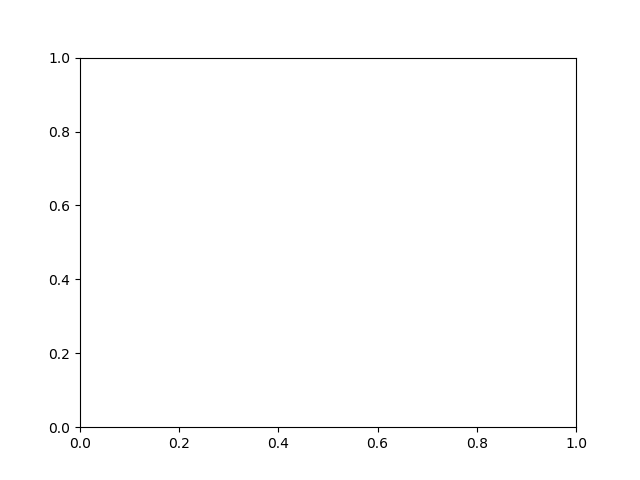

ValueError: shape mismatch: objects cannot be broadcast to a single shape

In [42]:
plt.figure()
plot_bootstrapped_errorbars(100*ucontrast,s_fac,axis=0)

In [ ]:
keylist_scatter = list(soriavg.keys())
for key in keylist_scatter:
    print(key)
keylist_scatter.remove(keylist_scatter[3])

In [43]:
np.linspace(5,36.5,5)

array([  5.   ,  12.875,  20.75 ,  28.625,  36.5  ])

In [44]:
keylist_scatter

NameError: name 'keylist_scatter' is not defined

In [2]:
# blcutoff = 1
# ds = 10
# blspan = 3000
# nbefore = 4
# nafter = 4
# def gen_trialwise(datafiles,blcutoff=blcutoff,blspan=blspan,frame_adjust=None): #nbefore=nbefore,nafter=nafter
#     trialwise = np.array(())
#     ctrialwise = np.array(())
#     strialwise = np.array(())
#     try:
#         for datafile in datafiles:
#             frm = sio.loadmat(datafile.replace('.rois','.mat'),squeeze_me=True)['info']['frame'][()][1:]
#             if frame_adjust:
#                 frm = frame_adjust(frm)
#             to_add = sio.loadmat(datafile,squeeze_me=True)['corrected']
#     #         baseline = np.percentile(to_add,blcutoff,axis=1)
#             baseline = sfi.percentile_filter(to_add[:,::ds],blcutoff,(1,int(blspan/ds)))
#             baseline = np.repeat(baseline,ds,axis=1)
#     #         if baseline.shape[1]<to_add.shape[1]:
#     #             baseline = np.hstack((baseline,np.repeat(baseline[:,-1],to_add.shape[1]-baseline.shape[1])))
#             if baseline.shape[1]>to_add.shape[1]:
#                 baseline = baseline[:,:to_add.shape[1]]
#             c = np.zeros_like(to_add)
#             s = np.zeros_like(to_add)
#             for i in range(c.shape[0]):
#     #                 dfof = (to_add[i]-baseline[i,np.newaxis])/baseline[i,np.newaxis]
#                 dfof = (to_add[i]-baseline[i,:])/baseline[i,:]
#                 c[i],s[i],_,_,_  = deconvolve(dfof,penalty=1)
#             to_add = ut.trialize(to_add,frm,nbefore,nafter)
#             c = ut.trialize(c,frm,nbefore,nafter)
#             s = ut.trialize(s,frm,nbefore,nafter)
#             try:
#                 trialwise = np.concatenate((trialwise,to_add),axis=0)
#                 ctrialwise = np.concatenate((ctrialwise,c),axis=0)
#                 strialwise = np.concatenate((strialwise,s),axis=0)
#             except:
#                 trialwise = to_add.copy()
#                 ctrialwise = np.concatenate((ctrialwise,c),axis=0)
#                 strialwise = np.concatenate((strialwise,s),axis=0)
#     except:
#         for datafile in datafiles:
#             frm = sio.loadmat(datafile.replace('.rois','.mat'),squeeze_me=True)['info']['frame'][()][1:]
#             if frame_adjust:
#                 frm = frame_adjust(frm)
#             if np.remainder(frm.shape[0],2):
#                 frm = frm[:-1]
#             with h5py.File(datafile,mode='r') as f:
#                 to_add = f['corrected'][:].T
#                 to_add[np.isnan(to_add)] = 0
#     #             baseline = np.percentile(to_add,blcutoff,axis=1)
#                 baseline = sfi.percentile_filter(to_add[:,::ds],blcutoff,(1,int(blspan/ds)))
#                 baseline = np.repeat(baseline,ds,axis=1)
#                 for i in range(baseline.shape[0]):
#                     baseline[i] = sfi.gaussian_filter1d(baseline[i],blspan/2)
#     #             if baseline.shape[1]<to_add.shape[1]:
#     #                 baseline = np.hstack((baseline,np.repeat(baseline[:,-1],to_add.shape[1]-baseline.shape[1])))
#                 if baseline.shape[1]>to_add.shape[1]:
#                     baseline = baseline[:,:to_add.shape[1]]
#                 c = np.zeros_like(to_add)
#                 s = np.zeros_like(to_add)
#                 for i in range(c.shape[0]):
#     #                 dfof = (to_add[i]-baseline[i,np.newaxis])/baseline[i,np.newaxis]
#                     dfof = (to_add[i]-baseline[i,:])/baseline[i,:]
#                     try:
#                         c[i],s[i],_,_,_  = deconvolve(dfof,penalty=1,sn=5e-3)
#                     except:
# #                         throwaway = 0
#                         print("in "+datafile+" couldn't do "+str(i))
#                 to_add_temp = ut.trialize(to_add,frm,nbefore,nafter)
#                 ctemp = ut.trialize(c,frm,nbefore,nafter)
#                 stemp = ut.trialize(s,frm,nbefore,nafter)
#                 try:
#                     trialwise = np.concatenate((trialwise,to_add_temp),axis=0)
#                     ctrialwise = np.concatenate((ctrialwise,ctemp),axis=0)
#                     strialwise = np.concatenate((strialwise,stemp),axis=0)
# #                     print(to_add.shape)
#                 except:
#                     trialwise = to_add_temp.copy()
#                     ctrialwise = ctemp.copy()
#                     strialwise = stemp.copy()
#     return trialwise,ctrialwise,strialwise

In [3]:
# def get_nbydepth(datafiles):
#     nbydepth = np.zeros((len(datafiles),))
#     for i,datafile in enumerate(datafiles):
#         with h5py.File(datafile,mode='r') as f:
#             nbydepth[i] = (f['corrected'][:].T.shape[0])
#     return nbydepth

In [4]:
# ret = {}
# paramdict = {}
# pval = {}
# trialrun = {}
# nbydepth = {}
# spont = {}

In [5]:
#     def gen_traces(datafiles,blcutoff=blcutoff,blspan=blspan): #nbefore=nbefore,nafter=nafter
#         trialwise = np.array(())
#         ctrialwise = np.array(())
#         strialwise = np.array(())
#         dfofall = np.array(())
#         baselineall = np.array(())
#         for datafile in datafiles:
#             frm = sio.loadmat(datafile.replace('.rois','.mat'),squeeze_me=True)['info']['frame'][()][2:-10]
#             with h5py.File(datafile,mode='r') as f:
#                 to_add = f['corrected'][:].T
#                 to_add[np.isnan(to_add)] = 0
#     #             baseline = np.percentile(to_add,blcutoff,axis=1)
#                 baseline = sfi.percentile_filter(to_add[:,::ds],blcutoff,(1,int(blspan/ds)))
#                 baseline = np.repeat(baseline,ds,axis=1)
#                 for i in range(baseline.shape[0]):
#                     baseline[i] = sfi.gaussian_filter1d(baseline[i],blspan/2)
#     #             if baseline.shape[1]<to_add.shape[1]:
#     #                 baseline = np.hstack((baseline,np.repeat(baseline[:,-1],to_add.shape[1]-baseline.shape[1])))
#                 if baseline.shape[1]>to_add.shape[1]:
#                     baseline = baseline[:,:to_add.shape[1]]
#                 c = np.zeros_like(to_add)
#                 s = np.zeros_like(to_add)
#                 dfof = np.zeros_like(to_add)
#                 for i in range(c.shape[0]):
#     #                 dfof = (to_add[i]-baseline[i,np.newaxis])/baseline[i,np.newaxis]
#                     dfof[i] = (to_add[i]-baseline[i,:])/baseline[i,:]
#                     try:
#                         c[i],s[i],_,_,_  = deconvolve(dfof[i],penalty=1,sn=5e-3)
#                     except:
# #                         throwaway = 0
#                         print("in "+datafile+" couldn't do "+str(i))
#                 try:
#                     trialwise = np.concatenate((trialwise,to_add),axis=0)
#                     ctrialwise = np.concatenate((ctrialwise,c),axis=0)
#                     strialwise = np.concatenate((strialwise,s),axis=0)
#                     dfofall = np.concatenate((dfofall,dfof),axis=0)
#                     baselineall = np.concatenate((baselineall,baseline),axis=0)
#                 except:
#                     trialwise = to_add.copy()
#                     ctrialwise = c.copy()
#                     strialwise = s.copy()
#                     dfofall = dfof.copy()
#                     baselineall = baseline.copy()
#         return trialwise,ctrialwise,strialwise,dfofall,baselineall

In [6]:
# def analyze_size_contrast(datafiles,stimfile,retfile=None,frame_adjust=None,rg=(1,0)):
#     nbydepth = get_nbydepth(datafiles)
#     trialwise,ctrialwise,strialwise,dfof = ut.gen_precise_trialwise(datafiles,frame_adjust=frame_adjust,rg=rg,nbefore=nbefore,nafter=nafter)
#     zstrialwise = sst.zscore(strialwise.reshape((strialwise.shape[0],-1)).T).T.reshape(strialwise.shape)
    
#     result = sio.loadmat(stimfile,squeeze_me=True)['result'][()]
    
#     infofile = sio.loadmat(datafiles[0][:-12]+'.mat',squeeze_me=True) # original .mat file
#     frame = infofile['info'][()]['frame'][()][1:]
#     if frame_adjust:
#         frame = frame_adjust(frame)
#     if np.remainder(frame.shape[0],2):
#         frame = frame[:-1]
    
#     data = strialwise #[:,:,nbefore:-nafter]
    
#     try:
#         dxdt = sio.loadmat(datafiles[1],squeeze_me=True)['dxdt']
#     except:
#         with h5py.File(datafiles[1],mode='r') as f:
#             dxdt = f['dxdt'][:].T
            
#     trialrun = np.zeros(frame[0::2].shape)
#     for i in range(len(trialrun)):
#         trialrun[i] = dxdt[frame[0::2][i]:frame[1::2][i]].mean()
#     runtrial = trialrun>50
    
#     pval = np.zeros(strialwise.shape[0])
#     for i in range(strialwise.shape[0]):
#         _,pval[i] = sst.ttest_rel(strialwise[i,:,nbefore-1],strialwise[i,:,nbefore+1])
        
#     stimparams = result['stimParams']
        
#     indexlut,stimp = np.unique(stimparams,axis=1,return_inverse=True)
    
#     angle = stimparams[0]
#     size = stimparams[1]
#     contrast = stimparams[4]
    
#     ucontrast = np.unique(contrast)
#     uangle = np.unique(angle)
#     usize = np.unique(size)
#     ncontrast = len(ucontrast)
#     nangle = len(uangle)
#     nsize = len(usize)
    
#     angle180 = np.remainder(angle,180)
#     uangle180 = np.unique(angle180)
#     nangle180 = len(uangle180)
    
#     Smean = np.zeros((zstrialwise.shape[0],nangle180,nsize,ncontrast,zstrialwise.shape[2]))
#     Stavg = np.zeros((zstrialwise.shape[0],nangle180,nsize,ncontrast,int(zstrialwise.shape[1]/nangle/nsize/ncontrast)))
    
#     Strials = {}
#     Sspont = {}
#     for i in range(nangle180):
#         for j in range(nsize):
#             for k in range(ncontrast):
#                 lkat = np.logical_and(runtrial,np.logical_and(angle180==uangle180[i],np.logical_and(size==usize[j],contrast==ucontrast[k])))
#                 Smean[:,i,j,k,:] = data[:,lkat,:].mean(1)
#                 Strials[(i,j,k)] = data[:,lkat,nbefore:-nafter].mean(2)
#                 Sspont[(i,j,k)] = data[:,lkat,:nbefore].mean(2)
    
#     lb = np.zeros((strialwise.shape[0],nangle180,nsize,ncontrast))
#     ub = np.zeros((strialwise.shape[0],nangle180,nsize,ncontrast))
#     # mn = np.zeros((strialwise.shape[0],nangle180,nsize,ncontrast))
    
#     for i in range(nangle180):
#         print(i)
#         for j in range(nsize):
#             for k in range(ncontrast):
#                 if Strials[(i,j,k)].size:
#                     lb[:,i,j,k],ub[:,i,j,k] = ut.bootstrap(Strials[(i,j,k)],np.mean,axis=1,pct=(16,84))
#                 else:
#                     lb[:,i,j,k] = np.nan
#                     ub[:,i,j,k] = np.nan
#                 # mn[:,i,j,k] = np.nanmean(Strials[(i,j,k)],axis=1)
    
#     pval = np.zeros((strialwise.shape[0],nangle180))
# #     for i in range(pval.shape[0]):
# #         print(i)
#     for j,theta in enumerate(uangle180):
#         print(theta)
#         _,pval[:,j] = sst.ttest_rel(Sspont[(j,0,ncontrast-1)],Strials[(j,0,ncontrast-1)],axis=1)
                
#     Savg = np.nanmean(np.nanmean(Smean[:,:,:,:,nbefore:-nafter],axis=-1),axis=1)
    
#     spont = np.zeros((Savg.shape[0],))
#     keylist = list(Sspont.keys())
#     nkeys = len(keylist)
#     for key in Sspont.keys():
#         spont = spont + Sspont[key].mean(1)/nkeys
#     # _,pval = sst.ttest_ind(Storiavg[:,0,-1].T,Storiavg[:,0,0].T)
    
#     #suppressed = np.logical_and(pval<0.05,Savg[:,0,-1]<Savg[:,0,0])
#     #facilitated = np.logical_and(pval<0.05,Savg[:,0,-1]>Savg[:,0,0])
    
#     return Savg,Smean,lb,ub,pval,spont

In [7]:
# soriavg = {}
# strialavg = {}
# lb = {}
# ub = {}
# pval = {}
# nbydepth = {}

In [8]:
# folds = []

In [9]:
# def analyze_everything(folds,files,rets,adjust_fns):
#     soriavg = {}
#     strialavg = {}
#     lb = {}
#     ub = {}
#     pval = {}
#     nbydepth = {}
#     spont = {}
#     datafoldbase = '/home/mossing/scratch/2Pdata/'
#     stimfoldbase = '/home/mossing/scratch/visual_stim/'
#     for thisfold,thisfile,retnumber,frame_adjust in zip(folds,files,rets,adjust_fns):
#         datafold = datafoldbase+thisfold+'ot/'
#         datafiles = [thisfile+'_ot_'+number+'.rois' for number in ['000','001','002','003']]

#         stimfold = stimfoldbase+thisfold
#         stimfile = thisfile+'.mat'

#         datafiles = [datafold+file for file in datafiles]
#         stimfile = stimfold+stimfile
#         retfile = datafoldbase+thisfold+'retinotopy_'+thisfile[-3:]+'.mat'

#         nbefore = 4
#         nafter = 4

#         soriavg[thisfold],strialavg[thisfold],lb[thisfold],ub[thisfold],pval[thisfold],spont[thisfold] = analyze_size_contrast(datafiles,stimfile,retfile,frame_adjust)
#         nbydepth[thisfold] = get_nbydepth(datafiles)
#     return soriavg,strialavg,lb,ub,pval,nbydepth,spont